# **Consumo y Demanda de Energía en Sistemas de Potencia**

### **Objetivo**

Poner en práctica los conceptos y temas vistos en el curso propedéutico, a fin de plantear propuestas de aproximación para el análisis del comportamiento del consumo y la demanda de Energía Eléctrica (EE) en un sistema de potencia.

### **Contenido:**

+ Definiciones

+ Planteamientos de aproximación propuestos:

> Pronóstico de la demanda y consumo

> Cálculo de energía consumida

+ Visualización de datos

+ Modelado del fenómeno (demanda/consumo de EE)

> Interpolación/Extrapolación

> Integrador de funciones

+ Conclusiones

### **Definiciones**

*Algunas son extraídas del documento Programa de Ampliación y Modernización de la RNT y RGD (PAM 2019-2033)*

#### Energía eléctrica (contexto social)
La energía eléctrica es un bien esencial e integral para el desarrollo de las actividades productivas y de conversión económica del Estado, así como también para la transformación social ya que incide de forma directa en los servicios básicos para la población.

#### Sistema Eléctrico de Potencia (SEP)
Conjunto de elementos (infraestuctura) conectados entre sí que permiten suministrar energía eléctrica a la población, pasando por tres grandes procesos Generación - Transmisión - Distribución.

#### Demanda de energía eléctrica (instantánea)
Se refiere al valor instantáneo que toma una carga eléctrica, la cual puede estar conformada por diferentes los tipos de elementos que consumen energía eléctrica y que se conectan al SEP.

#### Consumo energía eléctrica o demanda integrada
Se refiere a la energía consumida por una carga en un lapso de tiempo. Debido a los volúmenes de energía que se manejan en los SEP generalmente se emplea la unidad "MWh" que representa la energía consumida por una carga de 1 MW en el lapso de una hora).

#### Correlación de la demanda y consumo con otros factores
El crecimiento de la demanda máxima y el consumo de electricidad está sujeto a diversos factores entre los más determinantes se encuentran: **Crecimiento económico, poblacional, estacionalidad, precio de la electricidad, pérdidas (técnicas y no técnicas), eficiencia energética, matriz de consumo**

#### Base de datos de trabajo
La base de datos con la que se trabjó en la nota hacen referencia a la demanda histórica (instantánea e integrada) de la región occidente del país. Las muestras obtenidas son con resolución de 1 hora.

### **Planteamientos**

**1 - Pronóstico de la demanda y consumo**
Dada una estadística de valores de demanda y consumo (de septiembre de 2017 a julio de 2020 –BD de trabajo) se pretende caracterizar un modelo polinomial para estimar los valores de demanda/consumo de los próximos meses.

**¿Por qué?**
El pronóstico del consumo y la demanda de energía eléctrica es una actividad esencial para la operación y planeación de los sistemas de potencia, a fin de garantizar su correcta operación en los diferentes horizontes de tiempo.

**2 - Cálculo del consumo de energía**
La información de consumo recabada en la BD de trabajo se calcula utilizando promedios para cada intervalo de 1 hora. Se desea calcular la energía de el mismo periodo utilizando funciones aproximadas que se ajusten a la forma de la curva de demanda y compararlas.

**¿Por qué?**
Es importante definir la granularidad de la información que se puede obtener de los sistemas de registros. Considerar periodos menores a 1 hora podría significar una gran cantidad de recursos para su almacenamiento y procesamiento. Por eso es importante definir hasta qué grado se pueden obtener estimaciones adecuadas con diferentes espaciamiento en las muestras. 

## **Visualización de Datos**

Para darnos una idea de cómo se comportan los datos, mostraremos los *dataframes* así como las gráficas correspondientes a distintos periódos.

In [1]:
import numpy as np
import pandas as pd

In [2]:
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
from utils import MSE

In [4]:
from numerical_integration import Tcf, Rcf

El dataframe con el que se hará parte del análisis se muestra a continuación, el cual contiene los datos de la demanda integrada e instantánea de energía del oriente de México desde el primero de Septiembre del año 2017 hasta el 20 de Febrero del año actual 2020.

In [5]:
# Dataset de trabajo
data_horas = pd.read_csv("Datos_csv.csv")
data_horas.head(5)

,muestras,anio,fecha,hora_inicio,hora_fin,dema_int,dem_inst,aniomovil
0,1,2017,01-sep,0,1,6872.013385,6976.172363,1
1,2,2017,01-sep,1,2,6660.573651,6709.388672,1
2,3,2017,01-sep,2,3,6504.232961,6568.017090,1
3,4,2017,01-sep,3,4,6435.836442,6502.294434,1
4,5,2017,01-sep,4,5,6437.741557,6384.402344,1


Los datos relacionados a la estadística descriptiva de estos datos es la sigueinte

In [5]:
list_int = np.array(list(data_horas["dema_int"]))
list_inst = np.array(list(data_horas["dem_inst"]))

In [6]:
data_int = pd.DataFrame(list_int , columns = ['Demanda Integrada']) 
data_inst = pd.DataFrame(list_inst , columns = ['Demanda Instantánea']) 
data_int['Demanda Instantánea'] = data_inst['Demanda Instantánea']
data_int.head(5)

,Demanda Integrada,Demanda Instantánea
0,6872.013385,6976.172363
1,6660.573651,6709.388672
2,6504.232961,6568.017090
3,6435.836442,6502.294434
4,6437.741557,6384.402344


In [7]:
data_int.describe()

,Demanda Integrada,Demanda Instantánea
count,25152.000000,25152.000000
mean,7745.438583,7734.933778
std,974.363777,977.956108
min,4288.339301,4230.882324
25%,7011.455212,6998.106567
50%,7807.317117,7794.049072
75%,8484.490007,8478.522950
max,10567.494660,11267.710940


Lo que se puede observar es que los máximos distan mucho del promedio, veremos más adelante que estos dos picos presentan mucha diferencia en comparación con el resto de los datos para abos casos.

## **Visualización de Valores Representativos de Diferentes Periodos**

Algunos datos relevantes son los siguientes
- 25,152 registros horaios de la demanda y su respectivo consumo
- Periodo de las muestras recolectadas (01-sep-2017 a 14-jul-2020)
- Demandas máximas del periodo:
  > 10,567 MWh (integrada)
  > 11,267 MW  (instantánea)
- Demandas mínimas del periodo:
  > 4,288 MWh (integrada)
  > 4,230 MW  (instantánea)
- Demandas promedio del periodo:
  > 7, MWh (integrada)
  > 4,230 MW  (instantánea)

### **Considerando valores por día (cada 24 muestras horarias)**

In [51]:
data_2 = pd.read_csv("Datos_csv.csv")

In [52]:
n_datos = len(data_2.muestras)
rango = 1*24 # (número de muestras horarias en el periodo de 1 día = 24 horas)
aux = round(len(data_2.muestras)/rango)-1
print(" Muestras > muestras en subperiodos? \n", n_datos > rango*aux) # Para saber el número de datos que se utilizarían
print(" Muestras faltantes: ", n_datos-rango*aux, "\n Subperiodos considerados: ", aux)

 Muestras > muestras en subperiodos? 
 True
 Muestras faltantes:  24 
 Subperiodos considerados:  1047


Recopilando la información por subperiodo, considerando:
+ Valor Máximo
+ Promedio
+ Valor Mínimo

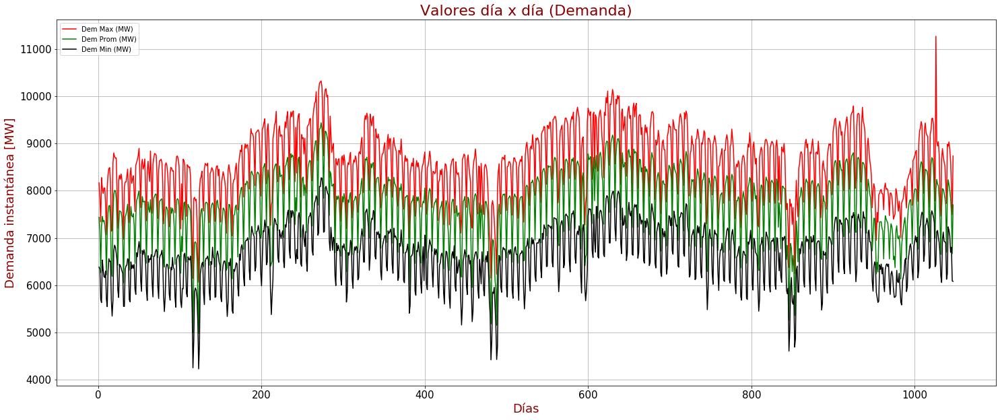

In [8]:
# Arreglos con las demandas integradas máxima, promedios y mínimas del rango seleccionado
max_itg = []
prom_itg = []
min_itg = []

dem_sub = []

# Arreglos con las demandas instantáneas máxima, promedios y mínimas del rango seleccionado
max_ins = []
prom_ins = []
min_ins = []
aux2 = 0

for i in range(aux):
    piv = []
    piv2 = []
    for k in range(rango):
        piv.append(data_2.dema_int[aux2])
        piv2.append(data_2.dem_inst[aux2])
        aux2 = aux2 + 1
    max_itg.append(max(piv))
    min_itg.append(min(piv))
    prom_itg.append(np.array(piv).mean())
    dem_sub.append(sum(piv)/1000) # En GWh
    max_ins.append(max(piv2))
    min_ins.append(min(piv2))
    prom_ins.append(np.array(piv2).mean())
    
x_d = np.linspace(1, len(max_ins), len(max_ins))

plt.figure(figsize=(25,10))
plt.plot(x_d, max_ins, 'r-', x_d, prom_ins, 'g-', x_d, min_ins, 'k-')
plt.legend(['Dem Max (MW)','Dem Prom (MW)','Dem Min (MW)'], loc='best')
plt.title("Valores día x día (Demanda)", fontsize = 22, color ='darkred')
plt.xlabel('Días', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda instantánea [MW]', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.savefig('Demanda_1.png')
plt.grid(True)

Algo a destacar es que independientemente de qué tipo de dato se tome, las curvas que describen las tres gráficas son muy similares entre si.

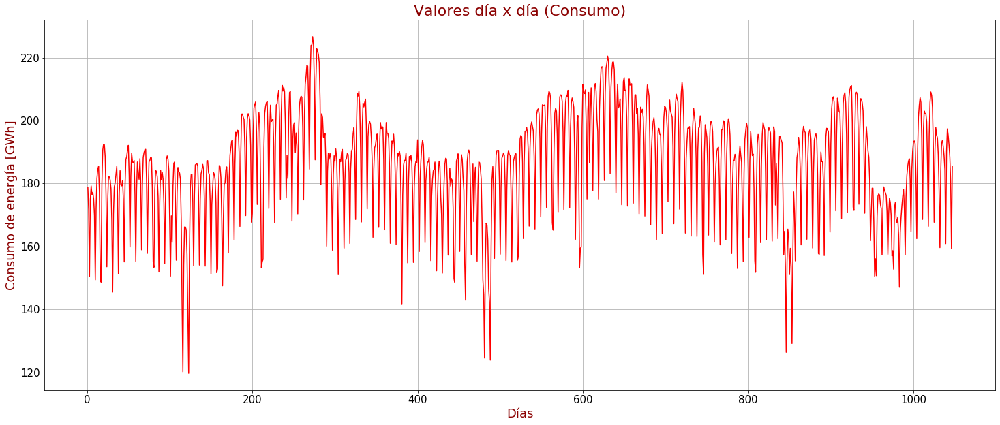

In [9]:
plt.figure(figsize=(25,10))
plt.plot(x_d, dem_sub, 'r-')
plt.title("Valores día x día (Consumo)", fontsize = 22 , color = 'darkred')
plt.xlabel('Días', fontsize = 18 , color = 'darkred')
plt.ylabel('Consumo de energía [GWh]', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_2.png')
plt.show()

### **Considerando valores por semana (cada 7 días)**

In [59]:
n_datos = len(data_2.muestras)
rango = 7*24 # (número de muestras horarias en el periodo de 7 días = 1 semana)
aux = round(len(data_2.muestras)/rango)-1
print(" Muestras > muestras en subperiodos? \n", n_datos > rango*aux) # Para saber el número de datos que se utilizarían
print(" Muestras faltantes: ", n_datos-rango*aux, "\n Subperiodos considerados: ", aux)

 Muestras > muestras en subperiodos? 
 True
 Muestras faltantes:  120 
 Subperiodos considerados:  149


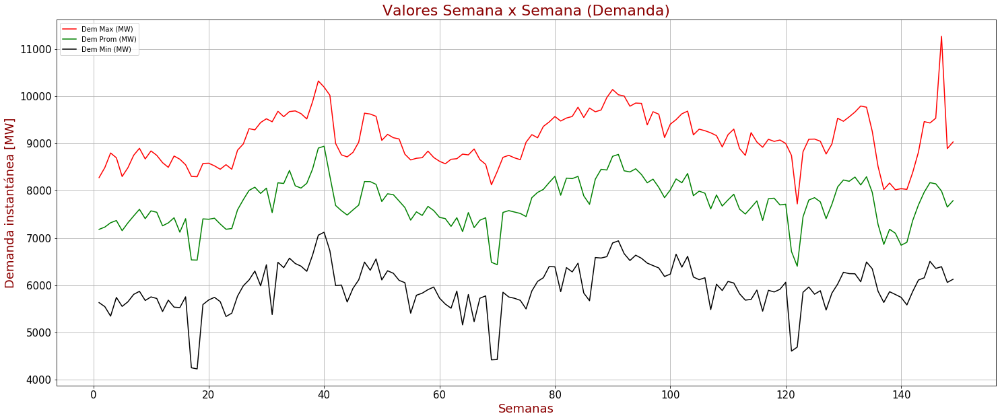

In [11]:
# Arreglos con las demandas integradas máxima, promedios y mínimas del rango seleccionado
max_itg = []
prom_itg = []
min_itg = []

dem_sub = []

# Arreglos con las demandas instantáneas máxima, promedios y mínimas del rango seleccionado
max_ins = []
prom_ins = []
min_ins = []
aux2 = 0

for i in range(aux):
    piv = []
    piv2 = []
    for k in range(rango):
        piv.append(data_2.dema_int[aux2])
        piv2.append(data_2.dem_inst[aux2])
        aux2 = aux2 + 1
    max_itg.append(max(piv))
    min_itg.append(min(piv))
    prom_itg.append(np.array(piv).mean())
    dem_sub.append(sum(piv)/1000)
    max_ins.append(max(piv2))
    min_ins.append(min(piv2))
    prom_ins.append(np.array(piv2).mean())
    
x_d = np.linspace(1, len(max_ins), len(max_ins))

plt.figure(figsize=(25,10))
plt.plot(x_d, max_ins, 'r-' , x_d, prom_ins, 'g-' , x_d, min_ins, 'k-')
plt.legend(['Dem Max (MW)','Dem Prom (MW)','Dem Min (MW)'], loc='best')
plt.title("Valores Semana x Semana (Demanda)", fontsize = 22 , color ='darkred')
plt.xlabel('Semanas', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda instantánea [MW]', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_3.png')
plt.show()

De nuevo las similitudes entre las gráficas aparece, siendo muy parecidas entre como arriba se observó en otro gráfico, salvó unos valles como se aprecia en la gráfica de color rojo, los cuales no son suaves a diferencia de los otros dos..

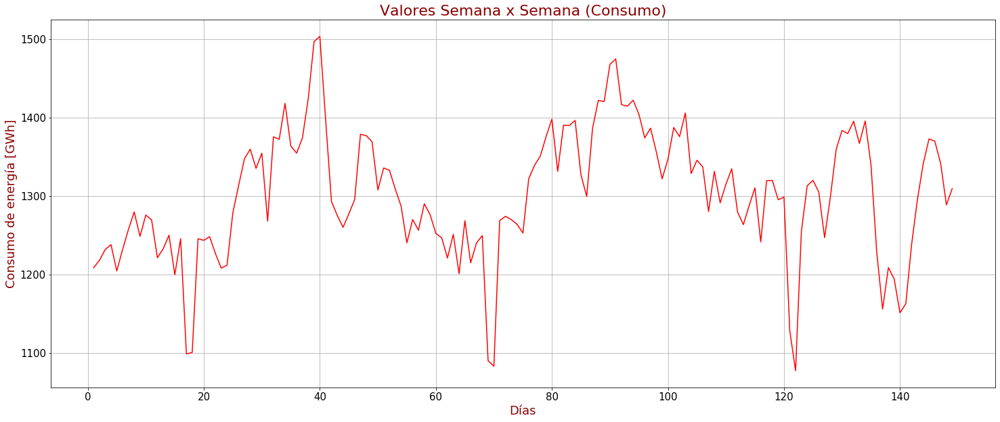

In [12]:
plt.figure(figsize=(25,10))
plt.plot(x_d, dem_sub, 'r-')
plt.title("Valores Semana x Semana (Consumo)", fontsize = 22 , color ='darkred')
plt.xlabel('Días', fontsize = 18 , color = "darkred")
plt.ylabel('Consumo de energía [GWh]', fontsize= 18, color = "darkred")
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_4.png')
plt.show()

### **Considerando valores cada 30 días (~ cada mes)**

In [13]:
n_datos = len(data_2.muestras)
rango = 30*24 # (número de muestras horarias en el periodo de 7 días = 1 semana)
aux = round(len(data_2.muestras)/rango)-1
print(" Muestras > muestras en subperiodos? \n", n_datos > rango*aux) # Para saber el número de datos que se utilizarían
print(" Muestras faltantes: ", n_datos-rango*aux, "\n Subperiodos considerados: ", aux)

 Muestras > muestras en subperiodos? 
 True
 Muestras faltantes:  672 
 Subperiodos considerados:  34


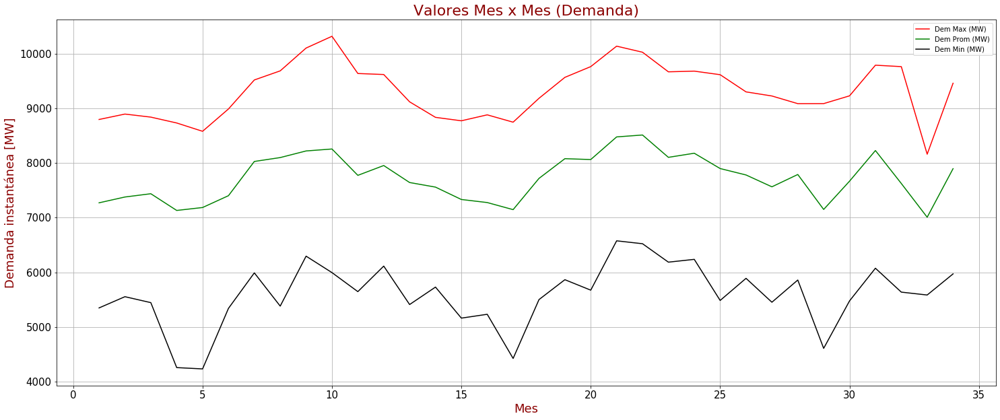

In [14]:
# Arreglos con las demandas integradas máxima, promedios y mínimas del rango seleccionado
max_itg = []
prom_itg = []
min_itg = []

dem_sub = []

# Arreglos con las demandas instantáneas máxima, promedios y mínimas del rango seleccionado
max_ins = []
prom_ins = []
min_ins = []
aux2 = 0

for i in range(aux):
    piv = []
    piv2 = []
    for k in range(rango):
        piv.append(data_2.dema_int[aux2])
        piv2.append(data_2.dem_inst[aux2])
        aux2 = aux2 + 1
    max_itg.append(max(piv))
    min_itg.append(min(piv))
    prom_itg.append(np.array(piv).mean())
    dem_sub.append(sum(piv)/1000)
    max_ins.append(max(piv2))
    min_ins.append(min(piv2))
    prom_ins.append(np.array(piv2).mean())
    
x_d = np.linspace(1, len(max_ins), len(max_ins))

plt.figure(figsize=(25,10))
plt.plot(x_d, max_ins, 'r-' , x_d, prom_ins, 'g-' , x_d, min_ins, 'k-')
plt.legend(['Dem Max (MW)','Dem Prom (MW)','Dem Min (MW)'], loc='best')
plt.title("Valores Mes x Mes (Demanda)", fontsize = 22 , color ='darkred')
plt.xlabel('Mes', fontsize = 18 , color = "darkred")
plt.ylabel('Demanda instantánea [MW]', fontsize = 18 , color = "darkred")
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_5.png')
plt.show()

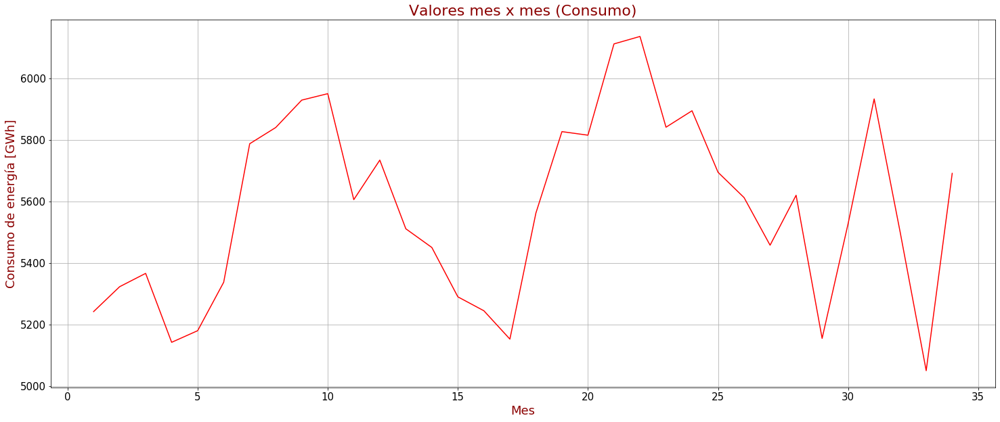

In [15]:
plt.figure(figsize=(25,10))
plt.plot(x_d, dem_sub, 'r-')
plt.title("Valores mes x mes (Consumo)", fontsize = 22 , color = 'darkred')
plt.xlabel('Mes', fontsize = 18 , color = "darkred")
plt.ylabel('Consumo de energía [GWh]' , fontsize = 18 , color = "darkred")
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_6.png')
plt.show()

A continuación se obtendrán los interpoladores para distintas medidas de tiempo con el objetivo de ver si se simplifican suficiente los datos para hallar un modelo simple que describa el conjunto de datos. En este caso, se usarán interpoladores y splines cúbicos.

# **Modelado del Fenómeno (Demanda/Consumo de EE)**

## **Demanda Instantánea**

En esta sección nos restringiremos a anañizar dos modelos con el  porpósito de determinar cual se ajusta mejor a los datos sin hacer **sobreajuste**. Para ello, se tomarán conjuntos de aproximadamente el $\% 80$ de lo datos a analizar para hacer el ajuste mientras qu el otro $\% 20$ de los datos nos servirá para ver si el modelo también describe este conjunto.

Por otro lado, tomaremos los promedios por día, semana y meses para simplificar el conjunto a modelar y que el modelo sea más sencillo.

### **Demanda Instantánea Promedio Por Hora**

Nos interesa, de momento, encontrar un modelo fiable que se ajuste a los datos de la demanda instantánea donde todos los promedios por hora luce de la siguiente forma

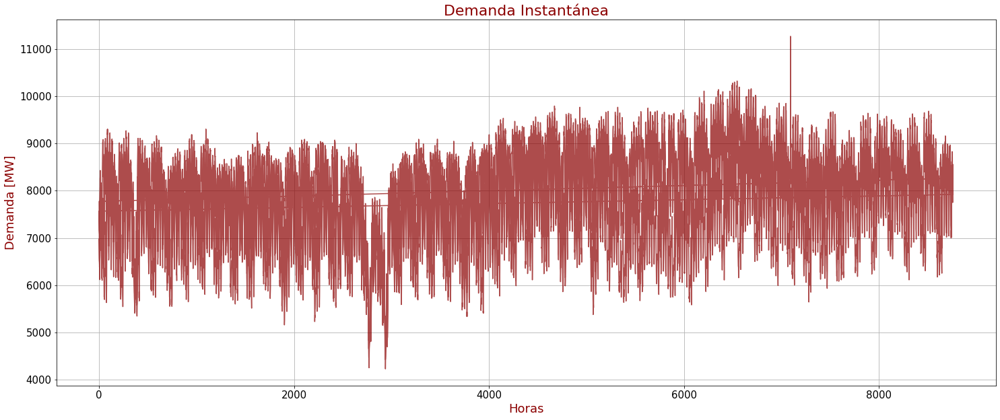

In [8]:
plt.figure(figsize=(25,10))
plt.plot(data_horas.muestras, data_horas.dem_inst, 'b-', color = 'darkred' , alpha = 0.7)
plt.title("Demanda Instantánea" , fontsize = 22 , color = 'darkred')
plt.xlabel("Horas" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_Instantanea.png')
plt.show()

Como vemos, los datos presentan muchas oscilaciones, por lo cual es conveniente hacer menos complejo el sistema como se mencionó anteriormente.


## **Interpoladores Para la Demana Instantánea**

A lo largo de este análisis con interpoladores, tanto para la demanda instantánea y la demanda integrada (consumo), nos asistiremos de la función *polyfit()* ya que con ella podemos hallar el ajuste de un cjonunto de datos a un polinomio de un grado en específico.

La documentación de tal función es la siguiente:

#### **numpy.polyfit** 

El primer acercamiento para aproximar el consumo y demanda de energía eléctrica, se realizó con ayuda de la función `numpy.polyfit`:

Esta función se utilizó de la siguiente forma:

`numpy.polyfit(x, y, deg)`

Donde estos son los argumentos:
+ `x`: Conjunto de datos a interpolar, valores en el eje x.
+ `y`: Conjunto de datos a interpolar, valores en el eje y.
+ `deg`: Grado $n$ del polinomio a ajustar (siendo $n$ 1 menos del total de puntos a interpolar).

Esta función arroja los coeficientes del polinomio de grado $n$, con los que podemos aproximarnos a los puntos a interpolar.

El grado máximo del polinomio con el que se puede trabajar en `numpy.polyfit` es de 140, por lo que se estuvo trabajando con distintos segmentos de los datos disponibles.


### **Polinomio Para la Demanda Instantánea Diaria**

De acuerdo a los datos del análisis descriptivo se cuentan con 25152 registros de horas, por ello, sacaremos los promedios de cada 24 registros consecutivos para obtener el promedio de la demanda diaría.

In [16]:
horas_tot = 25152 # Horas totales registradas
num_d = int(horas_tot/24)
prom_dia = []
for i in range(0,num_d):
    ini = 24*i
    end = 24*(1+i)
    data_i = data_horas[ini:end]
    prom_dia.append(data_i["dem_inst"].mean())

In [17]:
prom_a_dia = np.array(prom_dia)
x_dia = np.array(list(range(1,len(prom_dia)+1)))

In [18]:
mpoints = len(prom_dia)
x_dia_grph_1 = np.linspace(min(x_dia) , max(x_dia) , mpoints)
y_dia_grph_1 = np.array(prom_dia)

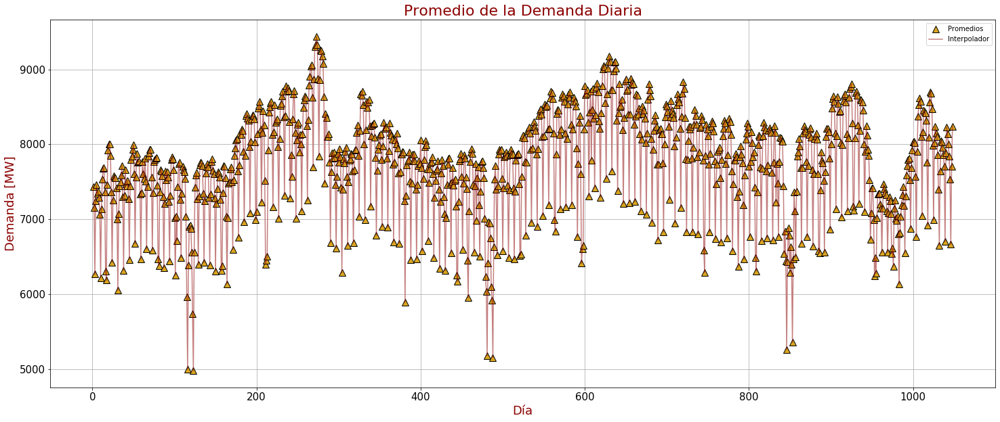

In [19]:
plt.figure(figsize=(25,10))
plt.plot(x_dia , prom_a_dia , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_dia_grph_1 , y_dia_grph_1 , color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Día" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Dia.png')
plt.show()

La función *polyfit()* sólo acepta hasta un número máximo para el grado del polinomio para interpolar, afortunamdamente, sólo  tomaremos una muestra cada cinco días de los promedios diarios del $80\%$ de los datos para hacer el interpolador con un polinomio de grado 140, siendo este número el máximo número que acepta para el grado del interpolador.

In [20]:
n_m = []
x = []
k = 0
n_puntos = 100 # Solo submúltiplos de 800, que representan el 76% de los datos
for i in range(n_puntos):
    n_m.append(k)
    x.append(k)
    k = int(k+(800/n_puntos))

y = []
for i in range(len(x)):
    y.append(prom_dia[n_m[i]])

coef_aj = np.polyfit(x, y, len(x))

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval = np.polyval(coef_aj,xeval)

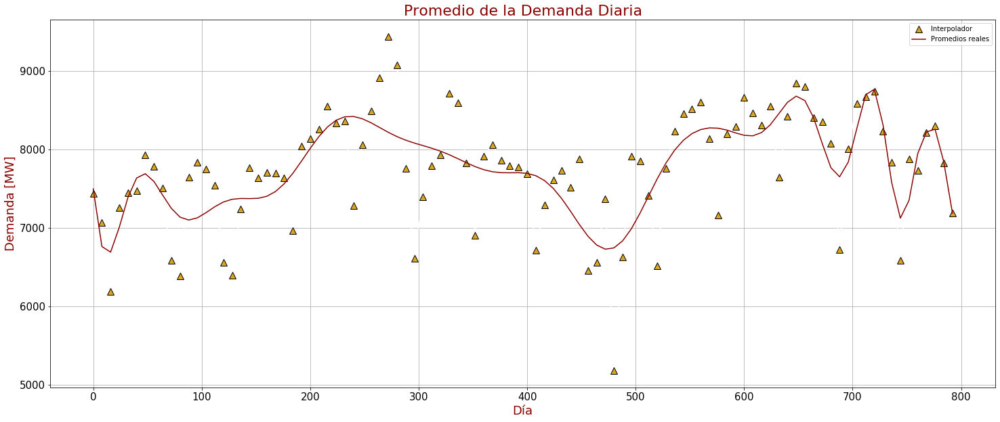

In [21]:
plt.figure(figsize=(25,10))
plt.plot(x , y , 'k-', color = 'white',
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval, 'b-', color = 'darkred')     
plt.title("Promedio de la Demanda Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Día" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Interpolador","Promedios reales","Muestras"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Dia_Inter.png')
plt.show()

A pesar de que el grado del polinomio es alto, no se ajusta perfectamente a los datos e incluso se observa que en algunas regiones se presentan granden diferencia entre el modelo y los datos.

Lo que resta ahora es poner a prueba este modelo con el resto de los datos con el objetivo de observar si este los describe

In [22]:
mpoints = len(prom_dia) + 1
x_dia_grph_2 = np.linspace(min(x_dia) , max(x_dia) , mpoints)
y_dia_grph_2 = np.polyval(coef_aj , x_dia_grph_2)

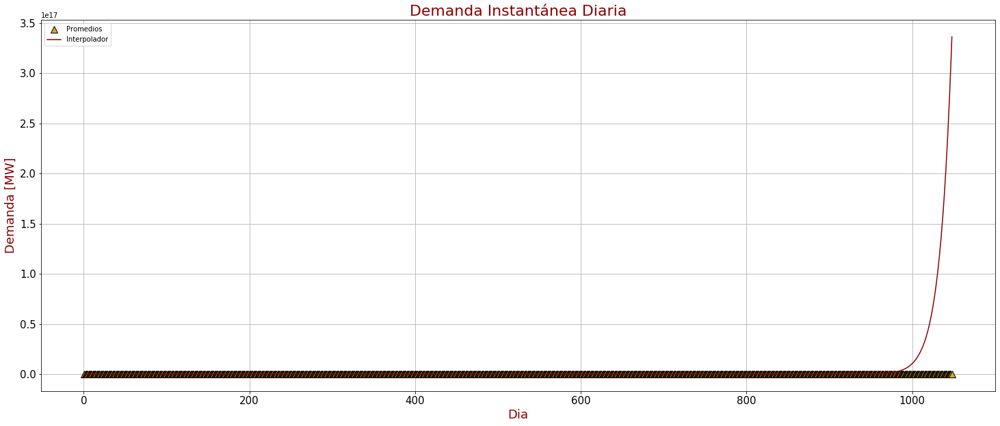

In [23]:
plt.figure(figsize=(25,10))
plt.plot(x_dia , prom_dia , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_dia_grph_2 , y_dia_grph_2 , color = 'darkred')
plt.title("Demanda Instantánea Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Dia" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Dia_Inter_2.png')
plt.show()

Hagamos un acercamiento a la región donde el interpolador diverge de los promedios diarios

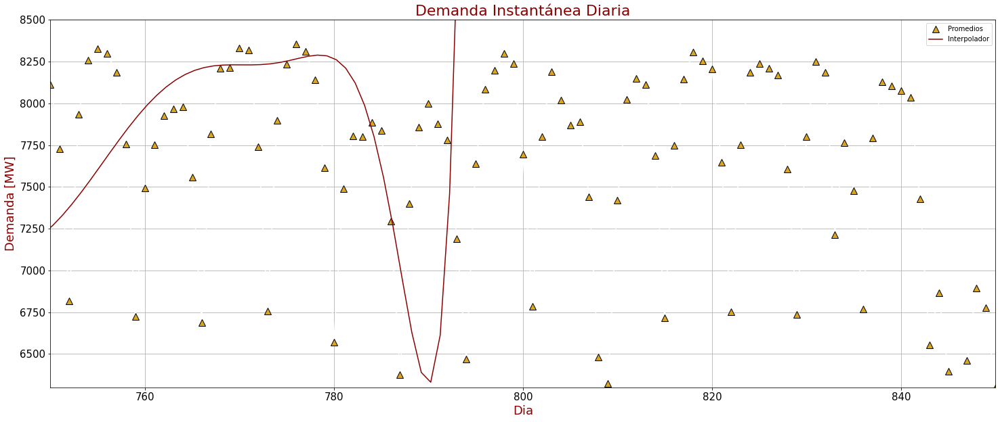

In [68]:
plt.figure(figsize=(25,10))
plt.plot(x_dia , prom_dia , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_dia_grph_2 , y_dia_grph_2 , color = 'darkred')
plt.title("Demanda Instantánea Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Dia" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlim(750,850)
plt.ylim(6300,8500)
plt.grid(True)
plt.savefig('Promedio_Demanda_Dia_Inter_3.png')
plt.show()

Tal como se ve la primera gráfica con el conjunto de prueba, nuestro modelo diverge y no puede describir ese conjunto de puntos por lo que se determina que en este caso el interpolador no es un modelo adecuado.

### **Interpolador Para la Demanda Instantánea Semanal**

Ahora por semana, indistitanmente de a qué mes pertenezca, los días restantes se promediarán y se contarán como otra semana como se verá más adelante.

De acuerdo a las pruebas hechas nos damos cuenta que el límite del grado del polinomio que acepta, en este caso, polyfit, es 141. Sin embargo, para poner a prueba nuestro modelo, sólo necesitaremos el $80\%$ de los datos y el otro $20\%$ para hacer el test gráfico del modelo

In [26]:
data_dia = pd.DataFrame(prom_dia, columns = ['Promedio'])
dia = pd.DataFrame(x_dia, columns = ['Dia']) 
data_dia['Dia'] = dia['Dia']

num_s = int(len(data_dia)/7)
prom_sem = []
for i in range(0,num_s):
    ini = 7*i
    end = 7*(1+i)
    data_i = data_dia[ini:end]
    prom_sem.append(data_i["Promedio"].mean())

Agreguemos ahora el promedio de los otros seis días restantes

In [27]:
prom_sem.append(data_dia[num_s*7: num_s*7 + 6]["Promedio"].mean())
prom_a_sem = np.array(prom_sem)
x_sem = np.array(list(range(1,len(prom_sem)+1)))

Mostremos los últimos cinco datos de los promedios semanales los cuales nos servirán más adelante para contrastar con el cnojunto de entrenamiento.

In [28]:
data_sem = pd.DataFrame(prom_sem, columns = ['Promedio']) 
sem = pd.DataFrame(x_sem, columns = ['Semana']) 
data_sem['Semana'] = sem['Semana']
data_sem.tail(5)

,Promedio,Semana
145,8146.903320,146
146,7993.790376,147
147,7654.957781,148
148,7790.388611,149
149,7596.880754,150


Si contamos los seis días restantes como otras semana se tiene 150 semanas en total donde el $80\%$ de ellas son 120 y el número más pequeño y cercano que sea múltiplo de siete es 119. Entonces, obtengamos los arrays y dataframe con estos datos

In [29]:
num_s_i = 120
prom_sem_i = []
for i in range(0,num_s_i):
    ini = 7*i
    end = 7*(1+i)
    data_i = data_dia[ini:end]
    prom_sem_i.append(data_i["Promedio"].mean())

In [30]:
prom_a_sem_i = np.array(prom_sem_i)
x_sem_i = np.array(list(range(1,len(prom_sem_i)+1)))

data_sem_i = pd.DataFrame(prom_sem_i, columns = ['Promedio']) 
sem_i = pd.DataFrame(x_sem_i, columns = ['Semana']) 
data_sem_i['Semana'] = sem_i['Semana']
data_sem_i.tail(5)

,Promedio,Semana
115,7373.456212,116
116,7831.342195,117
117,7842.172855,118
118,7700.119655,119
119,7714.911955,120


Obtengamos ahora el interpolador para el conjunto de 130 registros o conjunto de entrenamiento

In [31]:
d_sem = len(prom_sem_i) - 1
inter_sem = np.polyfit(x_sem_i , prom_a_sem_i , d_sem)

De esta manera, podemos graficarlo sobre los registros del *dataframe*

In [32]:
mpoints = len(prom_sem_i) + 1
x_sem_grph_1 = np.linspace(min(x_sem_i) , max(x_sem_i) , mpoints)
y_sem_grph_1 = np.polyval(inter_sem , x_sem_grph_1)

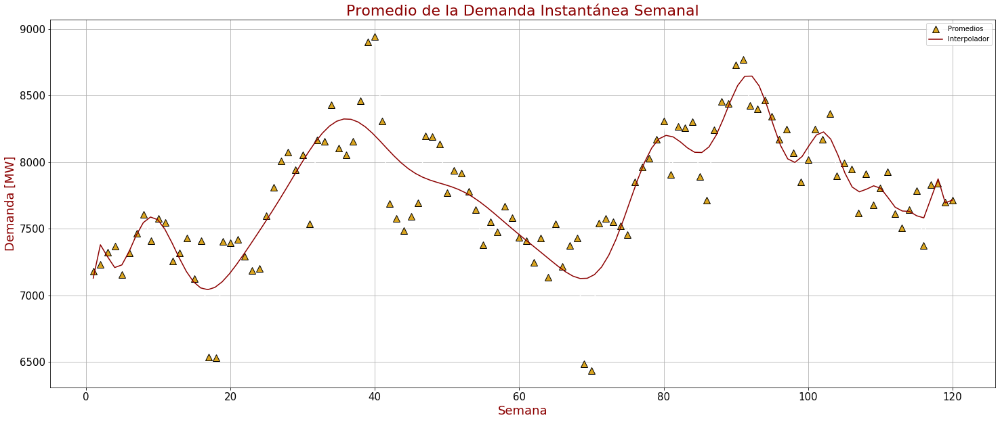

In [33]:
plt.figure(figsize=(25,10))
plt.plot(x_sem_i , prom_sem_i , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_sem_grph_1 , y_sem_grph_1 , color = 'darkred')
plt.title("Promedio de la Demanda Instantánea Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Semana_Inter_1.png')
plt.show()

Algo a recalcar es que en este caso se presenta una desviación estándar menor al caso de los días, esto se observa de manera visual, esto se puede deber a que ahora obtuvimos el interpolador, es decir, el grado del polinomio más uno, corresponde al número de datos.

Finalmente graficaremos el interpolador junto con el conjunto de test para ver que tan fiable es el modelo obtenido

In [34]:
mpoints = len(prom_sem) + 1
x_sem_grph_2 = np.linspace(min(x_sem) , max(x_sem) , mpoints)
y_sem_grph_2 = np.polyval(inter_sem , x_sem_grph_2)

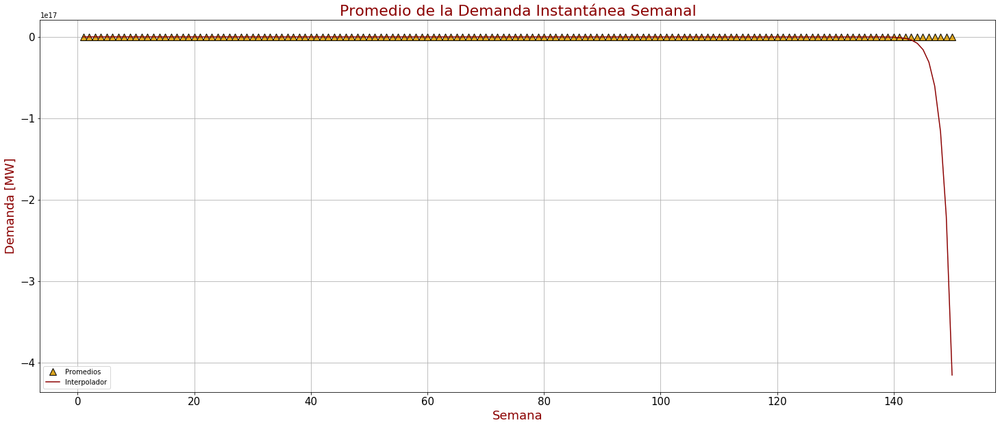

In [35]:
plt.figure(figsize=(25,10))
plt.plot(x_sem , prom_sem , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_sem_grph_2 , y_sem_grph_2 , color = 'darkred')
plt.title("Promedio de la Demanda Instantánea Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Semana_Inter_2.png')
plt.show()

Hagamos un acercamiento en donde diverge el interpolador con los demás puntos

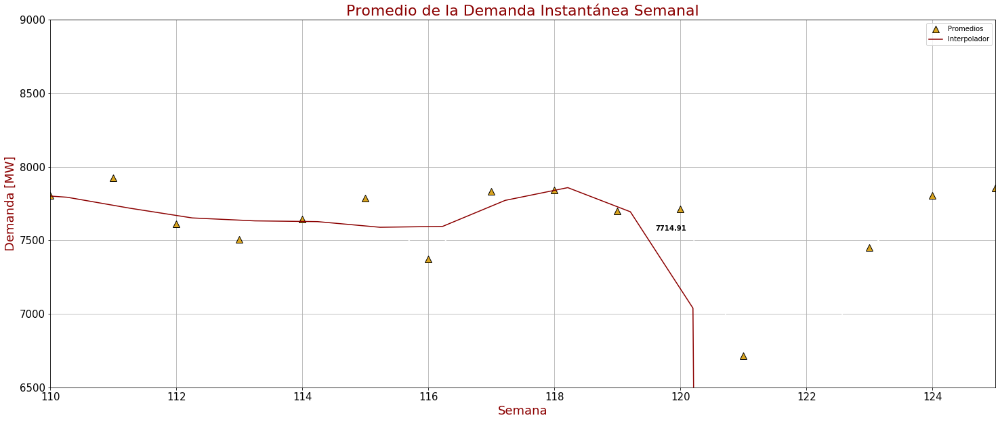

In [36]:
plt.figure(figsize=(25,10))
plt.plot(x_sem , prom_sem , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_sem_grph_2 , y_sem_grph_2 , color = 'darkred')
plt.text(119.6, data_sem_i.iat[119,0] -150 , str(7714.91) , horizontalalignment = 'left' , fontweight = "bold")
plt.title("Promedio de la Demanda Instantánea Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlim([110, 125]) 
plt.ylim([6500,9000]) 
plt.grid(True)
plt.savefig('Promedio_Demanda_Semana_Inter_3.png')
plt.show()

#### **Errores:**

En esta parte obtendremos los errores cuadráticos medios de nuestro modelo con el conjunto de entrenamiento. No los obtendremos respecto al conjunto de prueba debido a que se observa en la gráfica que estos serán exageradamente grandes, además de saber que no se ajustan.

In [37]:
prom_sem_obj_80 = prom_a_sem_i
x_sem_80 = x_sem_i
prom_sem_80 = inter_sem
ecm_sem = MSE(prom_sem_obj_80 , prom_sem_80)
print(ecm_sem)

59879621.571429536


Vemos que incluso los errores cuadráticos medios son muy grandes a pesar de obtenerse respecto al conjunto de entrnamiento.

### **Interpolador Para la Demanda Instantánea Mensual**

Se repetirá el procedimiento anterior para los promedios mensuales, donde habrá dos semanas que sobrarán ya que no completan el mes de Febrero del 2020.

In [38]:
num_m = int(len(prom_sem)/4)
prom_mes = []
for i in range(0,num_m):
    ini = 4*i
    end = 4*(1+i)
    data_i = data_sem[ini:end]
    prom_mes.append(data_i["Promedio"].mean())

In [39]:
prom_mes.append(data_sem[148:150]["Promedio"].mean())
prom_a_mes = np.array(prom_mes)
x_mes = np.array(list(range(1,39)))

data_mes = pd.DataFrame(prom_mes, columns = ['Promedio']) 
mes = pd.DataFrame(x_mes, columns = ['Mes']) 
data_mes['Mes'] = mes['Mes']
data_mes.tail(5)

,Promedio,Mes
33,7917.955393,34
34,6999.597718,35
35,7486.651449,36
36,7991.699747,37
37,7693.634682,38


Para el conjunto de prueba tomemos hasta el mes 32 ya que sería el números de meses más aproximados al $\%80$ del conjunto total de los promedios mensuales

In [40]:
num_m_i = 32
prom_mes_i = []
for i in range(0,num_m_i):
    ini = i
    end = 1+i
    data_i = data_mes[ini:end]
    prom_mes_i.append(data_i["Promedio"].mean())
    
prom_a_mes_i = np.array(prom_mes_i)
x_mes_i = np.array(list(range(1,len(prom_mes_i)+1)))

donde el conjunto de entrenamiento es el siguiente

In [41]:
data_mes_i = pd.DataFrame(prom_mes_i, columns = ['Promedio']) 
mes_i = pd.DataFrame(x_mes_i, columns = ['Mes']) 
data_mes_i['Semana'] = mes_i['Mes']
data_mes_i.tail(5)

,Promedio,Semana
27,7754.964906,28
28,7577.425080,29
29,7772.136665,30
30,7092.375620,31
31,7685.094406,32


Con esto, ya podemos construir nuestro interpolador

In [42]:
d_mes = len(prom_a_mes_i) - 1
d_mes = len(prom_mes_i) - 1
inter_mes = np.polyfit(x_mes_i , prom_a_mes_i , d_mes)

In [43]:
mpoints = len(prom_sem_i) + 1
x_mes_grph_1 = np.linspace(min(x_mes_i) , max(x_mes_i) , mpoints)
y_mes_grph_1 = np.polyval(inter_mes , x_mes_grph_1)

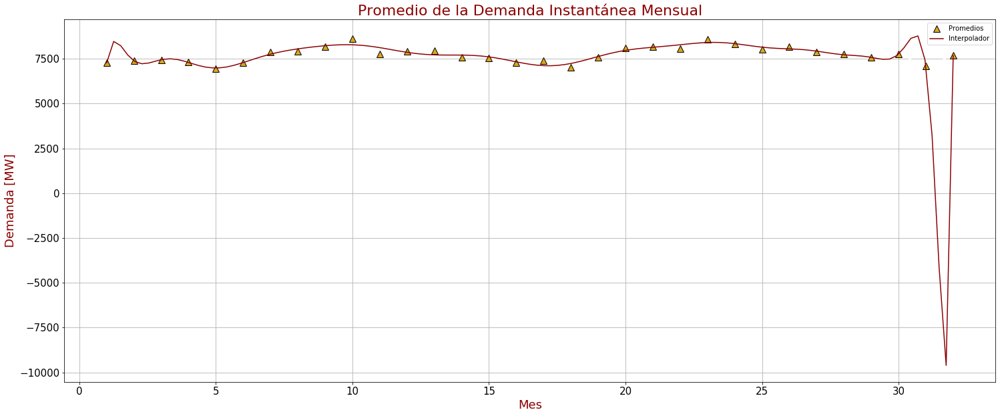

In [44]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_i , prom_mes_i , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_1 , y_mes_grph_1 , color = 'darkred')
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Mes_Inter_1.png')
plt.show()

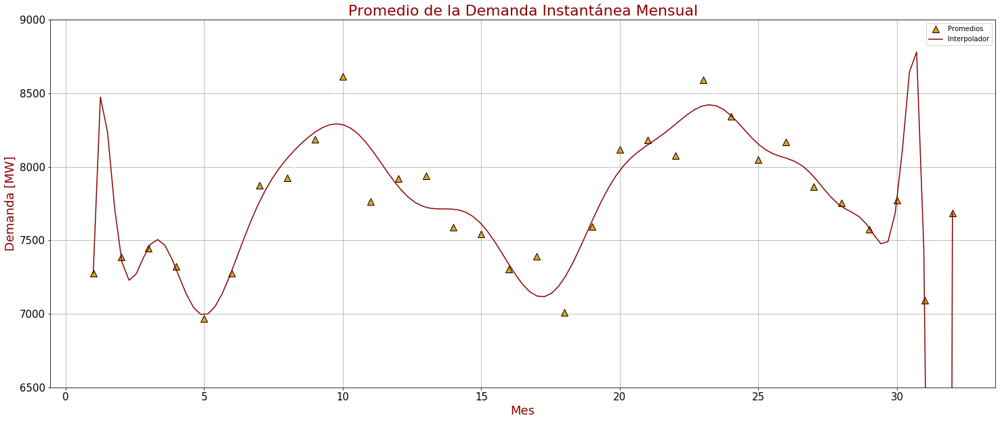

In [45]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_i , prom_mes_i , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_1 , y_mes_grph_1 , color = 'darkred')
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.ylim([6500,9000]) 
plt.grid(True)
plt.savefig('Promedio_Demanda_Inter_Mes_2.png')
plt.show()

Análogamente al caso anterior, veamos si este modelo se acerca a los promedio de los meses restantes

In [46]:
mpoints = len(prom_mes) + 1
x_mes_grph_2 = np.linspace(min(x_mes) , max(x_mes) , mpoints)
y_mes_grph_2 = np.polyval(inter_mes , x_mes_grph_2)

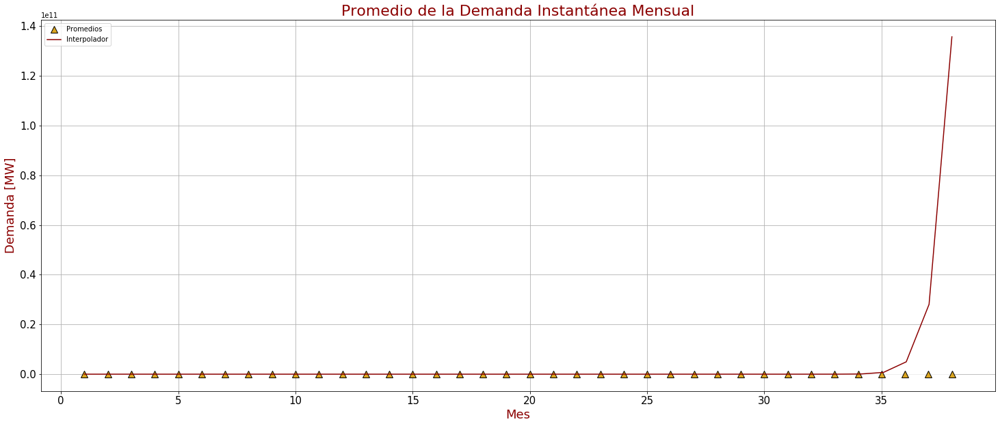

In [47]:
plt.figure(figsize=(25,10))
plt.plot(x_mes , prom_mes , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_2 , y_mes_grph_2 , color = 'darkred')
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Mes_Inter_3.png')
plt.show()

donde el *close-up* es

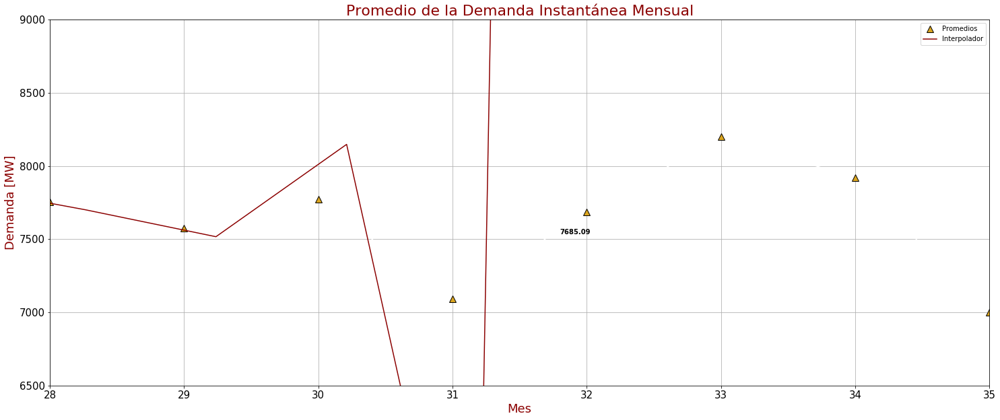

In [48]:
plt.figure(figsize=(25,10))
plt.plot(x_mes , prom_mes , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_2 , y_mes_grph_2 , color = 'darkred')
plt.text(31.8 , data_mes_i.iat[31,0] -150 , str(7685.09) , horizontalalignment = 'left' , fontweight = "bold")
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlim([28, 35]) 
plt.ylim([6500,9000]) 
plt.grid(True)
plt.savefig('Promedio_Demanda_Mes_Inter_4.png')
plt.show()

Se observa que el interpolador no es un buen modelo ni para el caso semanal ni mensual puesto que no sé acerca a los valores de su conjunto de test, respectivamente.

**Errores:**

Análogamente al caso semanal, sólo se obtendrán los errores cuadráticos medios respecto al conjunto de entrenamiento.

In [49]:
prom_mes_obj_80 = prom_a_mes_i
prom_mes_80 = inter_mes

In [50]:
ecm_mes = MSE(prom_mes_obj_80 , prom_mes_80)
print(ecm_mes)

8913068206.410252


De nuevo los errores son grandes y además, son mayores en comparación con los promedios semanales, los errores para el caso mensual son incluso mayores.


## **Splines**

De igual manera  que con el interpolador, para ajustar los datos a splines cúbicos, siendo estos funciones a trozos compuestas por polinmios cúbicos, se empleará la función *interpid()* para cumplir este propósito. La documentación es la que se muestra continuación:

#### **scipy.interpolate.interp1d** 

El segúndo método interpolador que se utilizó, fue con la función `interp1d`:

Esta función se utilizó la siguiente forma:

`scipy.interpolate.interp1d(x, y, kind = 'cubic', fill_value='extrapolate')`

Donde estos son los argumentos:

+ `x`: Conjunto de datos a interpolar, valores en el eje x.
+ `y`: Conjunto de datos a interpolar, valores en el eje y.
+ `kind`: Tipo del polinomio a utilizar (en éste caso se utilizaron polinomios cúbicos).
+ `fill_value`: Para seleccionar cómo se estimarán los puntos que se encuentren fuera del conjunto original.  En éste caso `extrapolate` permite la extrapolación.

Esta función ayuda para arreglar la oscilación de interpoladores de grado alto (como observamos previamente), ya que genera polinomios de grado bajo, en cada subintervalo compuesto por las $x$'s.  

Se generaron distintos modelos por medio de esta función, para posteriormente averiguar si la función nos ayuda a extrapolar (estimar) de una manera correcta.

Otro de los modelos con los que es de interés aplicar, son los splines cúbicos debido a que en teoría se podrían ajustar mejor a estos datos. Se usará la función *interpid* del módulo de **scipy** para obtener estos modelos

In [60]:
from scipy.interpolate import interp1d

### **Splines Para la Demanda Instantánea Por Hora**

In [103]:
mpoints_100p_l = 25152
x_100p_l = np.linspace(0, mpoints_100p_l, mpoints_100p_l)
spline_100p_l = interp1d(x_100p_l, data_int['Demanda Instantánea'], kind = 'cubic', fill_value='extrapolate')
y_eval_spline_100p_l = spline_100p_l(x_100p_l)

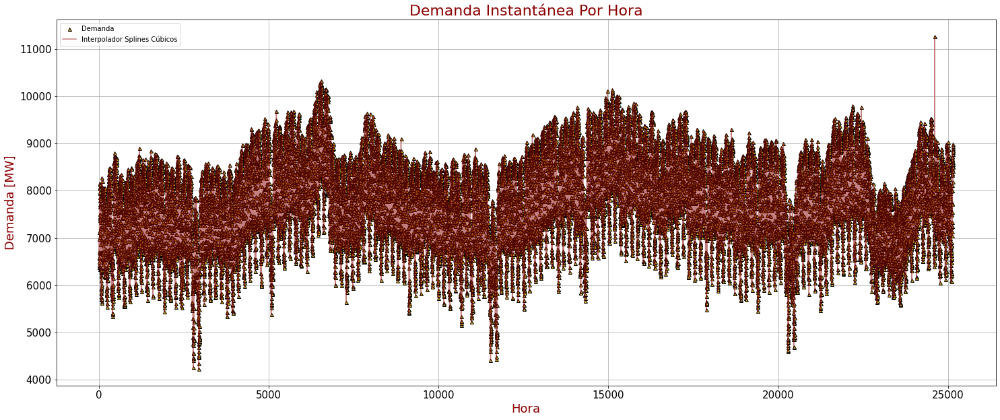

In [104]:
plt.figure(figsize=(25,10))
plt.plot(data_int.index, data_int['Demanda Instantánea'], color= 'white' ,
         marker = '^' , markersize = 5.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_100p_l, y_eval_spline_100p_l, color = 'darkred' , alpha = 0.5)
plt.title("Demanda Instantánea Por Hora" , fontsize = 22 , color = 'darkred')
plt.xlabel("Hora" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador Splines Cúbicos"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_hora_spline.png')
plt.show()

Notemos que a esta escala los splines cúbicos se ajustan bastante bien a los datos puesto que salvo el máximo del lado derecho, el resto no dejan *descubierta* la gráfica asociada al modelo.

## **Splines Para la Demanda Instantánea Promedio Diaria** 

Aunque con splines no excedemos el número máximo de elementos con los que podemos trabajar, para que la gráfica se vea menos saturada, realizamos de nuevo el modelo, ahora considerando el promedio diario:

In [105]:
spline_dia_l = interp1d(x_dia, prom_a_dia, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_dia_l = np.linspace(0,len(x_dia),5000)
y_eval_spline_dia_l = spline_dia_l(x_eval_spline_dia_l)

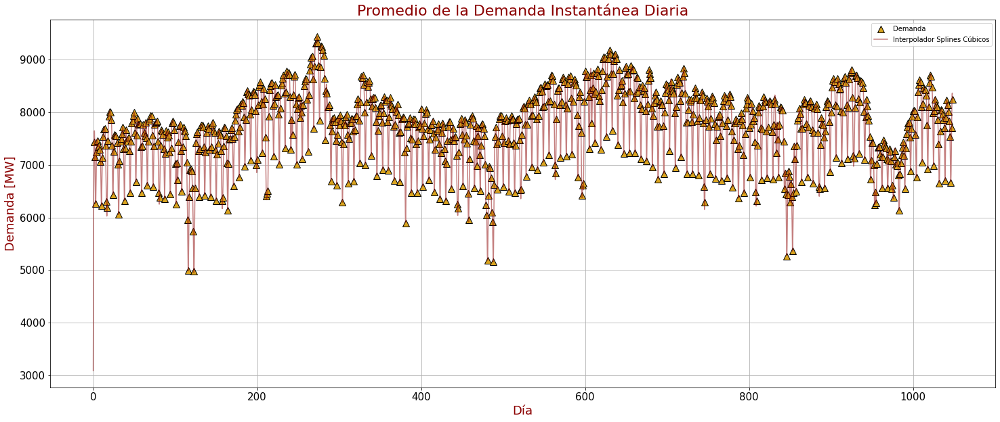

In [110]:
plt.figure(figsize=(25,10))
plt.plot(x_dia , prom_a_dia , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_dia_l, y_eval_spline_dia_l, color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Instantánea Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Día" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador Splines Cúbicos"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_dia_spline.png')
plt.show()

Tal como se observó con la gráfica para las horas, los splines parecen ajustar de manera muy prescisa a los datos registrados.

### **Splines Para la Demanda Instantánea Promedio Semanal** 

Realizamos de nuevo el modelo usando splines, con el promedio semanal:

In [107]:
dias_tot_l = 1048 # Dias totales registrados
num_sem_l = int(dias_tot_l/7)
prom_sem_l = []
for i in range(0,num_sem_l):
    ini = 7*i
    end = 7*(1+i)
    data_i = prom_a_dia[ini:end]
    prom_sem_l.append(np.mean(prom_a_dia[ini:end]))
    
prom_a_sem_l = np.array(prom_sem_l)
x_sem_l = np.array(list(range(1,len(prom_sem_l)+1)))    

In [108]:
spline_sem_l = interp1d(x_sem_l, prom_a_sem_l, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_sem_l = np.linspace(0,len(x_sem_l),5000)
y_eval_spline_sem_l = spline_sem_l(x_eval_spline_sem_l)

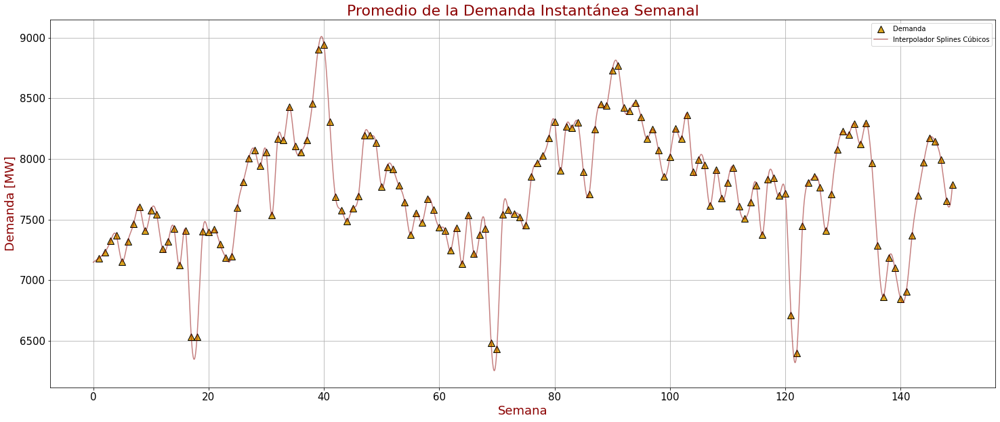

In [111]:
plt.figure(figsize=(25,10))
plt.plot(x_sem_l, prom_a_sem_l, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_sem_l, y_eval_spline_sem_l, color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Instantánea Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador Splines Cúbicos"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_semana_spline.png')
plt.show()

Por la escala ya se aprecian ciertas oscilaciones respecto a los datos. Sin embargo, sigue ajustando bastante bien.

### **Splines Para la Demanda Instantánea Promedio Mensual** 

Realizamos de nuevo el modelo usando splines, con el promedio mensual:

In [113]:
sem_tot_l = 149 # Seamanas totales registradas
num_mes_l = int(sem_tot_l/4)
prom_mes_l = []
for i in range(0,num_mes_l):
    ini = 4*i
    end = 4*(1+i)
    data_i = prom_a_sem_l[ini:end]
    prom_mes_l.append(np.mean(prom_a_sem_l[ini:end]))
    
prom_a_mes_l = np.array(prom_mes_l)
x_mes_l = np.array(list(range(1,len(prom_mes_l)+1)))

spline_mes_l = interp1d(x_mes_l, prom_a_mes_l, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_mes_l = np.linspace(0,len(x_mes_l),5000)
y_eval_spline_mes_l = spline_mes_l(x_eval_spline_mes_l)

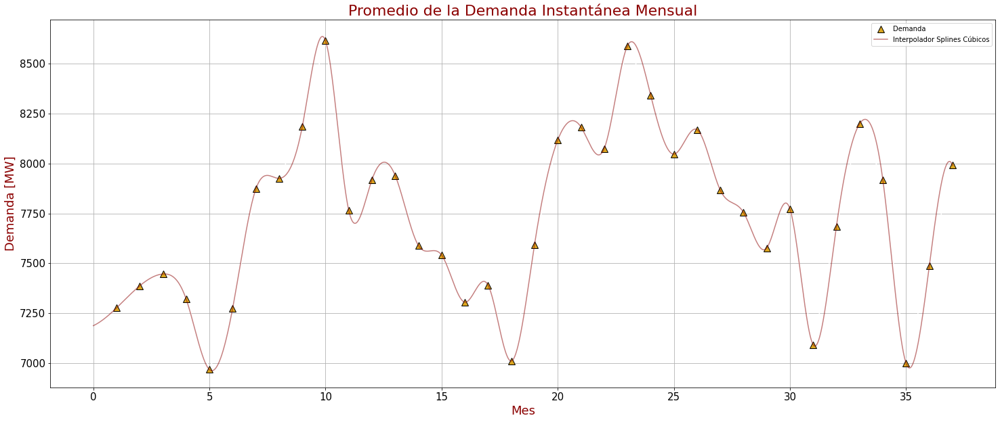

In [114]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_l, prom_a_mes_l, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_l, y_eval_spline_mes_l, color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador Splines Cúbicos"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_mes_spline.png')
plt.show()

A pesar de que para el $\% 100$ de los datos ajustan muy bien los splines, tomaremos el $\% 80$ de los datos para construir el spline y luego sobreponerla en el otro $\% 20$ de los datos y ver si nos se desvía mucho de ellos.

**Predicción de Demanda Promedio Mensual, considerando el 80% de los datos:** 

Utilizando splines, crearemos un modelo de *Demanda Promedio Mensual* con el 80% de los datos, para predecir el 20% restante;

In [115]:
prom_a_mes_80_l = np.delete(prom_a_mes_l, [30,31,32,33,34,35,36])
x_mes_80_l = np.delete(x_mes_l, [30,31,32,33,34,35,36])

spline_mes_80_l = interp1d(x_mes_80_l, prom_a_mes_80_l, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_mes_80_l = np.linspace(0,len(x_mes_80_l),5000)
y_eval_spline_mes_80_l = spline_mes_80_l(x_eval_spline_mes_80_l)

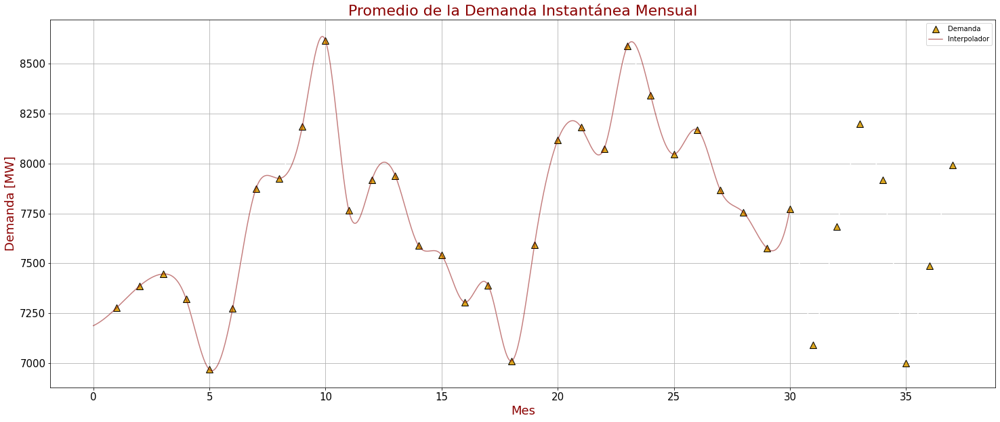

In [116]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_l, prom_a_mes_l, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_80_l, y_eval_spline_mes_80_l, color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
#plt.savefig('Demanda_mes_80_spline.png')
plt.show()

Los splines sólo se graficaron hasta el último punto con el se construyó a partir del conjunto de entrenamiento.

Ahora pongamoslo a prueba

In [117]:
y_eval_spline_mes_80_100_l = spline_mes_80_l(x_eval_spline_mes_l)

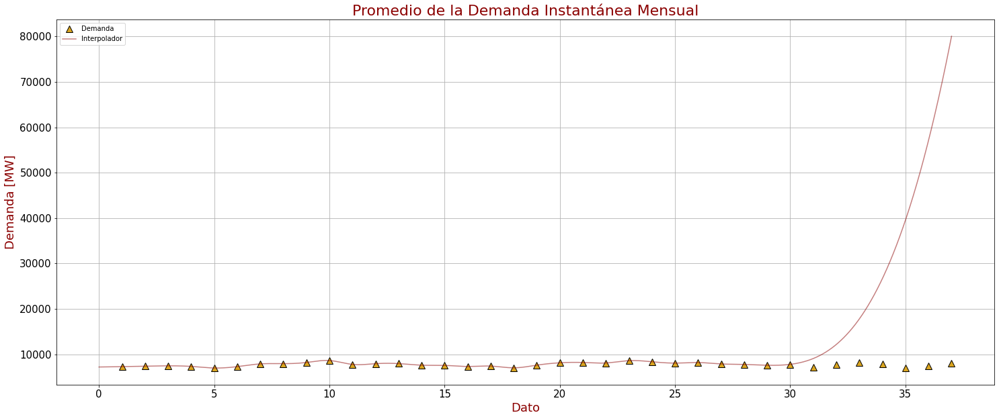

In [118]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_l, prom_a_mes_l, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_l, y_eval_spline_mes_80_100_l, color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_mes_80_100_spline.png')
plt.show()

Haciendo zoom al final de la gráfica:

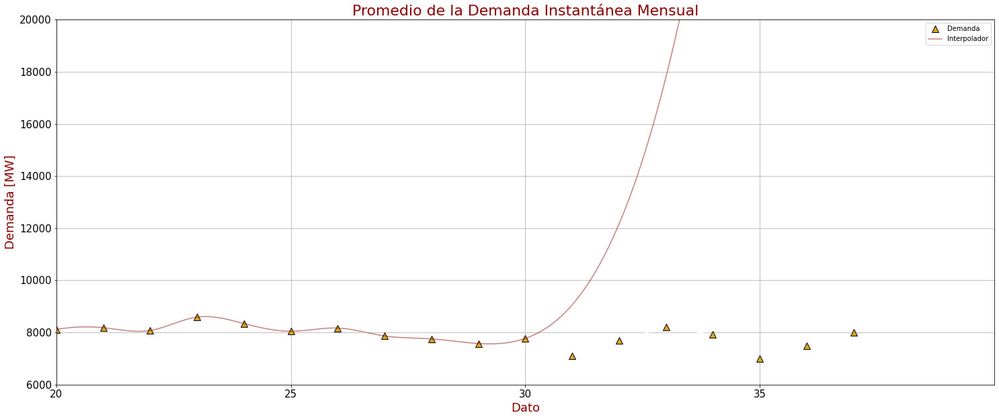

In [119]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_l, prom_a_mes_l, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_l, y_eval_spline_mes_80_100_l, color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Instantánea Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Demanda","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.xlim(20, 40)
plt.ylim(6000, 20000)
plt.xticks(np.arange(20, 40, step=5))
plt.savefig('Demanda_mes_80_100_spline_zoom.png')
plt.show()

### **Observaciones**

Tanto los modelos con interpoladores como con splines cúbicos, no pueden usarse para predicciones a partir de los datos conocidos puesto que divergen muy rápido para los datos conocidos del conjunto de prueba.

## **Demanda Integrada (Consumo)**

A diferencia de la demanda instantánea, aquí nos interesa la demanda integrada la cual representa la energía promedio de una hora.

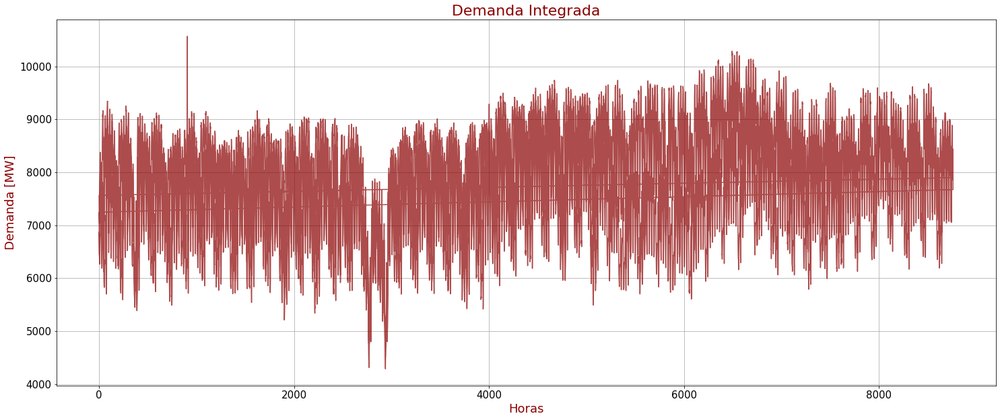

In [55]:
plt.figure(figsize=(25,10))
plt.plot(data_horas.muestras, data_horas.dema_int, 'b-', color = 'darkred' , alpha = 0.7)
plt.title("Demanda Integrada" , fontsize = 22 , color = 'darkred')
plt.xlabel("Horas" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_Integrada.png')
plt.show()

Como vemos, los datos presentan muchas oscilaciones, debido a ello, tomaremos los promedios por día, semanas y meses con el objetivo de observar si los datos se simplifican lo suficiente como para hallar un modelo simple que se ajuste a ellos.

## **Interpolador Demanda Integrada**

Se usarán los mismo criterios empleados para la demanda instantánea promedio, donde, se analizará diaría, semanal y mensual.

### **Interpolador Para la Demanda Integrada Promedio Díaria** 

De acuerdo a los datos del análisis descriptivo se cuentan con 25152 registros de horas, por ello, sacaremos los promedios de cada 24 registros consecutivos para obtener el promedio de la demanda diaría.

In [57]:
horas_tot = 25152 # Horas totales registradas
num_d_2 = int(horas_tot/24)
prom_dia_2 = []
for i in range(0,num_d_2):
    ini = 24*i
    end = 24*(1+i)
    data_i = data_horas[ini:end]
    prom_dia_2.append(data_i["dema_int"].mean())

In [58]:
prom_a_dia_2 = np.array(prom_dia_2)
x_dia_2 = np.array(list(range(1,len(prom_dia_2)+1)))

In [59]:
mpoints = len(prom_dia_2)
x_dia_grph_1_2 = np.linspace(min(x_dia_2) , max(x_dia_2) , mpoints)
y_dia_grph_1_2 = np.array(prom_dia_2)

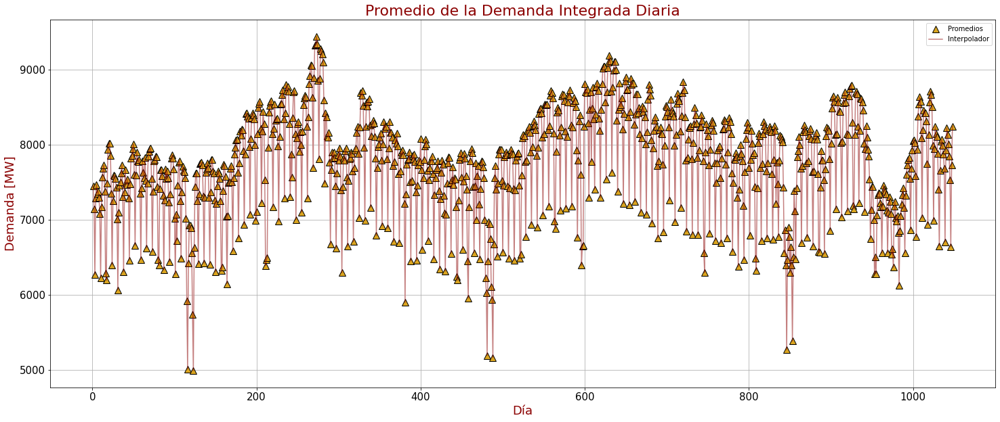

In [60]:
plt.figure(figsize=(25,10))
plt.plot(x_dia_2 , prom_a_dia_2 , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_dia_grph_1_2 , y_dia_grph_1_2 , color = 'darkred' , alpha = 0.5)
plt.title("Promedio de la Demanda Integrada Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Día" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Dia.png')
plt.show()

In [61]:
n_m = []
x = []
k = 0
n_puntos = 100 # Solo submúltiplos de 800, que representan el 76% de los datos
for i in range(n_puntos):
    n_m.append(k)
    x.append(k)
    k = int(k+(800/n_puntos))

y = []
for i in range(len(x)):
    y.append(prom_dia_2[n_m[i]])

coef_aj = np.polyfit(x, y, len(x))

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval = np.polyval(coef_aj,xeval)

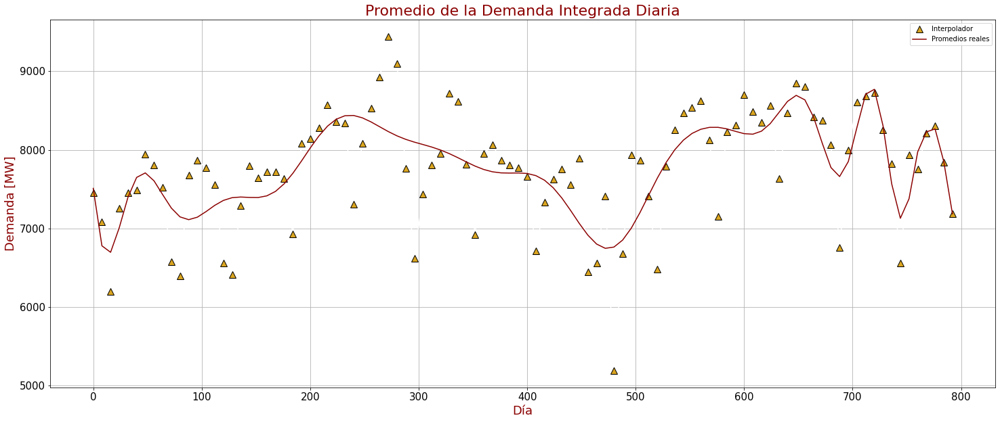

In [62]:
plt.figure(figsize=(25,10))
plt.plot(x , y , 'k-', color = 'white',
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval, 'b-', color = 'darkred')     
plt.title("Promedio de la Demanda Integrada Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Día" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Interpolador","Promedios reales","Muestras"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Dia_Inter.png')
plt.show()

Lo que resta ahora es poner a prueba este modelo con el resto de los datos con el objetivo de observar si este los describe

In [70]:
mpoints = len(prom_dia_2) + 1
x_dia_grph_2 = np.linspace(min(x_dia_2) , max(x_dia_2) , mpoints)
y_dia_grph_2 = np.polyval(coef_aj , x_dia_grph_2)

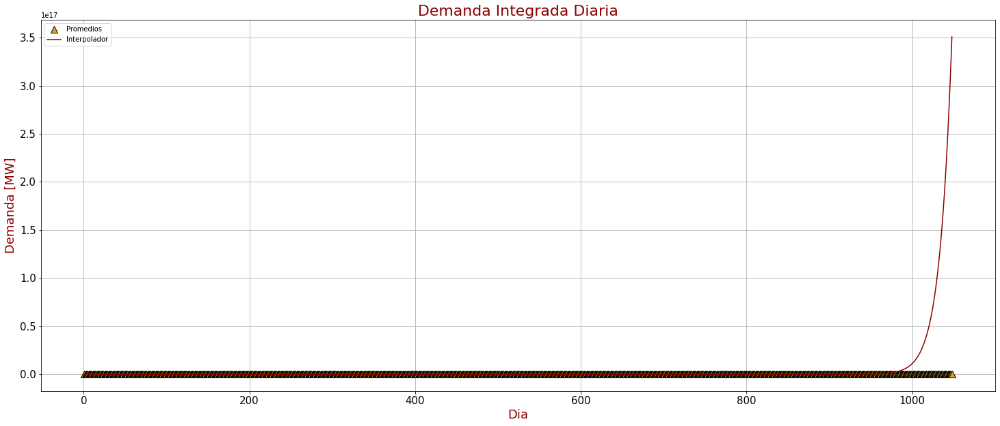

In [71]:
plt.figure(figsize=(25,10))
plt.plot(x_dia , prom_dia , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_dia_grph_2 , y_dia_grph_2 , color = 'darkred')
plt.title("Demanda Integrada Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Dia" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Dia_Inter_2.png')
plt.show()

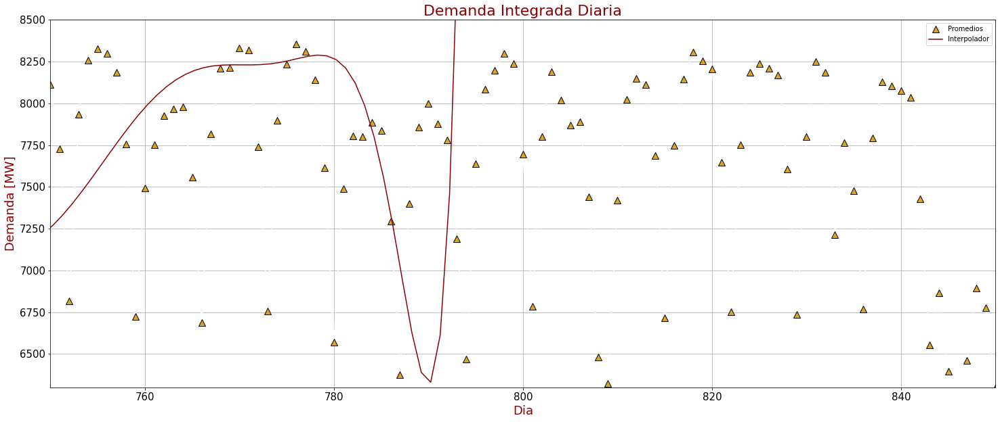

In [72]:
plt.figure(figsize=(25,10))
plt.plot(x_dia , prom_dia , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_dia_grph_2 , y_dia_grph_2 , color = 'darkred')
plt.title("Demanda Integrada Diaria" , fontsize = 22 , color = 'darkred')
plt.xlabel("Dia" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlim(750,850)
plt.ylim(6300,8500)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Dia_Inter_3.png')
plt.show()

Tal como se ve la primera gráfica con el conjunto de prueba, nuestro modelo diverge y no puede describir ese conjunto de puntos por lo que se determina que en este caso el interpolador no es un modelo adecuado para este problema.

### **Interpolador Para la Demanda Integrada Promedio Semanal**

Ahora por semana, indistitanmente de a qué mes pertenezca, los días restantes se promediarán y se contarán como otra semana como se verá más adelante.

De acuerdo a las pruebas hechas nos damos cuenta que el límite del grado del polinomio que acepta, en este caso, polyfit, es 141. Sin embargo, para poner a prueba nuestro modelo, sólo necesitaremos el $80\%$ de los datos y el otro $20\%$ para hacer el test gráfico del modelo

In [76]:
data_dia = pd.DataFrame(prom_dia_2, columns = ['Promedio'])
dia = pd.DataFrame(x_dia_2, columns = ['Dia']) 
data_dia['Dia'] = dia['Dia']

num_s = int(len(data_dia)/7)
prom_sem = []
for i in range(0,num_s):
    ini = 7*i
    end = 7*(1+i)
    data_i = data_dia[ini:end]
    prom_sem.append(data_i["Promedio"].mean())

In [77]:
prom_sem.append(data_dia[num_s*7: num_s*7 + 6]["Promedio"].mean())
prom_a_sem = np.array(prom_sem)
x_sem = np.array(list(range(1,len(prom_sem)+1)))

Mostremos los últimos cinco datos de los promedios semanales

In [78]:
data_sem = pd.DataFrame(prom_sem, columns = ['Promedio']) 
sem = pd.DataFrame(x_sem, columns = ['Semana']) 
data_sem['Semana'] = sem['Semana']
data_sem.tail(5)

,Promedio,Semana
145,8153.383904,146
146,7986.661687,147
147,7670.239603,148
148,7793.250106,149
149,7597.501642,150


Si contamos los seis días restantes como otras semana se tiene 150 semanas en total donde el $80\%$ de ellas son 120 y el número más pequeño y cercano que sea múltiplo de siete es 119. Entonces, obtengamos los arrays y dataframe con estos datos

In [79]:
num_s_i = 120
prom_sem_i = []
for i in range(0,num_s_i):
    ini = 7*i
    end = 7*(1+i)
    data_i = data_dia[ini:end]
    prom_sem_i.append(data_i["Promedio"].mean())

In [80]:
prom_a_sem_i = np.array(prom_sem_i)
x_sem_i = np.array(list(range(1,len(prom_sem_i)+1)))

data_sem_i = pd.DataFrame(prom_sem_i, columns = ['Promedio']) 
sem_i = pd.DataFrame(x_sem_i, columns = ['Semana']) 
data_sem_i['Semana'] = sem_i['Semana']
data_sem_i.tail(5)

,Promedio,Semana
115,7389.288811,116
116,7853.069152,117
117,7855.596635,118
118,7709.245598,119
119,7729.280683,120


Obtengamos ahora el interpolador para el conjunto de 130 registros o conjunto de entrenamiento

In [81]:
d_sem = len(prom_sem_i) - 1
inter_sem = np.polyfit(x_sem_i , prom_a_sem_i , d_sem)

De esta manera, podemos graficarlo sobre los registros del *dataset*

In [82]:
mpoints = len(prom_sem_i) + 1
x_sem_grph_1 = np.linspace(min(x_sem_i) , max(x_sem_i) , mpoints)
y_sem_grph_1 = np.polyval(inter_sem , x_sem_grph_1)

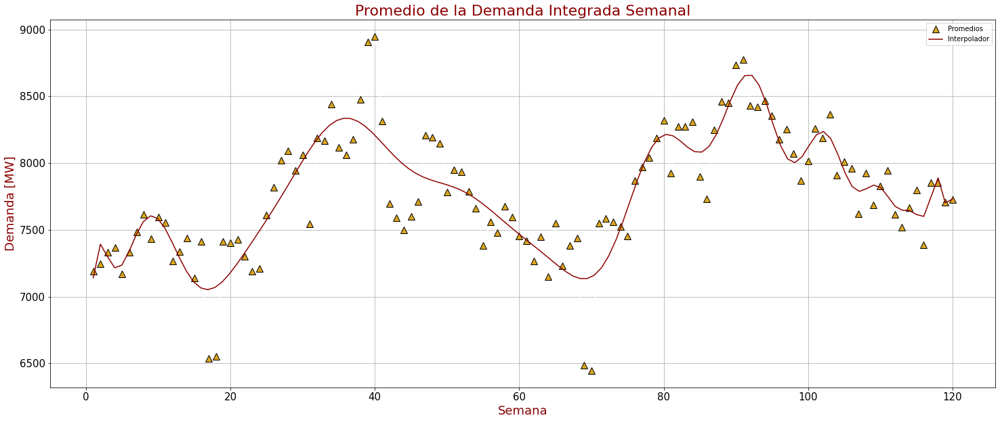

In [83]:
plt.figure(figsize=(25,10))
plt.plot(x_sem_i , prom_sem_i , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_sem_grph_1 , y_sem_grph_1 , color = 'darkred')
plt.title("Promedio de la Demanda Integrada Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Semana_Inter_1.png')
plt.show()

Finalmente graficaremos el interpolador junto con el conjunto de test para ver que tan fiable es el modelo obtenido

In [84]:
mpoints = len(prom_sem) + 1
x_sem_grph_2 = np.linspace(min(x_sem) , max(x_sem) , mpoints)
y_sem_grph_2 = np.polyval(inter_sem , x_sem_grph_2)

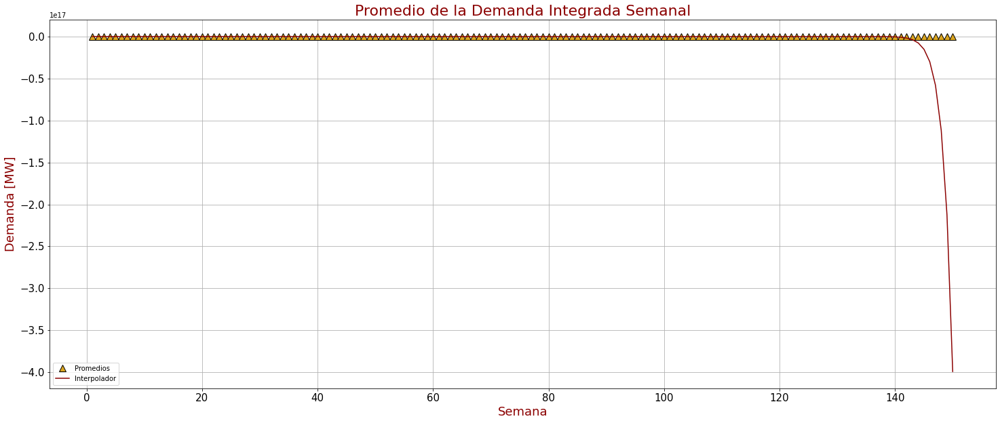

In [85]:
plt.figure(figsize=(25,10))
plt.plot(x_sem , prom_sem , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_sem_grph_2 , y_sem_grph_2 , color = 'darkred')
plt.title("Promedio de la Demanda Integrada Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Semana_Inter_2.png')
plt.show()

Hagamos un acercamiento en donde diverge el interpolador con los demás puntos

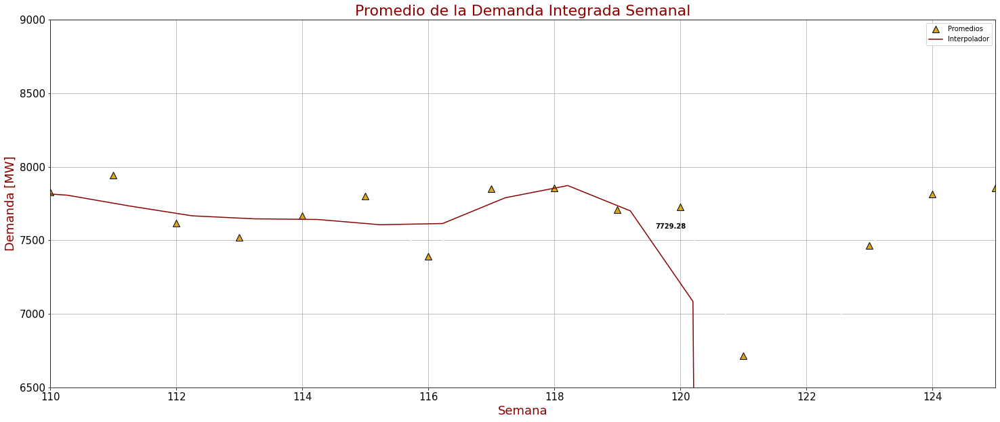

In [87]:
plt.figure(figsize=(25,10))
plt.plot(x_sem , prom_sem , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_sem_grph_2 , y_sem_grph_2 , color = 'darkred')
plt.text(119.6, data_sem_i.iat[119,0] -150 , str(7729.28) , horizontalalignment = 'left' , fontweight = "bold")
plt.title("Promedio de la Demanda Integrada Semanal" , fontsize = 22 , color = 'darkred')
plt.xlabel("Semana" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlim([110, 125]) 
plt.ylim([6500,9000]) 
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Semana_Inter_3.png')
plt.show()

**Errores:**

Tal como se hizó para la demanda diaria, en esta parte obtendremos los errores cuadráticos medios de nuestro modelos.

In [88]:
prom_sem_obj_80 = prom_a_sem_i
x_sem_80 = x_sem_i
prom_sem_80 = inter_sem
ecm_sem = MSE(prom_sem_obj_80 , prom_sem_80)
print(ecm_sem)

60048346.82587992


Vemos que incluso los errores cuadráticos medios osn muy grandes incluso respecto al conjunto de entrnamiento.

### **Interpolador Para la Demanda Integrada Promedio Mensual**

Se repetirá el procedimiento anterior para los promedios mensuales, donde habrá dos semanas que sobrarán ya que no completan el mes de Febrero del 2020.

In [89]:
num_m = int(len(prom_sem)/4)
prom_mes = []
for i in range(0,num_m):
    ini = 4*i
    end = 4*(1+i)
    data_i = data_sem[ini:end]
    prom_mes.append(data_i["Promedio"].mean())

In [90]:
prom_mes.append(data_sem[148:150]["Promedio"].mean())
prom_a_mes = np.array(prom_mes)
x_mes = np.array(list(range(1,39)))

data_mes = pd.DataFrame(prom_mes, columns = ['Promedio']) 
mes = pd.DataFrame(x_mes, columns = ['Mes']) 
data_mes['Mes'] = mes['Mes']
data_mes.tail(5)

,Promedio,Mes
33,7930.781457,34
34,7008.239335,35
35,7495.371733,36
36,7995.248408,37
37,7695.375874,38


Para el conjunto de prueba tomemos hasta el mes 32 ya que sería el números de meses más aproximados al $\%80$ del conjunto total de los promedios mensuales

In [91]:
num_m_i = 32
prom_mes_i = []
for i in range(0,num_m_i):
    ini = i
    end = 1+i
    data_i = data_mes[ini:end]
    prom_mes_i.append(data_i["Promedio"].mean())
    
prom_a_mes_i = np.array(prom_mes_i)
x_mes_i = np.array(list(range(1,len(prom_mes_i)+1)))

In [92]:
data_mes_i = pd.DataFrame(prom_mes_i, columns = ['Promedio']) 
mes_i = pd.DataFrame(x_mes_i, columns = ['Mes']) 
data_mes_i['Semana'] = mes_i['Mes']
data_mes_i.tail(5)

,Promedio,Semana
27,7768.414521,28
28,7593.689082,29
29,7786.798017,30
30,7102.596886,31
31,7694.116694,32


Con esto, ya podemos construir nuestro interpolador

In [93]:
d_mes = len(prom_a_mes_i) - 1
d_mes = len(prom_mes_i) - 1
inter_mes = np.polyfit(x_mes_i , prom_a_mes_i , d_mes)

In [94]:
mpoints = len(prom_sem_i) + 1
x_mes_grph_1 = np.linspace(min(x_mes_i) , max(x_mes_i) , mpoints)
y_mes_grph_1 = np.polyval(inter_mes , x_mes_grph_1)

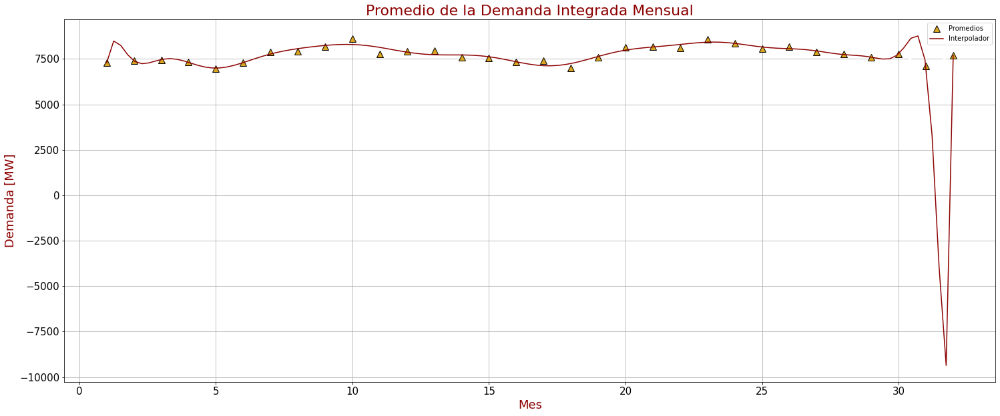

In [95]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_i , prom_mes_i , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_1 , y_mes_grph_1 , color = 'darkred')
plt.title("Promedio de la Demanda Integrada Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Mes_Inter_1.png')
plt.show()

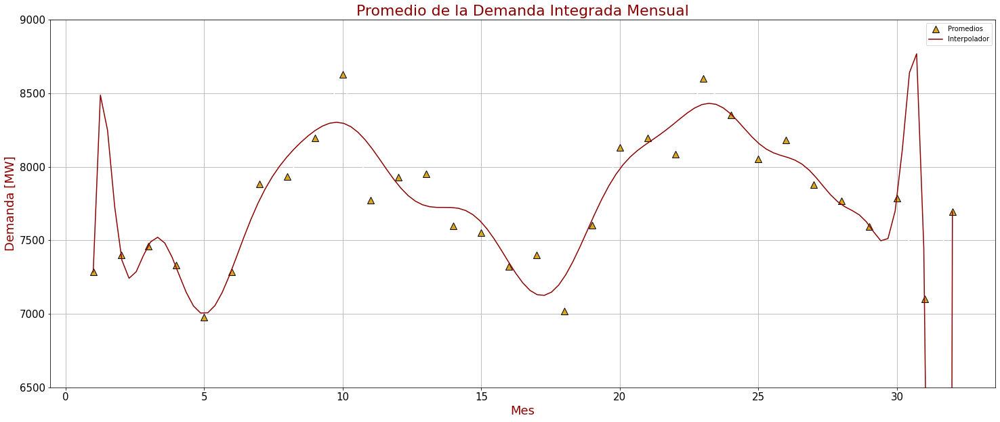

In [96]:
plt.figure(figsize=(25,10))
plt.plot(x_mes_i , prom_mes_i , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_1 , y_mes_grph_1 , color = 'darkred')
plt.title("Promedio de la Demanda Integrada Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.ylim([6500,9000]) 
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Inter_Mes_2.png')
plt.show()

In [97]:
mpoints = len(prom_mes) + 1
x_mes_grph_2 = np.linspace(min(x_mes) , max(x_mes) , mpoints)
y_mes_grph_2 = np.polyval(inter_mes , x_mes_grph_2)

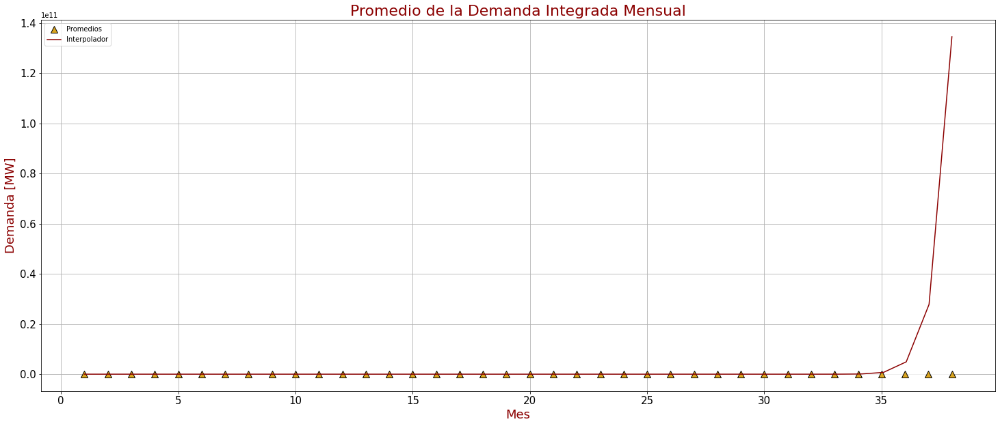

In [98]:
plt.figure(figsize=(25,10))
plt.plot(x_mes , prom_mes , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_2 , y_mes_grph_2 , color = 'darkred')
plt.title("Promedio de la Demanda Integrada Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Mes_Inter_3.png')
plt.show()

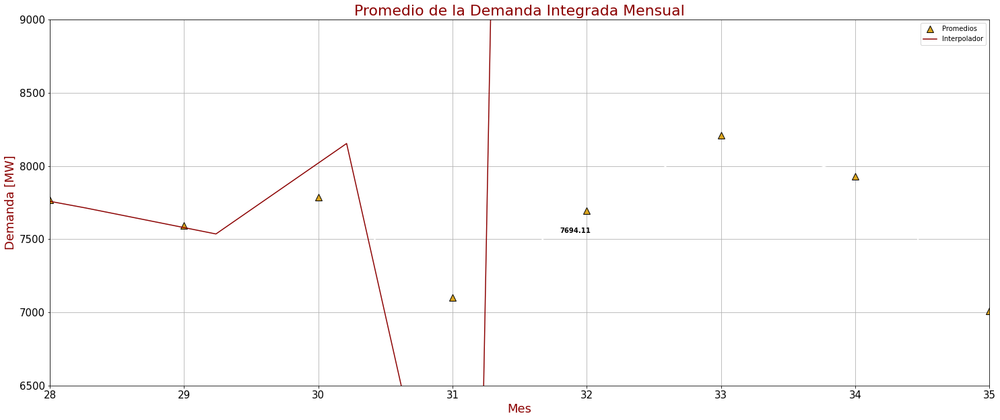

In [100]:
plt.figure(figsize=(25,10))
plt.plot(x_mes , prom_mes , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_mes_grph_2 , y_mes_grph_2 , color = 'darkred')
plt.text(31.8 , data_mes_i.iat[31,0] -150 , str(7694.11) , horizontalalignment = 'left' , fontweight = "bold")
plt.title("Promedio de la Demanda Integrada Mensual" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.xlim([28, 35]) 
plt.ylim([6500,9000]) 
plt.grid(True)
plt.savefig('Promedio_Demanda_Integrada_Mes_Inter_4.png')
plt.show()

Se observa que el interpolador no es un buen modelo para el caso semanal ni mensual puesto que no sé acerca a los valores de su conjunto de test, respectivamente.

**Errores:**

Análogamente al caso semanal

In [101]:
prom_mes_obj_80 = prom_a_mes_i
prom_mes_80 = inter_mes
ecm_mes = MSE(prom_mes_obj_80 , prom_mes_80)
print(ecm_mes)

8977674858.347164


Vemos que incluso, en comparación con los promedios semanales, los errores para el caso mensual son incluso mayores.

### **Promedios Totales de la Demanda Integrada Anual**

En este caso, se sacarón los promedio por mes de los tres años y luego promediarlos de acurdo al número de veces que ese mes apareciera en el *dataframe*

In [42]:
Meses = ['Enero' , 'Febrero' , 'Marzo' , 'Abril' , 'Mayo' , 'Junio' , 'Julio' , 'Agosto' , 'Septiembre' , 'Octubre' , 'Nobiembre' , 'Diciembre']

x_hist = list(range(1,13))
prom_hist = [1,2,3,4,5,6,7,8,9,10,11,12]
prom_hist[8] = (data_mes.iat[0,0] + data_mes.iat[12,0] + data_mes.iat[24,0])/3
prom_hist[9] = (data_mes.iat[1,0] + data_mes.iat[13,0] + data_mes.iat[25,0])/3
prom_hist[10] = (data_mes.iat[2,0] + data_mes.iat[14,0] + data_mes.iat[26,0])/3
prom_hist[11] = (data_mes.iat[3,0] + data_mes.iat[15,0] + data_mes.iat[27,0])/3
prom_hist[0] = (data_mes.iat[4,0] + data_mes.iat[16,0] + data_mes.iat[28,0])/3
prom_hist[1] = (data_mes.iat[5,0] + data_mes.iat[17,0] + data_mes.iat[29,0] + data_mes.iat[36,0])/4
prom_hist[2] = (data_mes.iat[6,0] + data_mes.iat[18,0] + data_mes.iat[30,0] + data_mes.iat[37,0])/4
prom_hist[3] = (data_mes.iat[7,0] + data_mes.iat[19,0] + data_mes.iat[31,0])/3
prom_hist[4] = (data_mes.iat[8,0] + data_mes.iat[20,0] + data_mes.iat[32,0])/3
prom_hist[5] = (data_mes.iat[9,0] + data_mes.iat[21,0] + data_mes.iat[33,0])/3
prom_hist[6] = (data_mes.iat[10,0] + data_mes.iat[22,0] + data_mes.iat[34,0])/3
prom_hist[7] = (data_mes.iat[11,0] + data_mes.iat[23,0] + data_mes.iat[35,0])/3

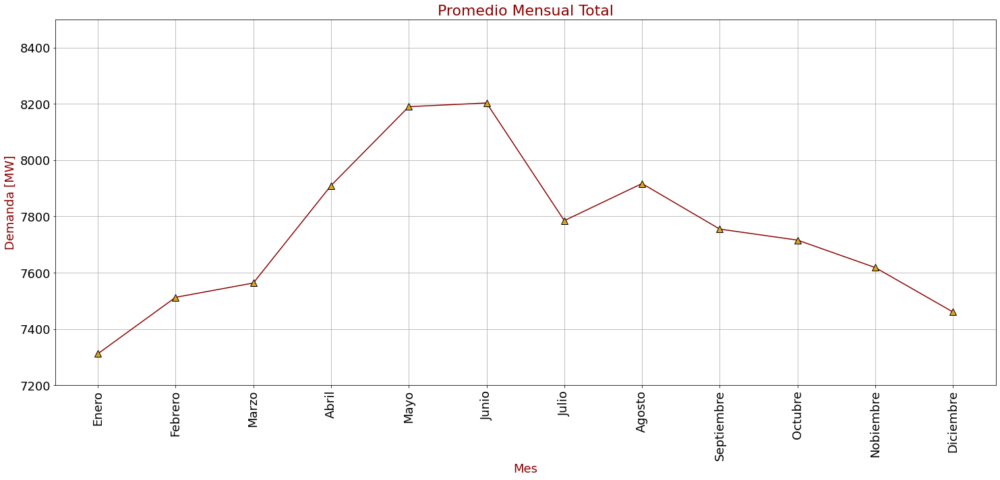

In [49]:
plt.figure(figsize=(25,10))
plt.plot(x_hist , prom_hist , color= 'darkred' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.title("Promedio Mensual Total" , fontsize = 22 , color = 'darkred')
plt.xlabel("Mes" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 18)
plt.xticks(list(range(1,13)), Meses , rotation = 'vertical' , fontsize = 18)
plt.ylim([0,9000]) 
plt.grid(True)
plt.ylim([7200,8500]) 
plt.savefig('Inter_mes_tot_2.png')
plt.show()

Lo que nos dice el gráfico es que hay una mayor demanda de energía en Verano siendo el de mayor consumo en Junio, mientras que el mínimo se reporta para Enero. Identifiquemos los estados que se hallan en el occidente de México para dislumbrar una causa de esto, la región occidente comprende los siguientes estados,además de otros, con sus temperaturas promedios en Verano

+ Nayarit - 35° C en Mayo y Junio
+ Jalisco - 34° C en Mayo y Junio
+ Colima - 32° C en Mayo
+ Michoacán - 31° C en Mayo

Como vemos, aunque no sean las temperaturas mayores en México en Verano, no quita que sean temperaturas altas, por lo cual, el conusmo se puede deber a que en la gente usa más el aire condicionado, ventiladores y a fines por el calor. Por otro lado, debido al incremento de calor hay menos lluvias por lo cual se aumenta el bombeo para el riego de parcelas y campos.

### **Splines**

### **Splines Para la Demanda Integrada Promedio**

La función *interp1d()* también nos puede ayudar para generar un modelo para interpolar.  En primer lugar, usaremos la **demanda horaria** para generar un modelo interpolador, por medio de **splines cúbicos**:

In [65]:
#Creando arreglo de las filas a remover del dataframe:
del_rows_100 = range(100,25152)
#Trabajando con 100 valores:
data_2_100 = data_2.drop(data_2.index[del_rows_100], axis = 0)

In [66]:
# Interpolación con polyfit n = 100 para el grado del polinimio
mpoints_100 = 100
d_100 = 99
x_100 = np.linspace(0, 99, mpoints_100)

In [67]:
coeff_100 = np.polyfit(x_100, data_2_100.dema_int, d_100)

Trabajaremos con splines de $n=1$

In [68]:
spline_100 = interp1d(x_100, data_2_100.dema_int, kind = 'cubic', fill_value='extrapolate')
y_eval_spline_100 = spline_100(x_100)

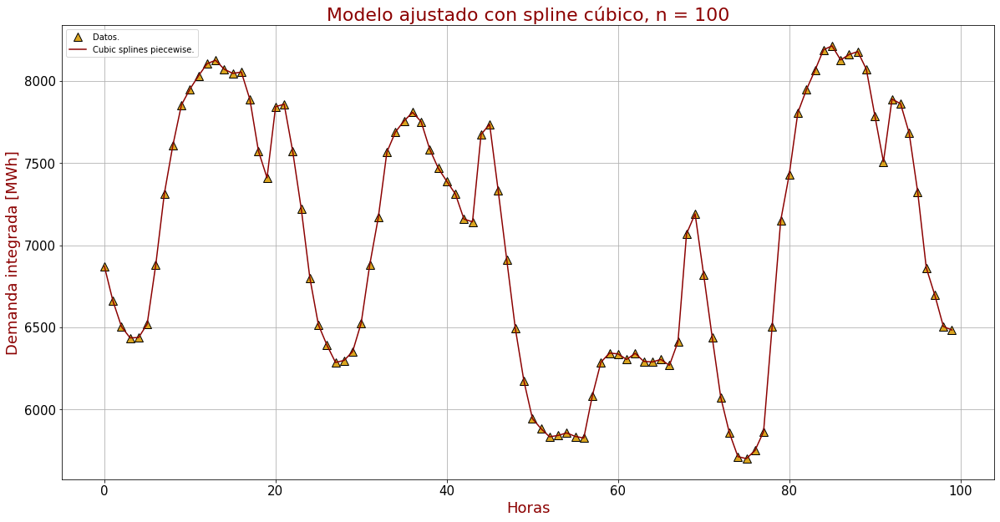

In [69]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_2_100.index , data_2_100.dema_int , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_100 ,y_eval_spline_100 , color = 'darkred')
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Modelo ajustado con spline cúbico, n = 100", fontsize = 22 , color = 'darkred')
plt.xlabel('Horas', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada [MWh]', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Trabajaremos con splines de $n=1500$

In [70]:
del_rows_1500 = range(1500,25152)
data_2_1500 = data_2.drop(data_2.index[del_rows_1500], axis = 0)

In [71]:
mpoints_1500 = 1500
d_1500 = 1499
x_1500 = np.linspace(0, mpoints_1500, mpoints_1500)

In [72]:
#Haciendo splines cúbicos, n = 1,500:
spline_1500 = interp1d(x_1500, data_2_1500.dema_int, kind = 'cubic', fill_value='extrapolate')
y_eval_spline_1500 = spline_1500(x_1500)

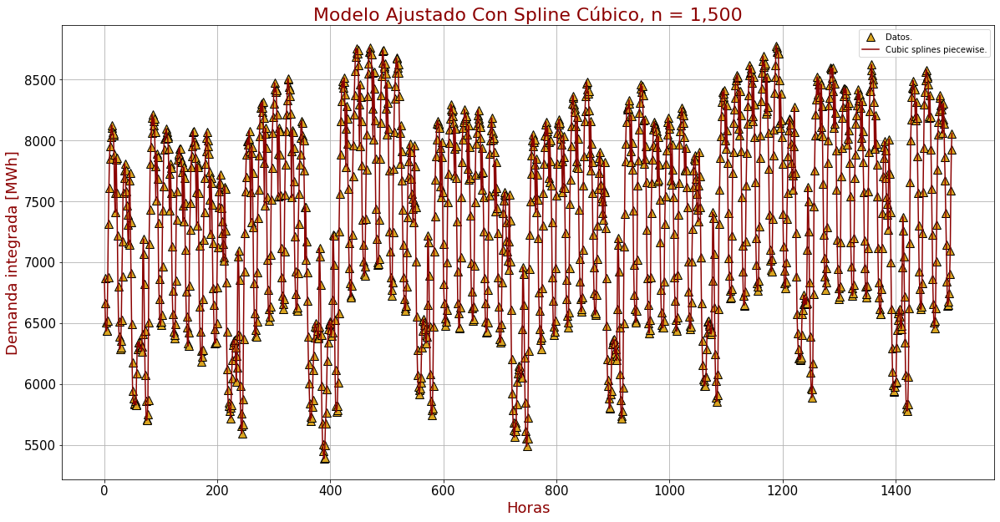

In [73]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_2_1500.muestras , data_2_1500.dema_int , color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_1500 ,y_eval_spline_1500 , color = 'darkred')
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Modelo Ajustado Con Spline Cúbico, n = 1,500", fontsize = 22 , color = 'darkred')
plt.xlabel('Horas', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada [MWh]', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Ahora iniciaremos las pruebas con splines para ver si el modelo describe bien los datos

**Trabajando con splines 100% de los datos:**

In [74]:
mpoints_100p = 25152
x_100p = np.linspace(0, mpoints_100p, mpoints_100p)
#Haciendo splines cúbicos, 100% datos:
spline_100p = interp1d(x_100p, data_2.dema_int, kind = 'cubic', fill_value='extrapolate')
y_eval_spline_100p = spline_100p(x_100p)

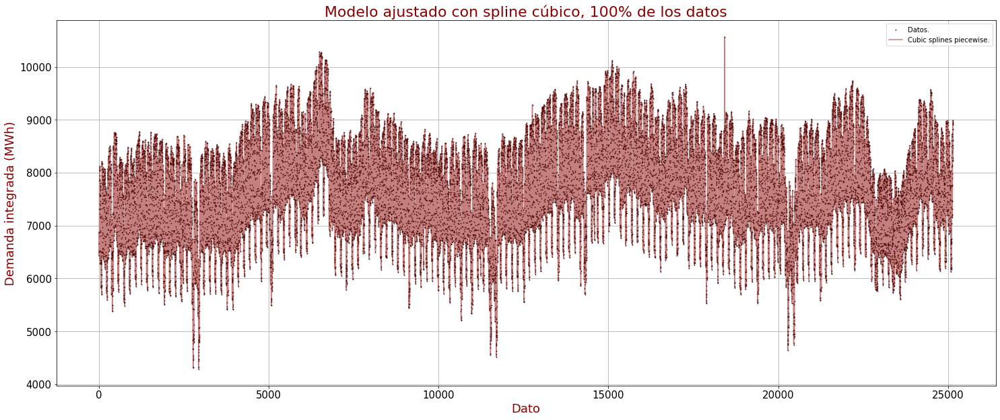

In [75]:
fig = plt.figure(figsize=(25,10))
plt.plot(data_2.index , data_2.dema_int , color= 'white' ,
         marker = '^' , markersize = 1.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_100p , y_eval_spline_100p , color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Modelo ajustado con spline cúbico, 100% de los datos", fontsize = 22 , color = 'darkred')
plt.xlabel('Dato', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

**Trabajando con splines 80% de los datos para el conjunto de entrenamiento**

In [76]:
#Creando arreglo para eliminar el 20% final de los datos
del_rows_80p = range(20121,25152)
#Trabajando con el 80% de los valores valores:
data_2_80p = data_2.drop(data_2.index[del_rows_80p], axis = 0)
mpoints_80p = 20121
x_80p = np.linspace(0, mpoints_80p, mpoints_80p)
#Haciendo splines cúbicos, 80% datos:
spline_80p = interp1d(x_80p, data_2_80p.dema_int, kind = 'cubic', fill_value='extrapolate')

In [77]:
y_eval_spline_80p = spline_80p(x_80p)

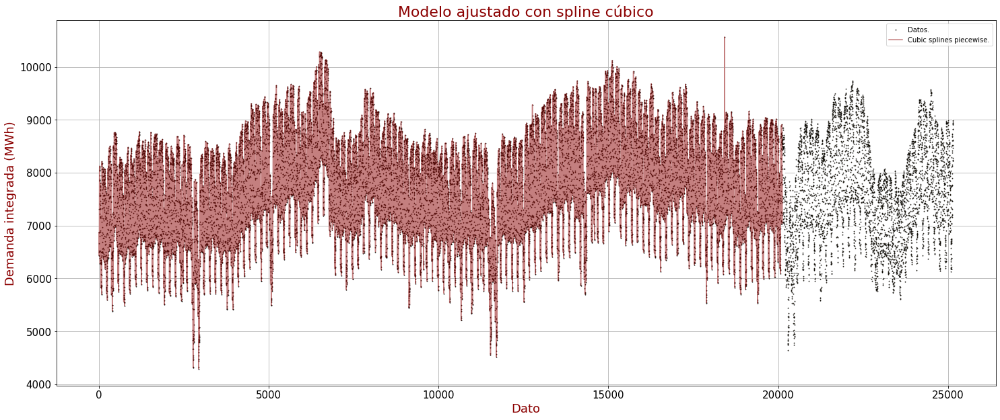

In [78]:
fig = plt.figure(figsize=(25,10))
plt.plot(data_2.index , data_2.dema_int , color= 'white' ,
         marker = '^' , markersize = 1.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_80p, y_eval_spline_80p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Modelo ajustado con spline cúbico", fontsize = 22 , color = 'darkred')
plt.xlabel('Dato', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Haciendo un zoom al spline con el $\% 80$ de los datos

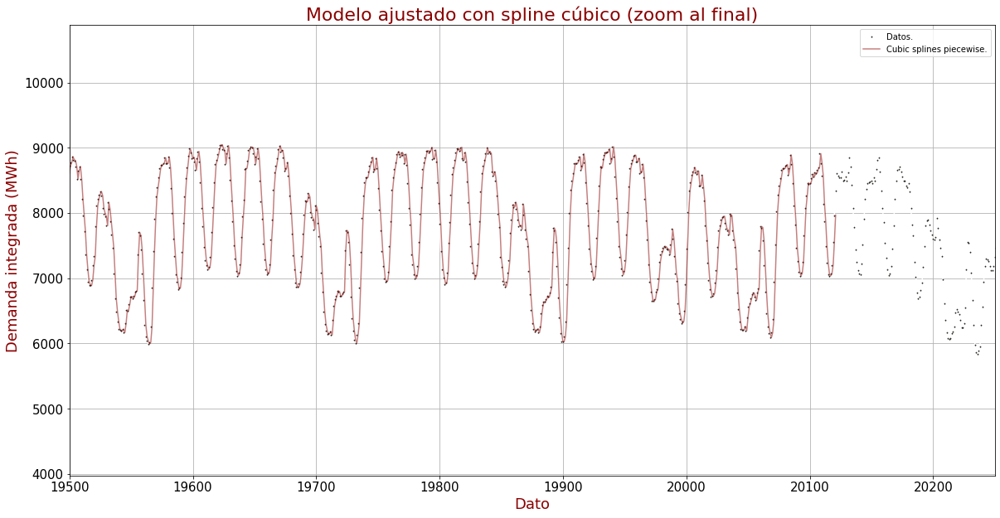

In [79]:
fig = plt.figure(figsize=(20,10))
plt.xlim(19500, 20250)
plt.plot(data_2.index , data_2.dema_int , color= 'white' ,
         marker = '^' , markersize = 1.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_80p, y_eval_spline_80p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Modelo ajustado con spline cúbico (zoom al final)", fontsize = 22 , color = 'darkred')
plt.xlabel('Dato', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Extrapolando con splines al 100% de los datos para ponerlo a prueba

In [81]:
y_eval_spline_80_100p = spline_80p(data_2.index)

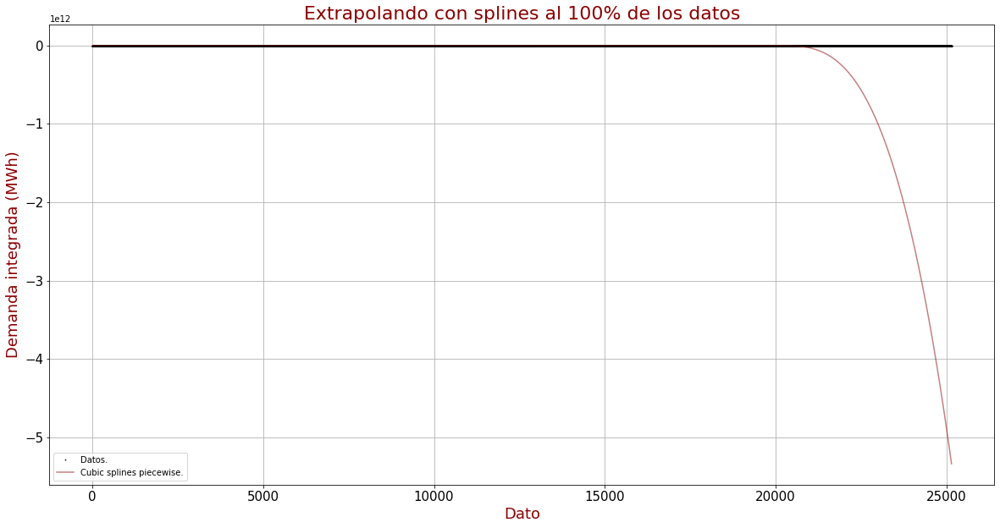

In [82]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_2.index , data_2.dema_int , color= 'white' ,
         marker = '^' , markersize = 1.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(data_2.index, y_eval_spline_80_100p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Extrapolando con splines al 100% de los datos", fontsize = 22 , color = 'darkred')
plt.xlabel('Dato', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Haciendo zoom en el punto donde divergen las gráficas

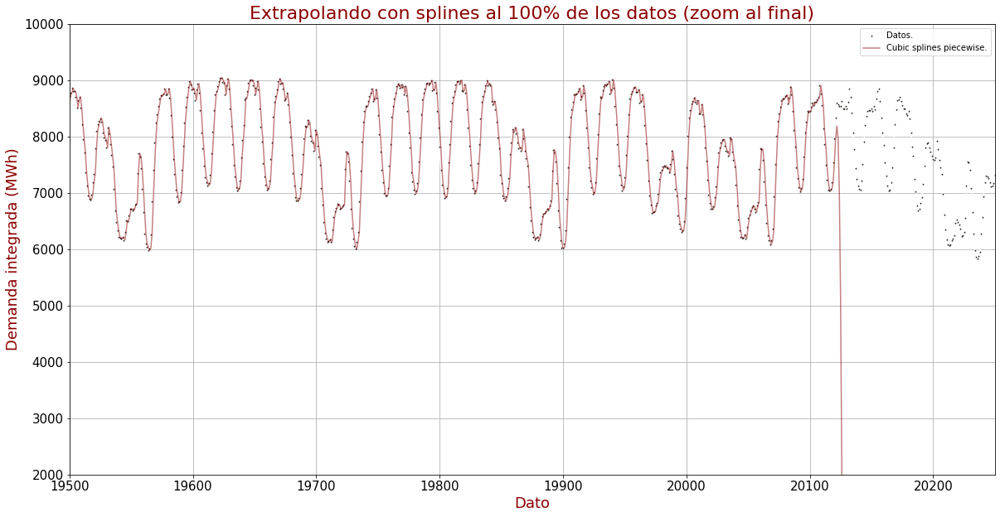

In [83]:
fig = plt.figure(figsize=(20,10))
plt.xlim(19500, 20250)
plt.ylim(2000, 10000)
plt.plot(data_2.index , data_2.dema_int , color= 'white' ,
         marker = '^' , markersize = 1.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(data_2.index, y_eval_spline_80_100p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Extrapolando con splines al 100% de los datos (zoom al final)", fontsize = 22 , color = 'darkred')
plt.xlabel('Dato', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

#### **Splines para la Demanda Integrada Semanal Promedio**

Usando splines con promedios semanales (100% de los datos):

In [84]:
prom_sem = [7193.166960541667,
 7248.862151440476,
 7331.153581321428,
 7368.65838170238,
 7169.082587488096,
 7331.714745238096,
 7482.9630442083335,
 7616.737792059524,
 7431.334553517858,
 7593.32658827381,
 7556.521984488094,
 7268.933052619047,
 7337.91220902381,
 7440.170972142857,
 7140.116526773809,
 7413.941581541666,
 6539.3820072976205,
 6550.370594440476,
 7413.5308106785715,
 7401.275319869047,
 7429.139407190477,
 7301.5526203750005,
 7190.300327196428,
 7213.042748505953,
 7609.114174238096,
 7817.782800696428,
 8019.149876482143,
 8093.100807672619,
 7947.070357208334,
 8063.0458459880965,
 7547.0522556845235,
 8186.744827011905,
 8167.383612345237,
 8440.261563178572,
 8115.990275011906,
 8062.677836351191,
 8178.600963005952,
 8476.134066755953,
 8909.141679017857,
 8947.921018113095,
 8312.816144863096,
 7696.614855089288,
 7589.655276708333,
 7499.96991792262,
 7602.322980880954,
 7710.36235335119,
 8206.044534458333,
 8195.104091000001,
 8149.365474339285,
 7783.062603738095,
 7950.33793689881,
 7932.696022065477,
 7790.477210767856,
 7661.542113309524,
 7382.688079160713,
 7558.930754809525,
 7478.252254791666,
 7678.583154208333,
 7596.379113529763,
 7453.5137827976205,
 7420.359167708334,
 7267.310636184525,
 7446.604925851191,
 7148.215668119048,
 7550.789678208334,
 7231.014473464287,
 7381.42572002976,
 7437.511726428571,
 6488.725000589286,
 6446.004482648809,
 7551.499959619046,
 7583.331814613094,
 7558.748498940476,
 7522.6331781011895,
 7456.47233092262,
 7867.368319708335,
 7970.645926375,
 8040.41864222619,
 8189.049325726191,
 8320.095403619047,
 7924.367549958333,
 8274.872974934524,
 8272.407417511906,
 8311.24906754762,
 7899.729421946428,
 7733.703677660714,
 8250.437164654762,
 8463.588675880954,
 8453.821887988097,
 8735.981564267855,
 8777.175237279762,
 8430.672419553572,
 8419.009096696429,
 8464.105880095238,
 8356.895205505953,
 8178.575219869047,
 8252.400725988095,
 8072.004479761905,
 7868.336338839284,
 8016.437208505951,
 8257.269630744047,
 8187.882181416667,
 8367.596797130955,
 7908.008033035714,
 8009.070136934525,
 7959.480421375,
 7619.935788690476,
 7924.401004321429,
 7686.114920238096,
 7827.579433380954,
 7943.894657261905,
 7616.06907172619,
 7520.413125303571,
 7665.28475510119,
 7799.769635375001,
 7389.2888105119055,
 7853.069151916667,
 7855.5966347023805,
 7709.2455980357145,
 7729.280682803571,
 6715.628269672618,
 6412.592887184524,
 7467.017612154763,
 7815.148776982142,
 7856.54204210119,
 7767.998425208333,
 7421.902177494048,
 7730.024130982142,
 8090.744672065477,
 8234.659008357145,
 8211.01438169643,
 8304.604116482142,
 8136.518385255954,
 8306.359873773808,
 7974.234591910713,
 7306.012978386904,
 6880.019552547618,
 7194.492867232142,
 7107.165434726191,
 6851.279484940475,
 6920.636410386905,
 7369.649709845237,
 7710.0343625000005,
 7981.166451255953,
 8170.70843970238,
 8153.383904208333,
 7986.661686613094,
 7670.2396034226185,
 7793.2501059999995,
 7597.501642083333]

In [85]:
prom_a_sem = np.array(prom_sem)
x_sem = np.array(list(range(1,len(prom_sem)+1)))
data_sem = pd.DataFrame(prom_sem, columns = ['Promedio'])
sem = pd.DataFrame(x_sem, columns = ['Semana']) 
data_sem['Semana'] = sem['Semana']

El dataFrame final con los promedios semanales se ve así:

In [86]:
data_sem

,Promedio,Semana
0,7193.166961,1
1,7248.862151,2
2,7331.153581,3
3,7368.658382,4
4,7169.082587,5
...,...,...
145,8153.383904,146
146,7986.661687,147
147,7670.239603,148
148,7793.250106,149


In [87]:
mpoints_sem = 150
x_sem = np.linspace(0, 149, mpoints_sem)
#Haciendo splines cúbicos, 100% promedios semanales:
spline_sem = interp1d(x_sem, data_sem.Promedio, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_sem = np.linspace(0,len(x_sem),1000)
y_eval_spline_sem = spline_sem(x_eval_spline_sem)

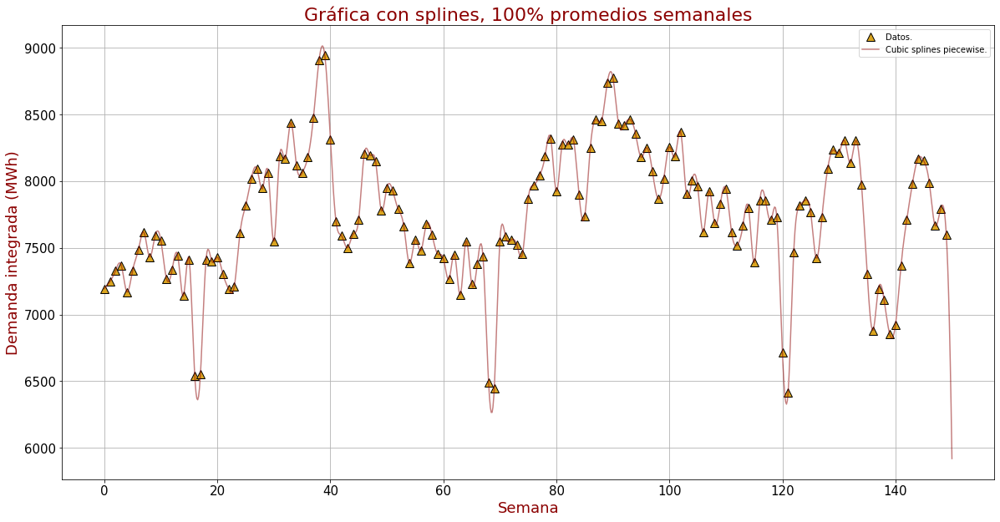

In [88]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_sem.index, data_sem.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_sem, y_eval_spline_sem, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Gráfica con splines, 100% promedios semanales", fontsize = 22 , color = 'darkred')
plt.xlabel('Semana', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

**Usando splines con promedios semanales (80% de los datos):**

In [89]:
#Creando arreglo para eliminar el 20% final de los datos semanales:
del_rows_sem_80p = range(120,150)
print(del_rows_sem_80p)
#Trabajando con el 80% de los valores valores:
data_sem_80p = data_sem.drop(data_sem.index[del_rows_sem_80p], axis = 0)
data_sem_80p

range(120, 150)


,Promedio,Semana
0,7193.166961,1
1,7248.862151,2
2,7331.153581,3
3,7368.658382,4
4,7169.082587,5
...,...,...
115,7389.288811,116
116,7853.069152,117
117,7855.596635,118
118,7709.245598,119


In [90]:
mpoints_sem_80p = 120
x_sem_80p = np.linspace(0, 119, mpoints_sem_80p)
#Haciendo splines cúbicos, 80% promedios semanales:
spline_sem_80p = interp1d(x_sem_80p, data_sem_80p.Promedio, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_sem_80p = np.linspace(0,len(x_sem_80p),1000)
y_eval_spline_sem_80p = spline_sem(x_eval_spline_sem_80p)

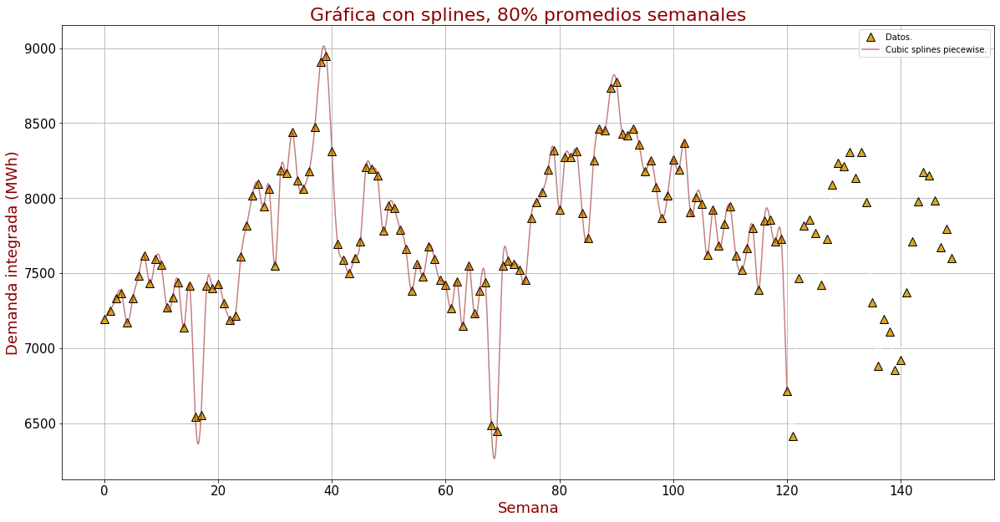

In [91]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_sem.index, data_sem.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_sem_80p, y_eval_spline_sem_80p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Gráfica con splines, 80% promedios semanales", fontsize = 22 , color = 'darkred')
plt.xlabel('Semana', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

**Extrapolando con splines al 100% de los datos semanales:**

In [92]:
x_eval_spline_sem_80_100p = np.linspace(0,len(x_sem),1000)
y_eval_spline_sem_80_100p = spline_sem_80p(x_eval_spline_sem_80_100p)

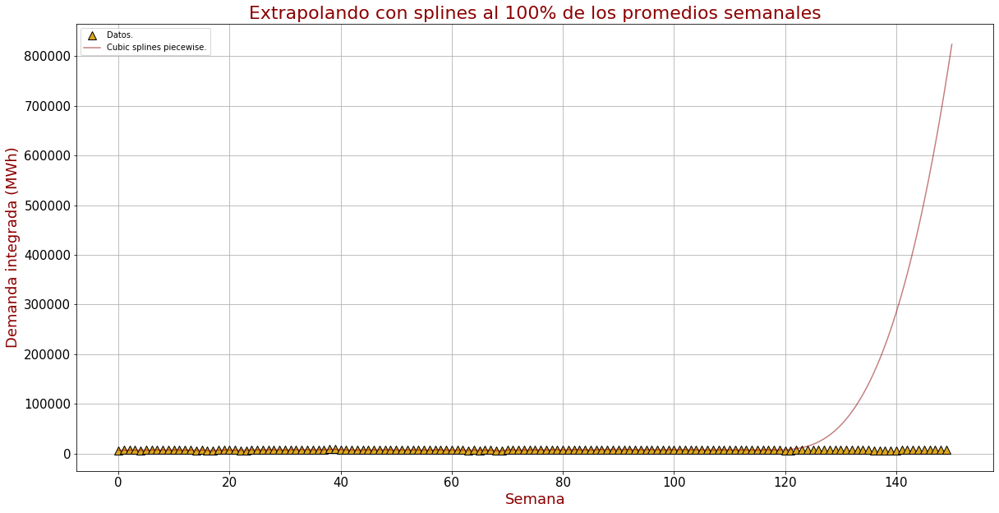

In [93]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_sem.index, data_sem.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_sem_80_100p, y_eval_spline_sem_80_100p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Extrapolando con splines al 100% de los promedios semanales", fontsize = 22 , color = 'darkred')
plt.xlabel('Semana', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Haciendo zoom al final:

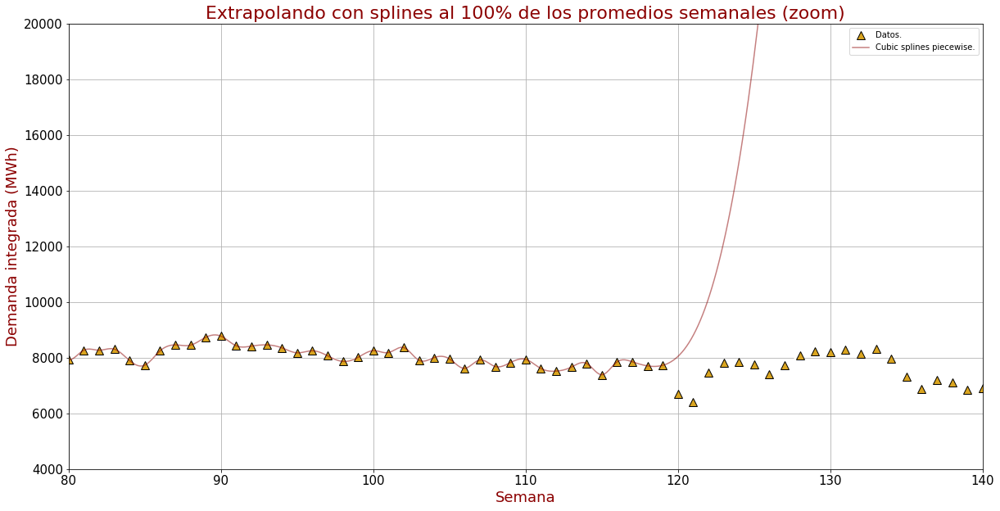

In [94]:
fig = plt.figure(figsize=(20,10))
plt.xlim(80, 140)
plt.ylim(4000, 20000)
plt.plot(data_sem.index, data_sem.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_sem_80_100p, y_eval_spline_sem_80_100p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Extrapolando con splines al 100% de los promedios semanales (zoom)", fontsize = 22 , color = 'darkred')
plt.xlabel('Semana', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

#### **Splines Para Promedios Mensuales de la Demanda Integrada**

Usando splines con promedios mensuales (100% de los datos):

In [95]:
prom_mes = [7285.460268751487,
 7400.124542248513,
 7462.5290447247025,
 7333.035322370535,
 6976.139683071429,
 7283.508775816964,
 7884.786914772321,
 7935.978321473215,
 8196.578321721727,
 8627.949431723213,
 7774.764048645834,
 7928.458489922619,
 7953.865509260417,
 7598.409539511904,
 7551.6820763318465,
 7320.622599465774,
 7400.185399532738,
 7017.390314367559,
 7601.3055819181545,
 8130.052324486607,
 8195.724252488097,
 8086.864735035714,
 8599.412777272322,
 8354.646350541667,
 8052.294688273809,
 8180.1891605818455,
 7878.221837830358,
 7768.414520651786,
 7593.689081572917,
 7786.798016864584,
 7102.5968864985125,
 7694.116693946429,
 8210.2555446503,
 7930.781457331846,
 7008.239334861606,
 7495.371733497024,
 7995.248408486606,
 7695.375874041666]

In [96]:
prom_a_mes = np.array(prom_mes)
x_mes = np.array(list(range(1,39)))
data_mes = pd.DataFrame(prom_mes, columns = ['Promedio'])
mes = pd.DataFrame(x_mes, columns = ['Mes']) 
data_mes['Mes'] = mes['Mes']

In [97]:
data_mes.tail(4)

,Promedio,Mes
34,7008.239335,35
35,7495.371733,36
36,7995.248408,37
37,7695.375874,38


In [98]:
mpoints_mes = 38
x_mes = np.linspace(0, 37, mpoints_mes)
#Haciendo splines cúbicos, 100% promedios mensuales:
spline_mes = interp1d(x_mes, data_mes.Promedio, kind = 'cubic', fill_value='extrapolate')
x_eval_spline_mes = np.linspace(0,len(x_mes),1000)
y_eval_spline_mes = spline_mes(x_eval_spline_mes)

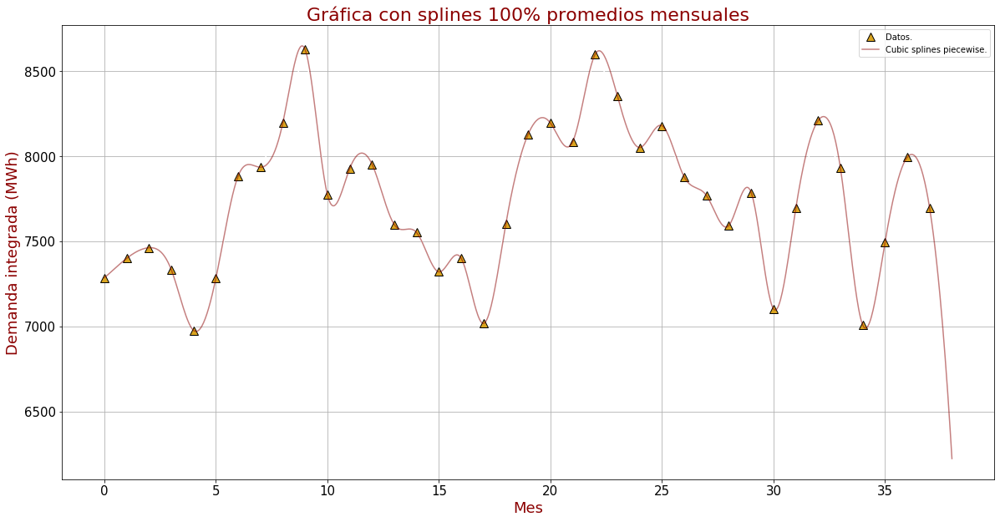

In [99]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_mes.index, data_mes.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes, y_eval_spline_mes, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Gráfica con splines 100% promedios mensuales", fontsize = 22 , color = 'darkred')
plt.xlabel('Mes', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Usando splines con promedios mensuales (80% de los datos):

In [100]:
#Creando arreglo para eliminar el 20% final de los datos mensuales:
del_rows_mes_80p = range(30,38)
print(del_rows_mes_80p)
#Trabajando con el 80% de los valores valores:
data_mes_80p = data_mes.drop(data_mes.index[del_rows_mes_80p], axis = 0)

range(30, 38)


In [101]:
data_mes_80p.tail(5)

,Promedio,Mes
25,8180.189161,26
26,7878.221838,27
27,7768.414521,28
28,7593.689082,29
29,7786.798017,30


In [102]:
mpoints_mes_80p = 30
x_mes_80p = np.linspace(0, 29, mpoints_mes_80p)
#Haciendo splines cúbicos, 80% promedios mensuales:
spline_mes_80p = interp1d(x_mes_80p, data_mes_80p.Promedio, kind = 'cubic', fill_value='extrapolate')
#y_eval_spline_mes_80p = spline_mes_80p(x_mes_80p)

x_eval_spline_mes_80p = np.linspace(0,len(x_mes_80p),1000)
y_eval_spline_mes_80p = spline_mes_80p(x_eval_spline_mes_80p)

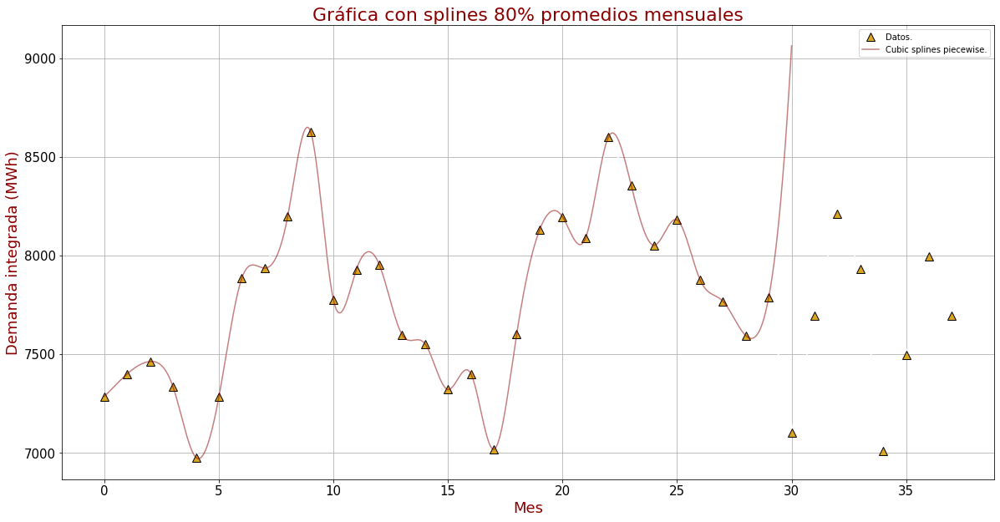

In [103]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_mes.index, data_mes.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_80p, y_eval_spline_mes_80p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Gráfica con splines 80% promedios mensuales", fontsize = 22 , color = 'darkred')
plt.xlabel('Mes', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Análogamente al caso anterior, veamos si este modelo se acerca a los promedio de los meses restantes

Extrapolando con splines al 100% de los datos mensuales:

In [104]:
x_eval_spline_mes_80_100p = np.linspace(0,len(x_mes),1000)
y_eval_spline_mes_80_100p = spline_mes_80p(x_eval_spline_mes_80_100p)

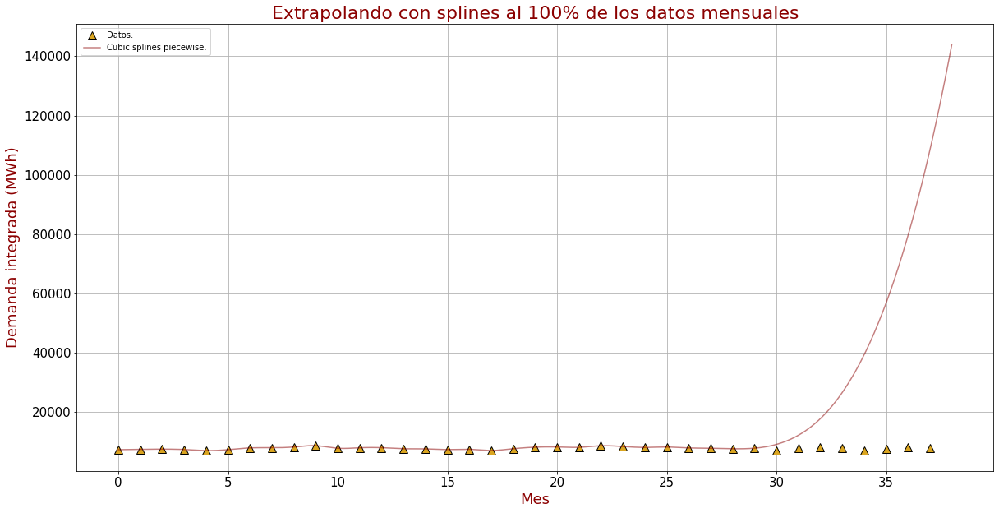

In [105]:
fig = plt.figure(figsize=(20,10))
plt.plot(data_mes.index, data_mes.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_80_100p, y_eval_spline_mes_80_100p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Extrapolando con splines al 100% de los datos mensuales", fontsize = 22 , color = 'darkred')
plt.xlabel('Mes', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

Haciendo zoom al final:

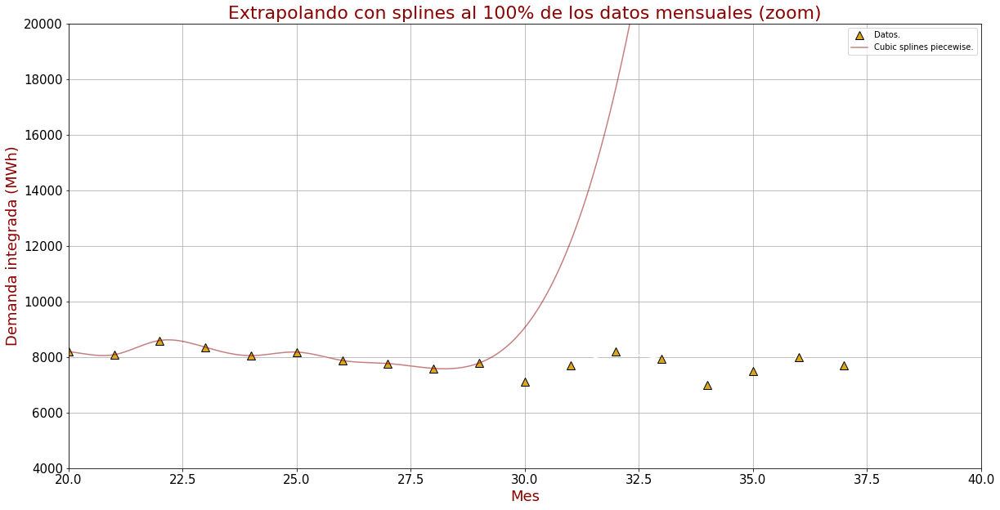

In [106]:
fig = plt.figure(figsize=(20,10))
plt.xlim(20, 40)
plt.ylim(4000, 20000)
plt.plot(data_mes.index, data_mes.Promedio, color= 'white' ,
         marker = '^' , markersize = 10.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(x_eval_spline_mes_80_100p, y_eval_spline_mes_80_100p, color = 'darkred' , alpha = 0.5)
plt.legend(['Datos.','Cubic splines piecewise.'], loc='best')
plt.title("Extrapolando con splines al 100% de los datos mensuales (zoom)", fontsize = 22 , color = 'darkred')
plt.xlabel('Mes', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda integrada (MWh)', fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

# **Cálculo de Energía Consumida**

Con el propósito de facilitar la integración de los segundos registrados en el *dataset* *Muestra_1h.csv* se empleará la función *trapz()* la cual integra con trapecios los puntos registrados, la documentación es la siguiente:


#### **numpy.trapz** 

Para calcular el área bajo la curva de demanda de la manera más precisa posible, considerando el 100% de los datos disponibles sin necesidad de generar algún polinomio interpolador, se utilizó la función `numpy.trapz`:

Esta función se utilizó de la siguiente forma:

`numpy.trapz(y, x)`

Donde estos son los argumentos:

+ `y`: Conjunto de datos a interpolar, valores en el eje y.
+ `x`: Conjunto de datos a interpolar, valores en el eje x.

Esta función utiliza la regla compuesta del trapecio, haciendo uso de todos los puntos que se ingresan para generar los distintos trapecios a integrar.

El valor obtenido con esta función, se usó de referencia para comparar la precisión de distintos métodos de integración (integración de polinomios de distintos grados, considerando la altura media del consumo, el promedio del consumo, etc.)

El sistema de información que registra las demandas en el tiempo, calcula la energía consumida en el periodo utilizando una aproximación mediante el promedio reportado en el intérvalo de una hora. Sin embargo, contrastaremos este métodos con los vistos en clase para integrar.

Como se menciona anteriormente, es de interés realizar estimaciones del cálculo de la energía consumida en cierto periodo de tiempo para ver si la forma en que se obtiene actualmente ese valor (mediante promedios horarios) es correcta, o bien si por medio de ajustes de polinomios se puede estimar de manera adecuada y cuántos puntos se requieren para ello.

Para hacer este ejercicio se consideran los siguientes datos:

1. Base de datos con registros de la demanda instantánea con resolución de 2 segundos. Se tienen registros de 2 días completos, uno corresponde a un día de verano de 2019 y otro a un día de invierno de ese mismo año.
2. Cálculo de la energía consumida en una hora calculada como el promedio de la demanda instantánea registrada en ese periodo, ya que sus unidades son MWh.

En la siguiente gráfica se muestra la forma del Data Frame que contiene la información y la forma de demanda presentada en la primera hora registrada del data frame.

In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
os.getcwd()
hora = pd.read_csv("Muestra_1h.csv")
hora.head()

,seg,dia_ver,dia_inv,d_ver_ord,d_inv_ord
0,0,8544.239258,6029.090820,8655.427734,6037.630371
1,2,8538.705078,6037.630371,8655.117188,6029.090820
2,4,8556.333008,6025.855469,8650.758789,6025.855469
3,6,8563.195313,6022.599609,8649.875000,6022.599609
4,8,8559.343750,6020.984375,8649.875000,6021.845703


In [110]:
hora.tail()

,seg,dia_ver,dia_inv,d_ver_ord,d_inv_ord
1795,3590,8045.339844,5710.942383,7967.404297,5633.074219
1796,3592,8044.067383,5711.786133,7965.182617,5632.243164
1797,3594,8044.067383,5705.914551,7965.084961,5632.129883
1798,3596,8048.309570,5709.871094,7964.742188,5629.275391
1799,3598,8051.222168,5709.544434,7961.383789,5627.437500


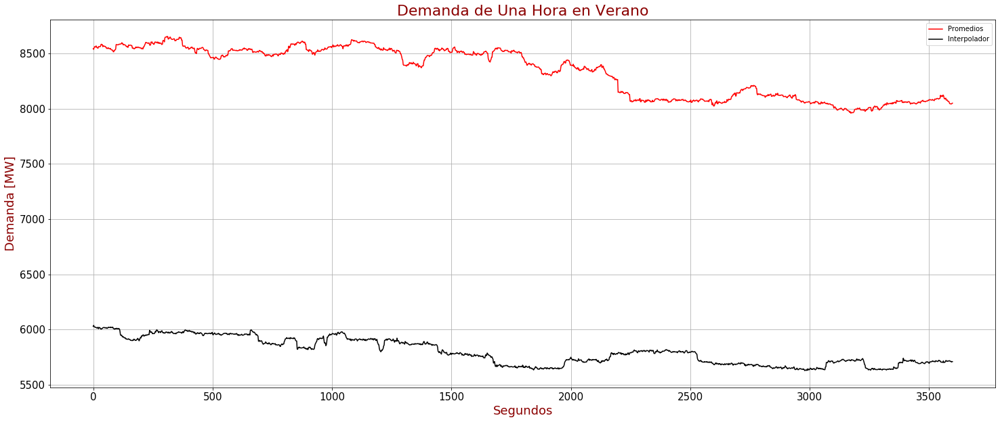

In [111]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, 'r-',
         hora.seg, hora.dia_inv, 'k-')
plt.title("Demanda de Una Hora en Verano" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc='best')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_h_1.png')
plt.show()

Veamos que una recta no es la mejor idea para ajustar esta curva

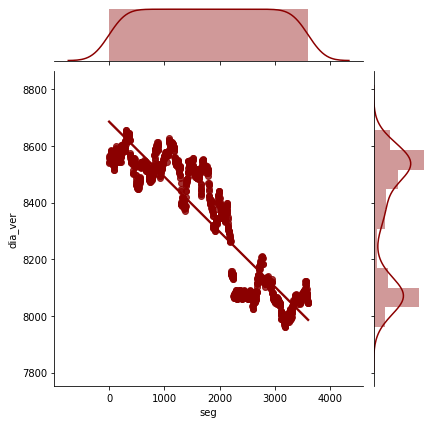

In [112]:
hora_reg_v = sns.jointplot(data = hora , x = 'seg' , y = 'dia_ver' , kind = 'reg' , color = 'darkred')

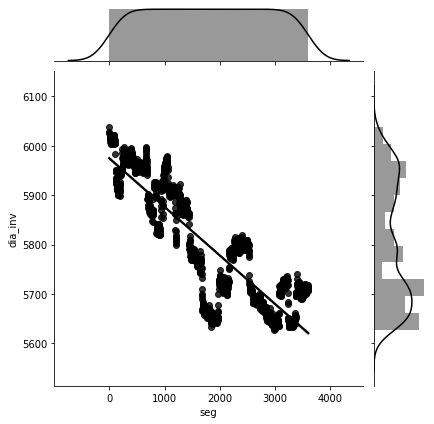

In [113]:
hora_reg_i = sns.jointplot(data = hora , x = 'seg' , y = 'dia_inv' , kind = 'reg' , color = 'black')

Debido a que son valores con diferencias considerables en sus magnitudes, se grafican en valores por unidad, en función del porcentaje de la demnada máxima de cada día para apreciar mejor sus formas y ver diferencias en una misma imágen.

In [2]:
ver_pu = []
inv_pu = []
ord_ver_pu = []
ord_inv_pu = []
max_ver = max(hora.dia_ver)
max_inv = max(hora.dia_inv)
for i in range(len(hora.seg)):
    ver_pu.append(hora.dia_ver[i]/max_ver)
    inv_pu.append(hora.dia_inv[i]/max_inv)
    ord_ver_pu.append(hora.d_ver_ord[i]/max_ver)
    ord_inv_pu.append(hora.d_inv_ord[i]/max_inv)

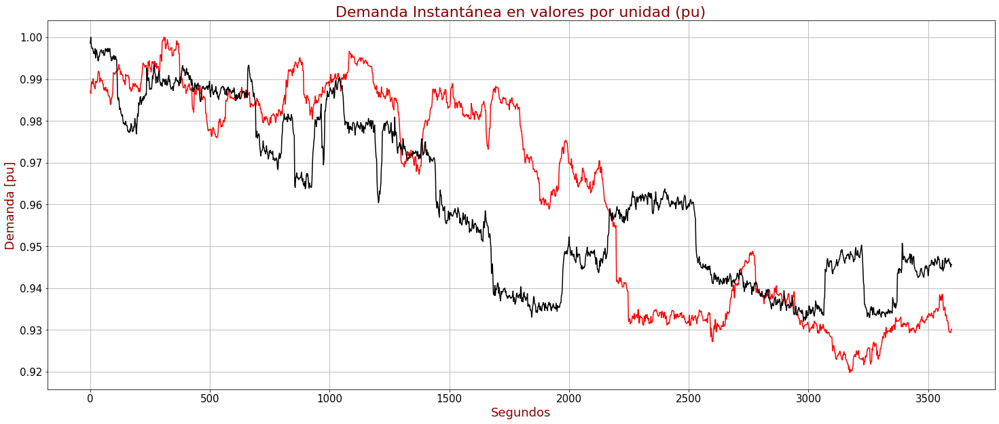

In [115]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, ver_pu, 'r-',
         hora.seg, inv_pu, 'k-')
plt.title("Demanda Instantánea en valores por unidad (pu)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [pu]" , fontsize = 18 , color = 'darkred')
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Demanda_Instantanea_hora_pu.png')
plt.show()

**Nota:** Es importante observar que la máxima variación entre los valores máximos y mínimos de la demanda en el periodo de una hora no es superior a 8%.

De acuerdo con lo mencionado al principio, la forma actual de calcular la demanda de los periodos horarios es mediante el promedio de las demandas registradas en el periodo de una hora (MWh). Para las dos muestras de una hora que se recolectaron, tendríamos los siguientes valores de energía calculados con ese método.

In [3]:
cons_ver = hora.dia_ver.mean()
cons_inv = hora.dia_inv.mean()
print("Consumo de 1 hora en el día de verano: ",cons_ver, " MWh")
print("Consumo de 1 hora en el día de invierno: ",cons_inv, " MWh")

Consumo de 1 hora en el día de verano:  8336.150364352778  MWh
Consumo de 1 hora en el día de invierno:  5797.955498607777  MWh


Estos valores de energía serían nuestra referencia para los cálculos de la energía a partir de polinimoios o bien Splines.

### Cálculo a través de Polinomios 

+ **Polinomio grado dos**

In [4]:
n_m = []
x = []
k = 0
n_puntos = 2 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(hora.dia_ver[n_m[i]])
    yi.append(hora.dia_inv[n_m[i]])

x.append(3598)
yv.append(hora.dia_ver[1799])
yi.append(hora.dia_inv[1799])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

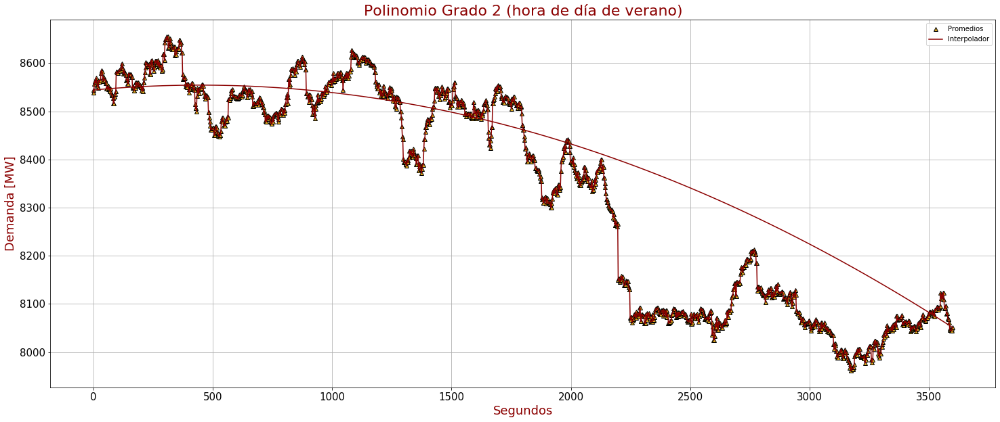

In [119]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(hora.seg, hora.dia_ver, color = 'darkred')
plt.title("Polinomio Grado 2 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_1.png')
plt.show()

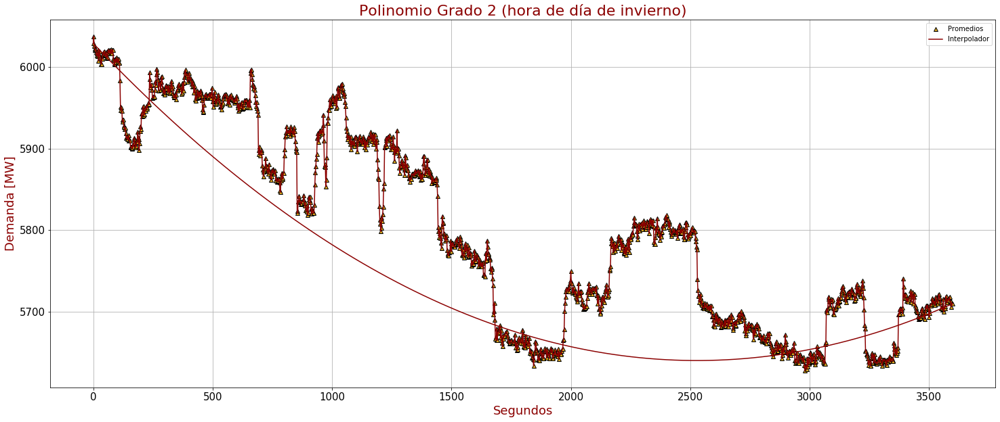

In [121]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_inv, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_i, color = 'darkred')
plt.plot(hora.seg, hora.dia_inv, color = 'darkred')
plt.title("Polinomio Grado 2 (hora de día de invierno)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Invierno_p_1.png')
plt.show()

Cuyo valor para la integral es el siguiente

In [122]:
f_2_v = lambda x: coef_aj_v[0]*(x**2) + coef_aj_v[1]*(x**1) + coef_aj_v[2]*(x**0)
f_2_i = lambda x: coef_aj_i[0]*(x**2) + coef_aj_i[1]*(x**1) + coef_aj_i[2]*(x**0)

In [123]:
c_2_v = Tcf(f_2_v,0,3600,10000)/3600
c_2_i = Tcf(f_2_i,0,3600,10000)/3600
print("Consumo de 1 hora en el día de verano: ",c_2_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",c_2_i, " MWh")

Consumo de 1 hora en el día de verano:  8406.938381233025  MWh
Consumo de 1 hora en el día de invierno:  5737.970980029961  MWh


+ **Polinomio grado 3**

In [124]:
n_m = []
x = []
k = 0
n_puntos = 3 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(hora.dia_ver[n_m[i]])
    yi.append(hora.dia_inv[n_m[i]])

x.append(3598)
yv.append(hora.dia_ver[1799])
yi.append(hora.dia_inv[1799])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

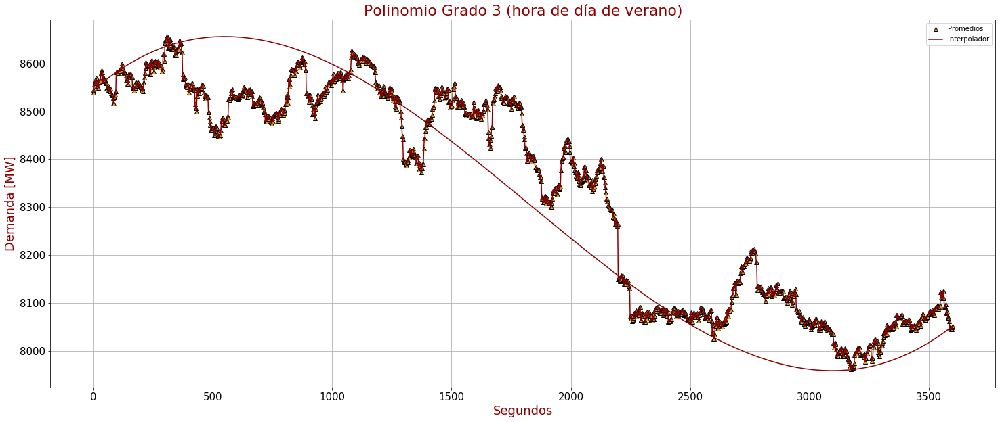

In [126]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(hora.seg, hora.dia_ver, color = 'darkred')
plt.title("Polinomio Grado 3 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_2.png')
plt.show()

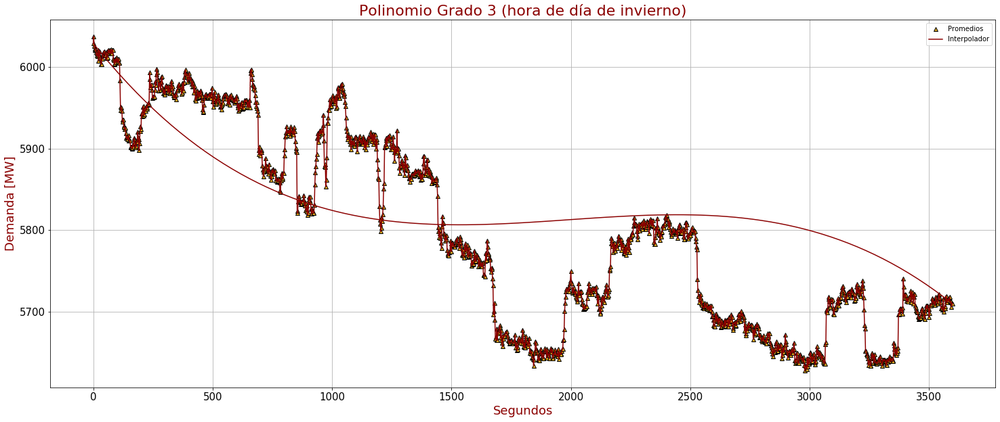

In [127]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_inv, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_i, color = 'darkred')
plt.plot(hora.seg, hora.dia_inv, color = 'darkred')
plt.title("Polinomio Grado 3 (hora de día de invierno)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Invierno_p_2.png')
plt.show()

In [128]:
a = [coef_aj_v[0],coef_aj_i[0]]
b = [coef_aj_v[1],coef_aj_i[1]]
c = [coef_aj_v[2],coef_aj_i[2]]
d = [coef_aj_v[3],coef_aj_i[3]]

f_v=lambda x: a[0]*(x**3)+b[0]*(x**2)+c[0]*x+d[0]
f_i=lambda x: a[1]*(x**3)+b[1]*(x**2)+c[1]*x+d[1]

c_3_v = Tcf(f_v,0,3600,10000)/3600
c_3_i = Tcf(f_i,0,3600,10000)/3600
print("Consumo de 1 hora en el día de verano: ",c_3_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",c_3_i, " MWh")

Consumo de 1 hora en el día de verano:  8310.38184508684  MWh
Consumo de 1 hora en el día de invierno:  5829.073847368828  MWh


+ **Polinomio grado cuatro**

In [129]:
n_m = []
x = []
k = 0
n_puntos = 4 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(hora.dia_ver[n_m[i]])
    yi.append(hora.dia_inv[n_m[i]])

x.append(3598)
yv.append(hora.dia_ver[1799])
yi.append(hora.dia_inv[1799])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

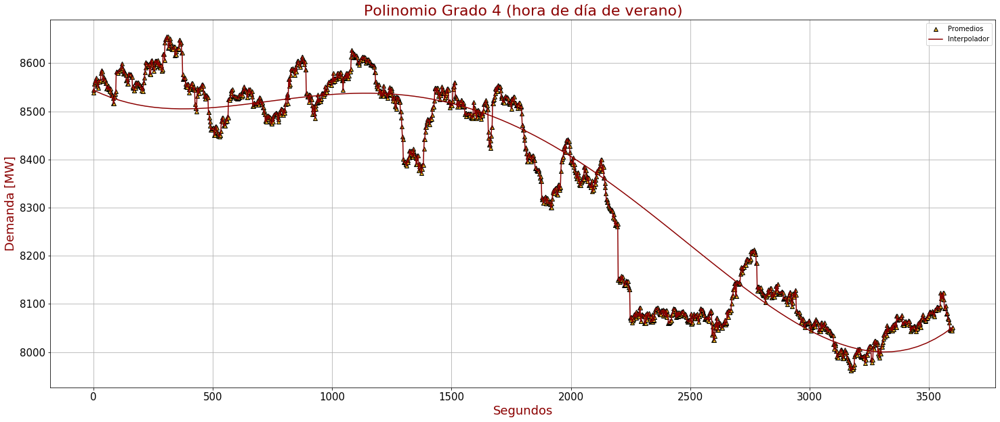

In [130]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(hora.seg, hora.dia_ver, color = 'darkred')
plt.title("Polinomio Grado 4 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_3.png')
plt.show()

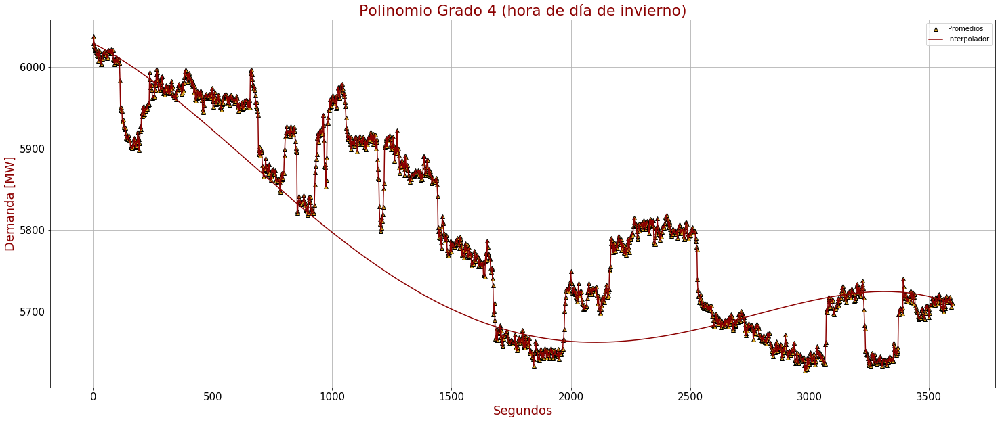

In [131]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_inv, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_i, color = 'darkred')
plt.plot(hora.seg, hora.dia_inv, color = 'darkred')
plt.title("Polinomio Grado 4 (hora de día de invierno)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Invierno_p_3.png')
plt.show()

In [132]:
a = [coef_aj_v[0],coef_aj_i[0]]
b = [coef_aj_v[1],coef_aj_i[1]]
c = [coef_aj_v[2],coef_aj_i[2]]
d = [coef_aj_v[3],coef_aj_i[3]]
e = [coef_aj_v[4],coef_aj_i[4]]

f_v=lambda x: a[0]*(x**4)+b[0]*(x**3)+c[0]*(x**2)+d[0]*x+e[0]
f_i=lambda x: a[1]*(x**4)+b[1]*(x**3)+c[1]*(x**2)+d[1]*x+e[1]

c_4_v = Tcf(f_v,0,3600,10000)/3600
c_4_i = Tcf(f_i,0,3600,10000)/3600
print("Consumo de 1 hora en el día de verano: ",c_4_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",c_4_i, " MWh")

Consumo de 1 hora en el día de verano:  8347.605374453113  MWh
Consumo de 1 hora en el día de invierno:  5762.325235010879  MWh


A partir de este grado, se hace una comparación con la función de *numpy* , *trapz()* la cual calcula el valor del área bajo una curva definida en puntos de un intérvalo, considerando los puntos evaluados por el polinomio calculado.

In [133]:
df_xeval = np.array(xeval)
df_yeval_v = np.array(yeval_v)
df_yeval_i = np.array(yeval_i)
dem_trapz_v = np.trapz(df_yeval_v,df_xeval)
dem_trapz_i = np.trapz(df_yeval_i,df_xeval)
print("Consumo de 1 hora en el día de verano: ",dem_trapz_v/3600, " MWh")
print("Consumo de 1 hora en el día de invierno: ",dem_trapz_i/3600, " MWh")

Consumo de 1 hora en el día de verano:  8343.10216232828  MWh
Consumo de 1 hora en el día de invierno:  5759.1223229191  MWh


**Como observamos el valor obtenido es muy parecido al calculado a través del polinomio y sin necesidad de estar definiendo la función *lamda* que despúes se pasa como argumento a la función *Tcf()***

+ **Polinomio grado cinco**

In [134]:
n_m = []
x = []
k = 0
n_puntos = 5 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(hora.dia_ver[n_m[i]])
    yi.append(hora.dia_inv[n_m[i]])

x.append(3598)
yv.append(hora.dia_ver[1799])
yi.append(hora.dia_inv[1799])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

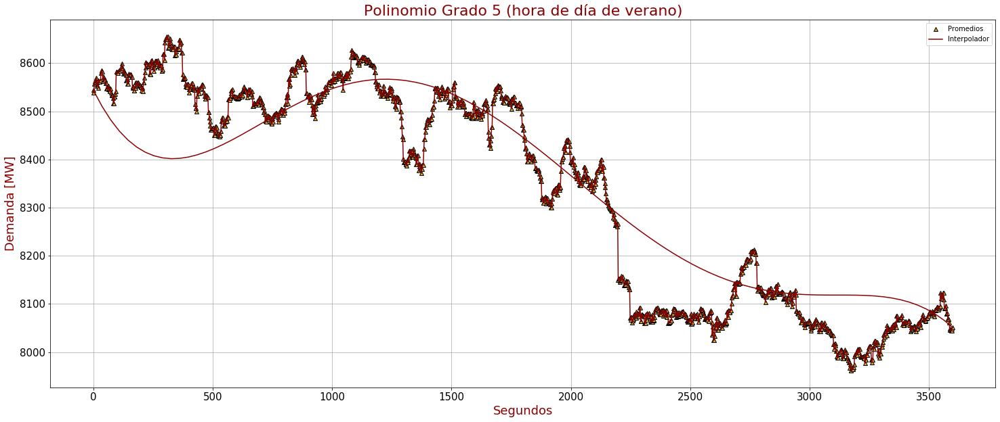

In [135]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(hora.seg, hora.dia_ver, color = 'darkred')
plt.title("Polinomio Grado 5 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_4.png')
plt.show()

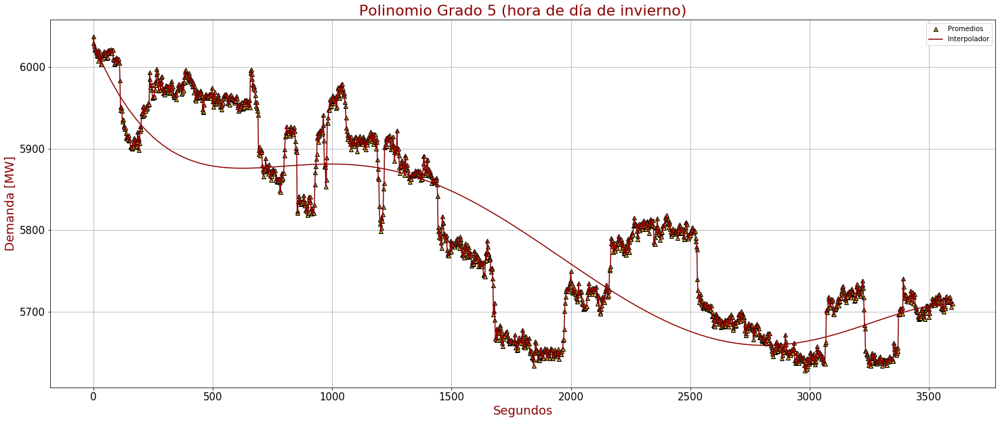

In [136]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_inv, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_i, color = 'darkred')
plt.plot(hora.seg, hora.dia_inv, color = 'darkred')
plt.title("Polinomio Grado 5 (hora de día de invierno)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Invierno_p_5.png')
plt.show()

In [137]:
df_yeval_v = np.array(yeval_v)
df_yeval_i = np.array(yeval_i)
c_5_v = np.trapz(df_yeval_v,df_xeval)/3600
c_5_i = np.trapz(df_yeval_i,df_xeval)/3600
print("Consumo de 1 hora en el día de verano: ",c_5_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",c_5_i, " MWh")

Consumo de 1 hora en el día de verano:  8339.156564057355  MWh
Consumo de 1 hora en el día de invierno:  5786.389849648193  MWh


+ **Polinomio grado seis**

In [138]:
n_m = []
x = []
k = 0
n_puntos = 6 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(hora.dia_ver[n_m[i]])
    yi.append(hora.dia_inv[n_m[i]])

x.append(3598)
yv.append(hora.dia_ver[1799])
yi.append(hora.dia_inv[1799])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

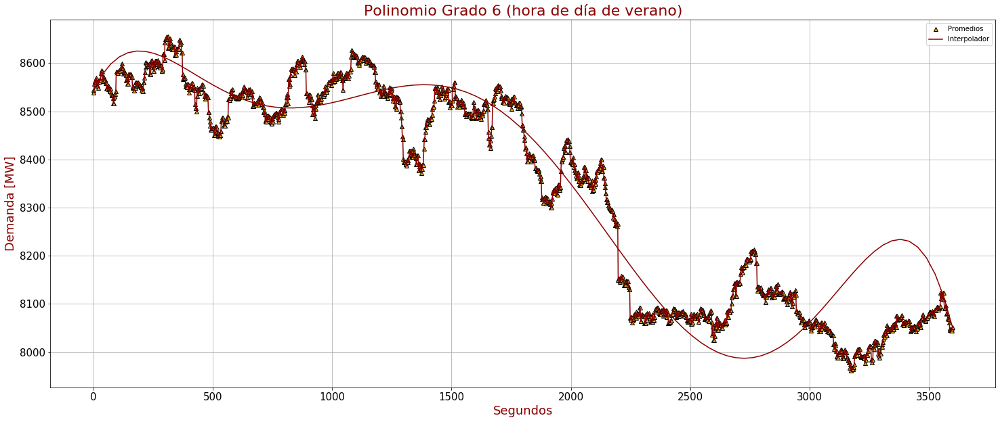

In [139]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(hora.seg, hora.dia_ver, color = 'darkred')
plt.title("Polinomio Grado 6 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_5.png')
plt.show()

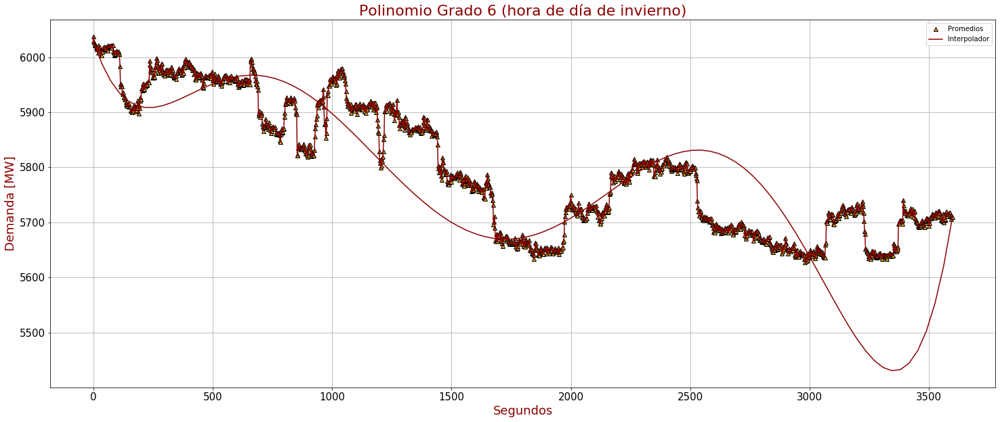

In [140]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_inv, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_i, color = 'darkred')
plt.plot(hora.seg, hora.dia_inv, color = 'darkred')
plt.title("Polinomio Grado 6 (hora de día de invierno)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Invierno_p_5.png')
plt.show()

In [141]:
df_yeval_v = np.array(yeval_v)
df_yeval_i = np.array(yeval_i)
c_6_v = np.trapz(df_yeval_v,df_xeval)/3600
c_6_i = np.trapz(df_yeval_i,df_xeval)/3600
print("Consumo de 1 hora en el día de verano: ",c_6_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",c_6_i, " MWh")

Consumo de 1 hora en el día de verano:  8346.221191319808  MWh
Consumo de 1 hora en el día de invierno:  5764.174785417042  MWh


De manera ilustrativa, se mostrarán dos polinomis más para constratar cómo se van ajustando los polinomios para los datos de la hora.

+ **Polinomio Grado Siete**

In [173]:
n_m = []
x = []
k = 0
n_puntos = 7 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1806/n_puntos)

y = []
for i in range(len(x)):
    y.append(hora.dem[n_m[i]])

x.append(3598)
y.append(hora.orden[1799])

coef_aj = np.polyfit(x, y, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval = np.polyval(coef_aj,xeval)

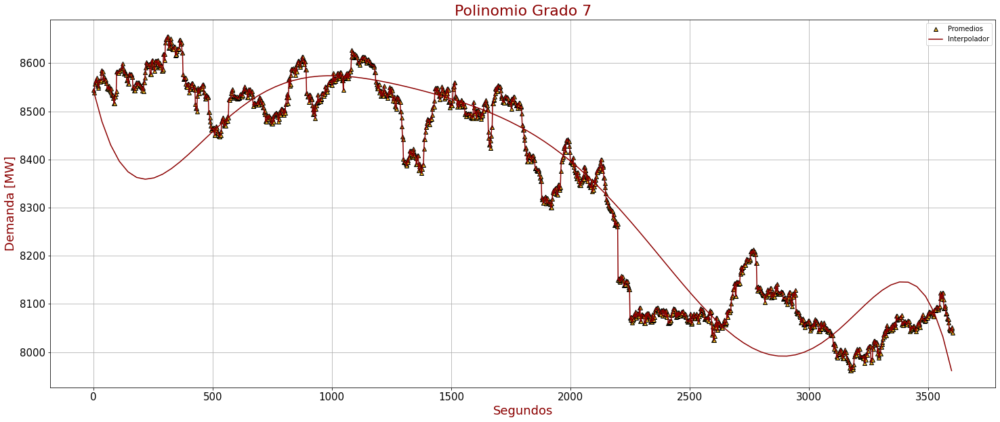

In [174]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dem, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval, color = 'darkred')
plt.plot(hora.seg, hora.dem, color = 'darkred')
plt.title("Polinomio Grado 7" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_h_7.png')
plt.show()

In [176]:
n_m = []
x = []
k = 0
n_puntos = 8 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

y = []
for i in range(len(x)):
    y.append(hora.dem[n_m[i]])

x.append(3598)
y.append(hora.orden[1799])

coef_aj = np.polyfit(x, y, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval = np.polyval(coef_aj,xeval)

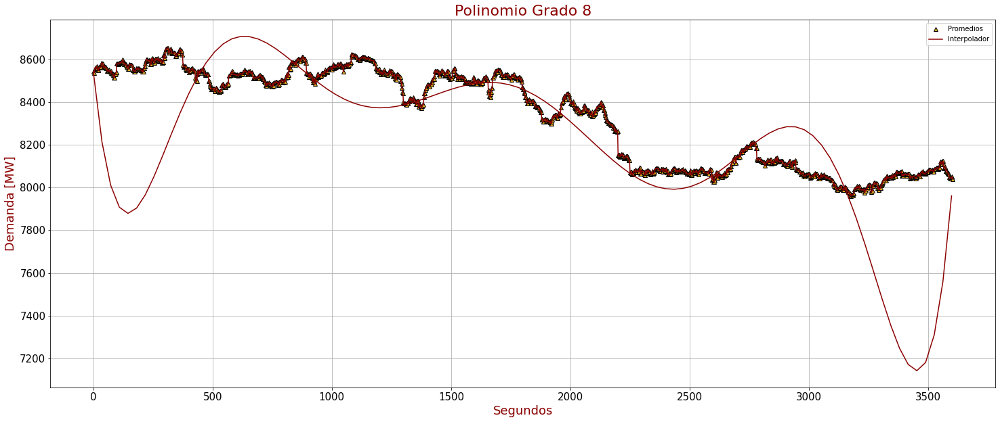

In [177]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dem, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval, color = 'darkred')
plt.plot(hora.seg, hora.dem, color = 'darkred')
plt.title("Polinomio Grado 8" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_h_8.png')
plt.show()

Podríamos seguir probando diferentes grados de los polinomios, sin embargo se ve que las diferencias no son significativas. Consideremos ahora un polinomio de grado mucho mayor, **por ejemplo de grado 60:**

+ **Polinomio grado 60**

In [143]:
n_m = []
x = []
k = 0
n_puntos = 60 # Solo submúltiplos de 1,800
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(1800/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(hora.dia_ver[n_m[i]])
    yi.append(hora.dia_inv[n_m[i]])

x.append(3598)
yv.append(hora.dia_ver[1799])
yi.append(hora.dia_inv[1799])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

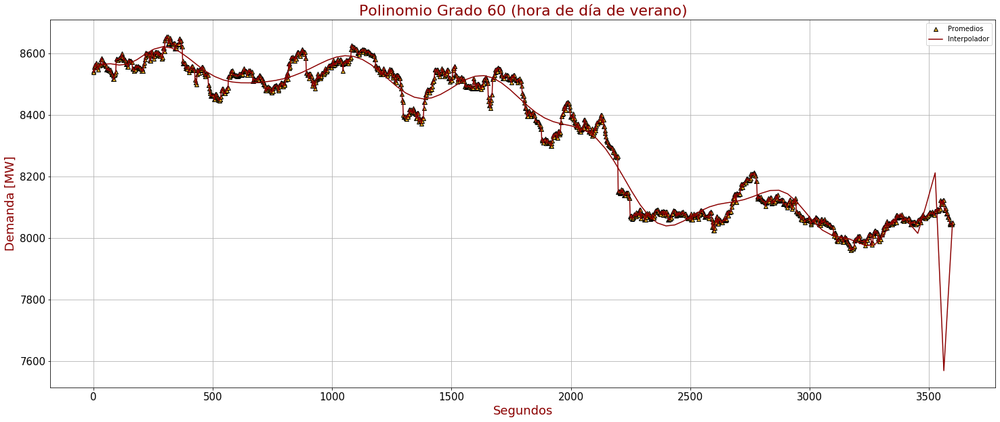

In [145]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_ver, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(hora.seg, hora.dia_ver, color = 'darkred')
plt.title("Polinomio Grado 60 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_60.png')
plt.show()

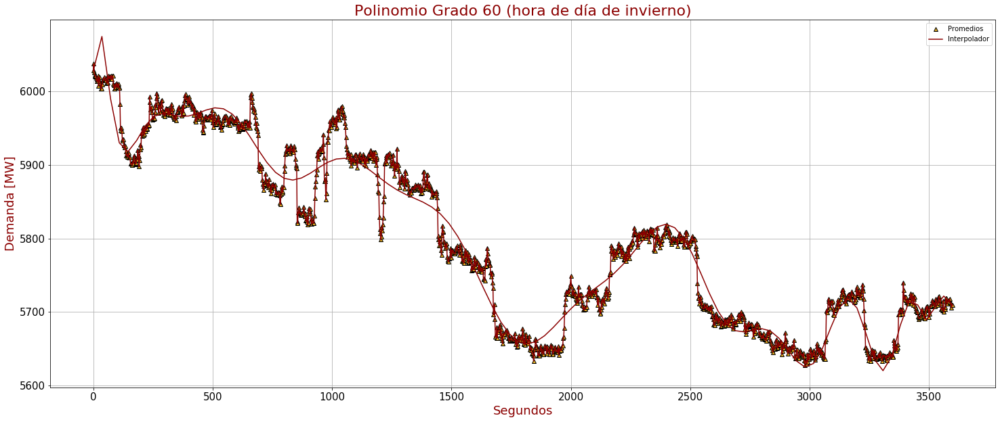

In [146]:
plt.figure(figsize=(25,10))
plt.plot(hora.seg, hora.dia_inv, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_i, color = 'darkred')
plt.plot(hora.seg, hora.dia_inv, color = 'darkred')
plt.title("Polinomio Grado 60 (hora de día de invierno)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Invierno_p_60.png')
plt.show()

In [147]:
df_yeval_v = np.array(yeval_v)
df_yeval_i = np.array(yeval_i)
c_60_v = np.trapz(df_yeval_v,df_xeval)/3600
c_60_i = np.trapz(df_yeval_i,df_xeval)/3600
print("Consumo de 1 hora en el día de verano: ",c_60_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",c_60_i, " MWh")

Consumo de 1 hora en el día de verano:  8328.480850512997  MWh
Consumo de 1 hora en el día de invierno:  5793.801868040159  MWh


En resumen se tienen los siguientes resultados:

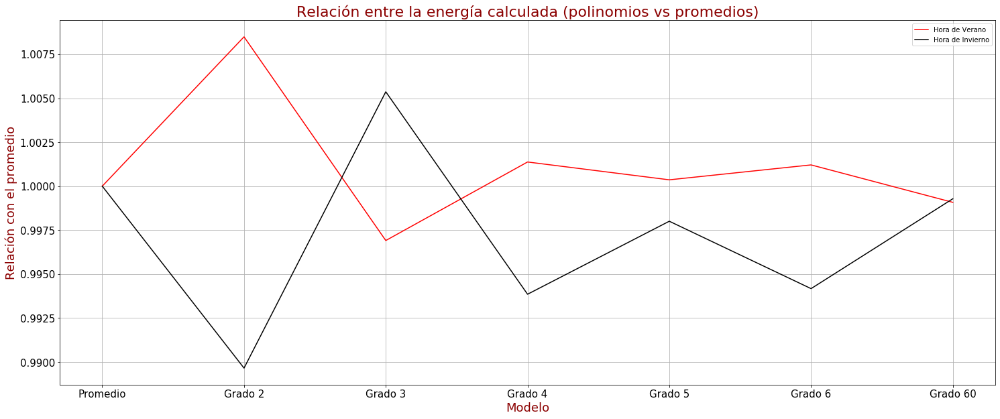

In [162]:
nom = ["Promedio","Grado 2","Grado 3","Grado 4","Grado 5","Grado 6","Grado 60"]
res_v = [1, c_2_v/cons_ver, c_3_v/cons_ver, c_4_v/cons_ver, c_5_v/cons_ver, c_6_v/cons_ver, c_60_v/cons_ver]
res_i = [1, c_2_i/cons_inv, c_3_i/cons_inv, c_4_i/cons_inv, c_5_i/cons_inv, c_6_i/cons_inv, c_60_i/cons_inv]
plt.figure(figsize=(25,10))
plt.plot(nom,res_v,'r-',
         nom,res_i,'k-')
plt.title("Relación entre la energía calculada (polinomios vs promedios)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Modelo" , fontsize = 18 , color = 'darkred')
plt.ylabel("Relación con el promedio" , fontsize = 18 , color = 'darkred')
plt.legend(["Hora de Verano","Hora de Invierno"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)

Finalmente, se calcula con el método que parecería más adecuado, realizando la integración con todos los puntos de la muestra y aplicando la función *trapz()*

In [164]:
real_v = np.trapz(hora.dia_ver,hora.seg)/3600
real_i = np.trapz(hora.dia_inv,hora.seg)/3600
print("Consumo de 1 hora en el día de verano: ",real_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",real_i, " MWh")

Consumo de 1 hora en el día de verano:  8331.540513956666  MWh
Consumo de 1 hora en el día de invierno:  5794.694766592777  MWh


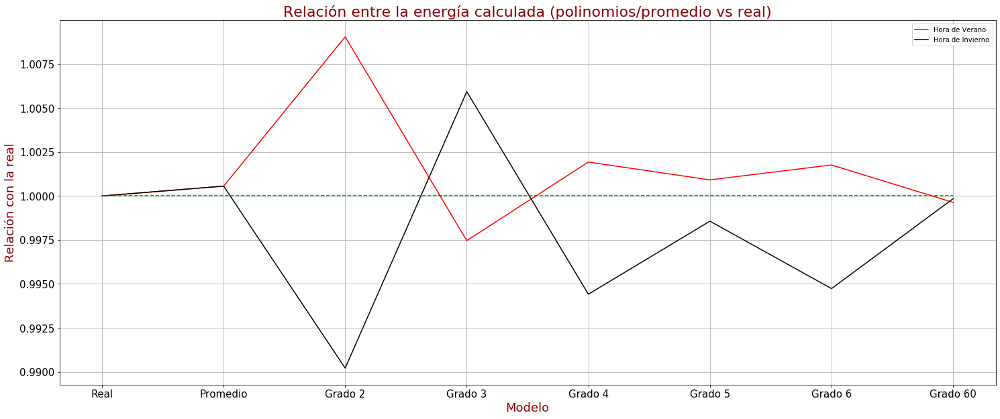

In [167]:
nom = ["Real","Promedio","Grado 2","Grado 3","Grado 4","Grado 5","Grado 6","Grado 60"]
plt.figure(figsize=(25,10))
res_v = [1,cons_ver/real_v, c_2_v/real_v, c_3_v/real_v, c_4_v/real_v, c_5_v/real_v, c_6_v/real_v, c_60_v/real_v]
res_i = [1,cons_inv/real_i, c_2_i/real_i, c_3_i/real_i, c_4_i/real_i, c_5_i/real_i, c_6_i/real_i, c_60_i/real_i]
eje = [1, 1, 1, 1, 1, 1, 1, 1]
plt.plot(nom,res_v,'r-',
         nom,res_i,'k-',
         nom,eje,'g--')
plt.title("Relación entre la energía calculada (polinomios/promedio vs real)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Modelo" , fontsize = 18 , color = 'darkred')
plt.ylabel("Relación con la real" , fontsize = 18 , color = 'darkred')
plt.legend(["Hora de Verano","Hora de Invierno"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)

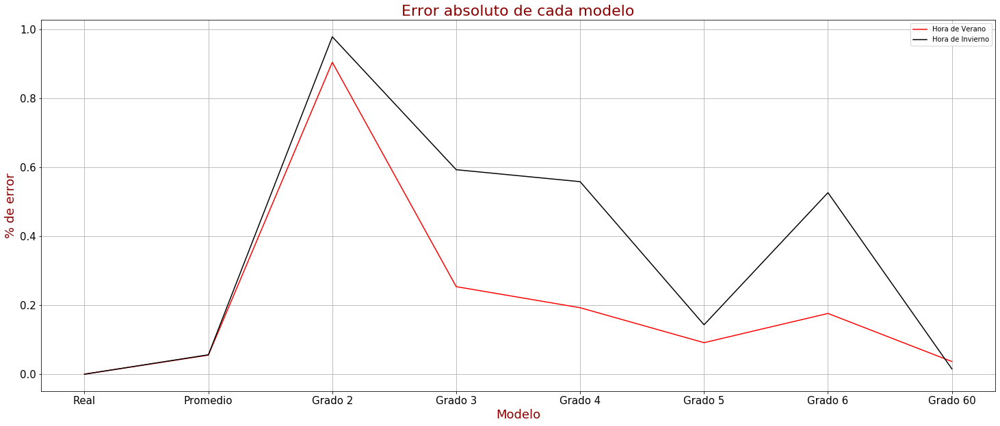

In [168]:
eabs_v = []
eabs_i = []
for i in range(len(res_v)):
    eabs_v.append(abs(real_v-res_v[i]*real_v)*100/real_v)
    eabs_i.append(abs(real_i-res_i[i]*real_i)*100/real_i)
plt.figure(figsize=(25,10))
plt.plot(nom,eabs_v,'r-',
         nom,eabs_i,'k-')
plt.title("Error absoluto de cada modelo" , fontsize = 22 , color = 'darkred')
plt.xlabel("Modelo" , fontsize = 18 , color = 'darkred')
plt.ylabel("% de error" , fontsize = 18 , color = 'darkred')
plt.legend(["Hora de Verano","Hora de Invierno"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)

Finalmente, dado que se cuenta con la información de todo un día, con muestras cada 2 segundos. Se realiza el mismo ejercicio solo que ahora se tratará de calcular la energía consumida en las 24 horas.

In [153]:
dia = pd.read_csv("Muestra_1d.csv")
dia

,seg,ver_comp,inv_comp
0,0,8544.239258,6029.090820
1,2,8538.705078,6037.630371
2,4,8556.333008,6025.855469
3,6,8563.195313,6022.599609
4,8,8559.343750,6020.984375
...,...,...,...
43196,86392,8599.916992,5882.093750
43197,86394,8610.962891,5880.681152
43198,86396,8610.962891,5883.436523
43199,86398,8605.673828,5889.870605


In [155]:
real_dia_v = np.trapz(dia.ver_comp,dia.seg)/3600
real_dia_i = np.trapz(dia.inv_comp,dia.seg)/3600
print("Consumo real de 1 día de verano: ",real_dia_v, " MWh")
print("Consumo real de 1 día de invierno: ",real_dia_i, " MWh")

Consumo real de 1 día de verano:  211626.67243117304  MWh
Consumo real de 1 día de invierno:  142937.7533699578  MWh


De igual manera se calcula el consumo promedio del periodo:

In [156]:
cons_dia_ver = dia.ver_comp.mean()
cons_dia_inv = dia.inv_comp.mean()
print("Consumo promedio de 1 día de verano: ",cons_dia_ver*24, " MWh")
print("Consumo promedio de 1 día de invierno: ",cons_dia_inv*24, " MWh")

Consumo promedio de 1 día de verano:  211626.5377143995  MWh
Consumo promedio de 1 día de invierno:  142937.75672954324  MWh


Los valores son casi idénticos, esto se debe a la cantidad de puntos que se están analizando. Entonces entre mayor es la cantidad de puntos la función *trapz* y el promedio tienden a ser iguales. Ya que los intérvalos se subdividen en prácticamente el mismo número de puntos.

Ahora se calcula el polinomio para ajustar la forma de la curva de demanda, considerando 60 muestras del día (equidistantes) y se calcula la energía que representa este polinomio.

In [157]:
n_m = []
x = []
k = 0
n_puntos = 60 # Solo submúltiplos de 43200
for i in range(n_puntos):
    n_m.append(k)
    x.append(k*2)
    k = k+(43200/n_puntos)

yv = []
yi = []
for i in range(len(x)):
    yv.append(dia.ver_comp[n_m[i]])
    yi.append(dia.inv_comp[n_m[i]])

x.append(43200)
yv.append(dia.ver_comp[43200])
yi.append(dia.inv_comp[43200])

coef_aj_v = np.polyfit(x, yv, len(x)-1)
coef_aj_i = np.polyfit(x, yi, len(x)-1)

neval = 100
xeval = np.linspace(min(x), max(x), neval)
yeval_v = np.polyval(coef_aj_v,xeval)
yeval_i = np.polyval(coef_aj_i,xeval)

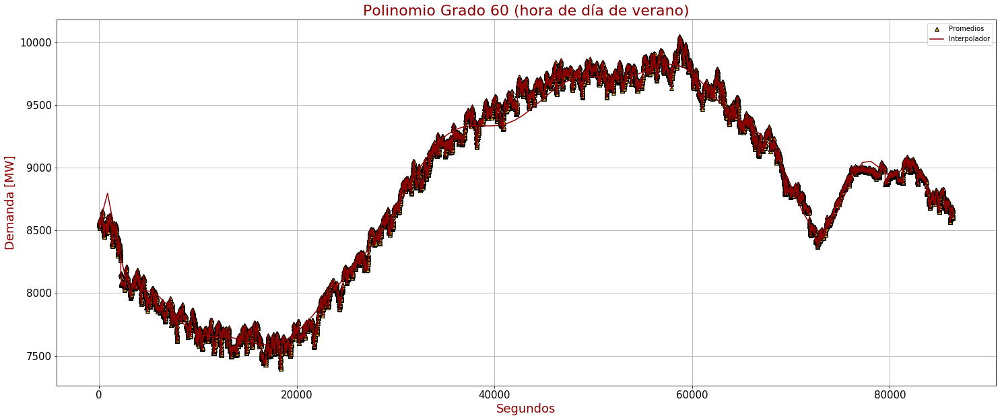

In [158]:
plt.figure(figsize=(25,10))
plt.plot(dia.seg, dia.ver_comp, color= 'white' ,
         marker = '^' , markersize = 6.0 , markeredgecolor='black' , markerfacecolor = 'goldenrod')
plt.plot(xeval, yeval_v, color = 'darkred')
plt.plot(dia.seg, dia.ver_comp, color = 'darkred')
plt.title("Polinomio Grado 60 (hora de día de verano)" , fontsize = 22 , color = 'darkred')
plt.xlabel("Segundos" , fontsize = 18 , color = 'darkred')
plt.ylabel("Demanda [MW]" , fontsize = 18 , color = 'darkred')
plt.legend(["Promedios","Interpolador"] , loc=0)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.savefig('Verano_p_60.png')
plt.show()

In [159]:
df_yeval_v = np.array(yeval_v)
df_yeval_i = np.array(yeval_i)
d_60_v = np.trapz(df_yeval_v,df_xeval)/3600
d_60_i = np.trapz(df_yeval_i,df_xeval)/3600
print("Consumo de 1 hora en el día de verano: ",d_60_v, " MWh")
print("Consumo de 1 hora en el día de invierno: ",d_60_i, " MWh")

Consumo de 1 hora en el día de verano:  8808.859743202815  MWh
Consumo de 1 hora en el día de invierno:  5946.230434005163  MWh


Calculamos el error que se obtiene:

In [160]:
er_dia = abs(real_dia_v-d_60_v)*100/real_dia_v
print(" El porcentaje de error es de: ",er_dia,"%\n","considerando solo el: ", 60*100/len(dia.seg), 
      "% de los datos disponibles")

 El porcentaje de error es de:  95.83754748774983 %
 considerando solo el:  0.1388856739427328 % de los datos disponibles


### **Consumo de Energía Usando _trapz()_  de un Día**

En este caso, usaremos la función *trapz()* para obtener el consumo a lo largo de un día de Verano, en este caso el 20 de Junio.

In [1]:
import pandas as pd
import os
import numpy as np
from scipy.interpolate import interp1d
import math
import matplotlib.pyplot as plt
import pprint

Generamos el DataFrame con los datos por segundo:

In [3]:
data_segundos = pd.read_csv("Verano_16.csv")
data_segundos.head()

,Hora,Demanda,Unnamed: 2,Unnamed: 3,03OCC .CR-CARGA AREA .AV
0,20-jun-19 00:00:00,8544.239258,NaN,NaN,6/20/19 0:00
1,20-jun-19 00:00:02,8538.705078,NaN,NaN,6/21/19 0:00
2,20-jun-19 00:00:04,8556.333008,NaN,NaN,2 s
3,20-jun-19 00:00:06,8563.195312,NaN,NaN,NaN
4,20-jun-19 00:00:08,8559.343750,NaN,NaN,NaN


In [8]:
seg = np.linspace(0, 86400, 43201)
a_seg = np.array(seg)
data_seg = pd.DataFrame(seg, columns = ["Segundo"]) 

In [7]:
DEM = pd.DataFrame(data_segundos.Demanda, columns = ["Demanda"])

Así se ve el DataFrame al final:

In [10]:
data_seg["Demanda"] = DEM["Demanda"]
data_seg

,Segundo,Demanda
0,0.0,8544.239258
1,2.0,8538.705078
2,4.0,8556.333008
3,6.0,8563.195312
4,8.0,8559.343750
...,...,...
43196,86392.0,8599.916992
43197,86394.0,8610.962891
43198,86396.0,8610.962891
43199,86398.0,8605.673828


Calculando área bajo la curva usando *trapz()*:

In [11]:
dem_trapz2 = np.trapz(data_seg.Demanda, data_seg.Segundo)
print(f"{dem_trapz2:,.2f}")

761,856,020.75


Calculando área bajo la curva usando la altura media:

In [13]:
dem = data_seg["Demanda"]
dem_max = dem.max()
dem_min = dem.min()
print("Max: ", f"{dem_max:,.2f}")
print("Min: ", f"{dem_min:,.2f}")
prom = (dem_max+dem_min)/2
print("La altura media es:", prom)
dem_prom = ((dem_max+dem_min)/2)*86400
print(f"{dem_prom:,.2f}")

Max:  10,046.81
Min:  7,395.98
La altura media es: 8721.39453125
753,528,487.50


Diferencia en porcentajes de datos de 1 día, usando trapz y considerando la altura media:

In [14]:
dif = dem_trapz2 - dem_prom
dif_pc = dif*100/dem_trapz2
print("El cálculo cada 2 segundos arroja un área", f"{dif_pc:,.2f}", "% mayor, que considerando sólo la altura media.")

El cálculo cada 2 segundos arroja un área 1.09 % mayor, que considerando sólo la altura media.


Graficando:

In [31]:
#Puntos para graficar:
x_values = [0,24]
y_max = [dem_max, dem_max]
y_min = [dem_min, dem_min]
y_prom = [(dem_max+dem_min)/2, (dem_max+dem_min)/2]

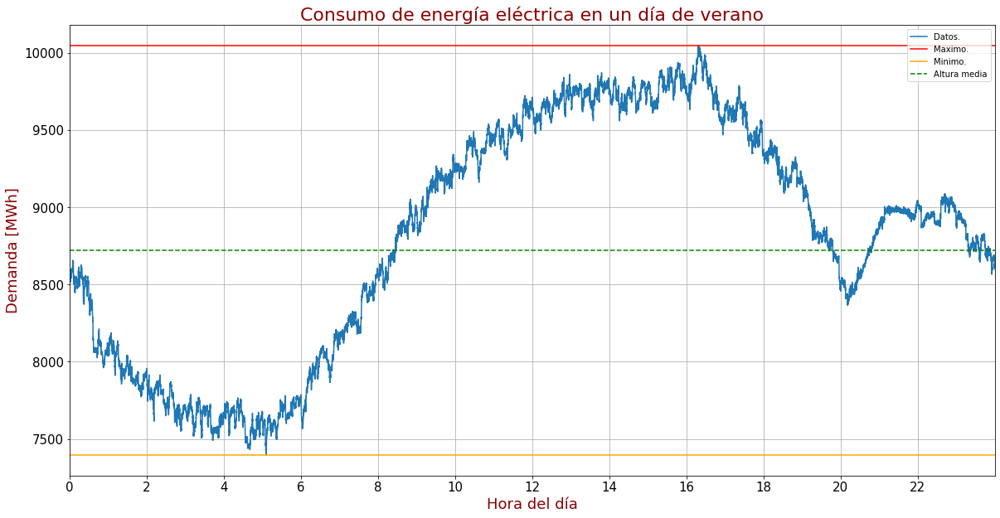

In [32]:
fig = plt.figure(figsize=(20,10))
plt.plot((data_seg.Segundo/3600), data_seg.Demanda)
plt.title("Consumo de energía eléctrica en un día de verano" , fontsize = 22 , color = 'darkred')
plt.xlim(0, 24)
plt.xticks(np.arange(0, 24, step=2))
plt.xlabel('Hora del día', fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda [MWh]', fontsize = 18 , color = 'darkred')
plt.plot(x_values,y_max, color = "red")
plt.plot(x_values,y_min, color = "orange")
plt.plot(x_values,y_prom, "g--")
plt.legend(['Datos.','Maximo.',"Minimo.","Altura media"], loc=1)
plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

### **Consumo de Energía Usando _trapz()_  de un Día**

De manera análoga se encontrará el consumo con *trapz()* a lo largo de un día de la temporada de Invierno, en este caso el 8 de Enero.

In [22]:
data_segundos_inv = pd.read_csv("Invierno_4.csv")

In [19]:
seg = np.linspace(0, 86400, 43201)
a_seg = np.array(seg)
data_seg_inv = pd.DataFrame(seg, columns = ["Segundo"]) 
DEM_INV = pd.DataFrame(data_segundos_inv.Demanda, columns = ["Demanda"])
data_seg_inv["Demanda"] = DEM_INV["Demanda"]
data_seg_inv

,Segundo,Demanda
0,0.0,7284.051758
1,2.0,7287.105957
2,4.0,7292.275391
3,6.0,7294.792969
4,8.0,7298.662109
...,...,...
43196,86392.0,7284.542969
43197,86394.0,7279.739258
43198,86396.0,7277.975098
43199,86398.0,7284.878906


Calculando área bajo la curva usando *trapz()*:

In [23]:
dem_trapz_inv = np.trapz(data_seg_inv.Demanda, data_seg_inv.Segundo)
print(f"{dem_trapz_inv:,.2f}")

680,048,317.46


Calculando área bajo la curva usando la altura media:

In [25]:
dem_inv = data_seg_inv["Demanda"]
dem_max_inv = dem_inv.max()
dem_min_inv = dem_inv.min()
print("Max: ", f"{dem_max_inv:,.2f}")
print("Min: ", f"{dem_min_inv:,.2f}")
prom_inv = (dem_max_inv+dem_min_inv)/2
print("La altura media es:", prom_inv)
dem_prom_inv = ((dem_max_inv+dem_min_inv)/2)*86400
print(f"{dem_prom_inv:,.2f}")

Max:  8,783.64
Min:  6,600.70
La altura media es: 7692.16748046875
664,603,270.31


Diferencia en porcentajes de datos de 1 día de invierno, usando trapz y considerando la altura media:

In [26]:
dif_inv = dem_trapz_inv - dem_prom_inv
dif_pc_inv = dif_inv*100/dem_trapz_inv
print("El cálculo cada 2 segundos arroja un área", f"{dif_pc_inv:,.2f}", "% mayor, que considerando sólo la altura media.")

El cálculo cada 2 segundos arroja un área 2.27 % mayor, que considerando sólo la altura media.


La gráfica se muestra abajo

In [35]:
#Puntos para graficar:
x_values_inv = [0,24]
y_max_inv = [dem_max_inv, dem_max_inv]
y_min_inv = [dem_min_inv, dem_min_inv]
y_prom_inv = [(dem_max_inv+dem_min_inv)/2, (dem_max_inv+dem_min_inv)/2]

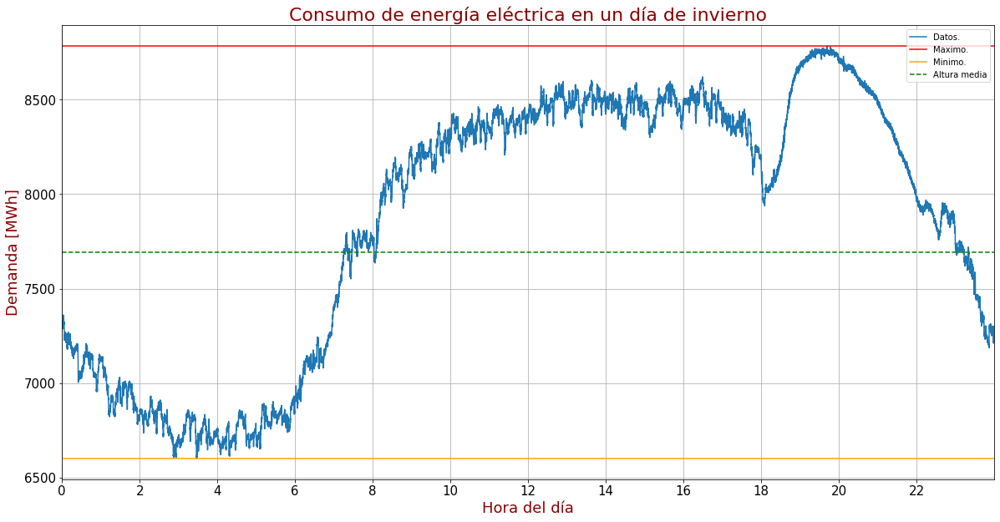

In [36]:
fig = plt.figure(figsize=(20,10))
plt.plot((data_seg_inv.Segundo/3600), data_seg_inv.Demanda)
plt.title("Consumo de energía eléctrica en un día de invierno" , fontsize = 22 , color = 'darkred')
plt.xlim(0, 24)
plt.xticks(np.arange(0, 24, step=2))
plt.xlabel('Hora del día' , fontsize = 18 , color = 'darkred')
plt.ylabel('Demanda [MWh]' , fontsize = 18 , color = 'darkred')
plt.plot(x_values_inv,y_max_inv, color = "red")
plt.plot(x_values_inv,y_min_inv, color = "orange")
plt.plot(x_values_inv,y_prom_inv, "g--")
plt.legend(['Datos.','Maximo.',"Minimo.","Altura media"], loc=1)

plt.yticks(fontsize = 15)
plt.xticks(fontsize = 15)
plt.grid(True)
plt.show()

#### Diferencia en porcentajes de datos de 1 hora, usando trapz y considerando promedio de mínimo y máximo:

In [137]:
dif_1hr = dem_trapz_1hr - dem_prom_1hr
dif_pc_1hr = dif_1hr*100/dem_trapz_1hr
print(f"{dif_pc_1hr:,.2f}", "%")

0.33 %


## **Conclusión**

Recordemos que el propósito de este trabajo es ofrecer un modelo que pueda hacer predicciones para las demandas instantáneas e integradas, así como, hallar métodos más eficientes para obtener la demanda integrada de una hora u otro periódo de tiempo.

+ **Interpoladores**

El modelo falló tanto para la demanda instantánea como para la demanda integrada (consumo), divirgiendo considerablemente apenas para el último dato del conjunto de entrenamiento para todos los casos:  horarios, diarios, semanales y mensuales.


+ **Splines**

A pesar de ajustarse mejor a los datos del conjunto de entrenamiento, presentó de la misma manera, una divergencia enorme alrededor del último dato del conjunto con el que se ajusto para todos los periódos analizados (horarios, diarios, semanales y mensuales)

Algunas de la razones por las cuales estos modelos no se ajustaron para realizar predicciones se debe a que los datos presentan muchas oscilaciones, viendose esto, en la descripción estadística del *dataframe* *Datos_csv.csv*, hay una desviación estándar grande y en los errores cuadráticos medios de los interpoladores. Por otro lado, como se están ajustando datos, con muchas oscilaciones, con polinomios, sabemos que el mayor número de máximos locales que estos presentan son igual a su grado menos, implicando que para datos con oscilaciones grandes y con muchos picos, superando como en nuestro caso al número de máximo locales posibles de los polinomios, estos se vean limtados y no puedan ajustarse, además de presentarse en todos los modelos *overfitting* o *sobreajuste*.

+ **Integrador**

La estimación "real" y la obtenida con promedios es muy aproximada, pero requiere de una gran cantidad de muestras. Concluyendo del análisis que el polinomio de grado que más se acercó a la estimación real es el de grado 60 (61 muestras), mientras que el que le sigue es de grado 5 (6 muestras). Con la mínima cantidad de datos (3) es posible obtener una estimación con hasta 1% de error en las horas analizadas. De esto se estima que el cálculo de energía para cualquier hora sea con parámetros de error similares a los estimados.